## AIM: Train Graph Convulation Networks (GCNs) as multiclass classification models for predicting the psychiatric diagnosis based on EEG features

Standard GCN, and GraphLambda with & without edge attributes for predicting psychiatric diagnosis with statistical features of the power per frequency band per channel group (frontal, central, parietal, occipital) and connectivity features per frequency band per channel group (l/m/r; frontal, central, ). Statistical features are calculated with EC data, EO data and a with the ratio between EC divided by EO.

Have to use features before feature selection, to maintain even dimensions for each graph. Stat features are standardized before training. Models are tuned using multi-objective Optuna, maximizing val f1 and minimizing val loss

In [450]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import os

import optuna

import lightning.pytorch as pl
import torch
import torch_geometric
import torch.nn.functional as F
from torch.nn import Sequential, Linear, ReLU, BatchNorm1d, Dropout, Dropout1d
from torch_geometric.nn import  GCNConv, global_add_pool,GATConv,GINConv, GATv2Conv
from torch_geometric.loader import DataLoader
from torch_geometric.data import Data
from torch_geometric.utils.convert import from_networkx, to_networkx
import lightning.pytorch as pl
from torchmetrics import F1Score, ConfusionMatrix
from lightning.pytorch.tuner import Tuner
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import ModelCheckpoint, TQDMProgressBar, RichProgressBar
from lightning.pytorch.callbacks.early_stopping import EarlyStopping

from optuna.visualization.matplotlib import plot_contour
from optuna.visualization.matplotlib import plot_edf
from optuna.visualization.matplotlib import plot_intermediate_values
from optuna.visualization.matplotlib import plot_optimization_history
from optuna.visualization.matplotlib import plot_parallel_coordinate
from optuna.visualization.matplotlib import plot_param_importances
from optuna.visualization.matplotlib import plot_rank
from optuna.visualization.matplotlib import plot_slice
from optuna.visualization.matplotlib import plot_timeline

### Load data & features

In [451]:
import pickle
def load_file(file):
    with open(file, 'rb') as handle:
        return pickle.load(handle)

In [452]:
# import stat & conn features without feature selection
df_stat_conn_features = pd.read_pickle(r'D:\Documents\RU\Master_Neurobiology\Internship_jaar_2\Project\TD-BRAIN\TD-BRAIN_extracted_features\df_stat_conn_features.pkl')
df_stat_conn_features = df_stat_conn_features.dropna(subset=['diagnosis'])

# label encode diagnosis
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
le.fit(df_stat_conn_features['diagnosis'])
df_stat_conn_features['diagnosis'] = le.transform(df_stat_conn_features['diagnosis'])

print(df_stat_conn_features.shape)
df_stat_conn_features.sample(3)

(2700, 1218)


,ID,diagnosis,epoch,EO_l_frontal_delta_std,EO_l_frontal_delta_mean,EO_l_frontal_delta_median,EO_l_frontal_delta_skew,EO_l_frontal_delta_kurt,EO_l_frontal_theta_std,EO_l_frontal_theta_mean,...,ratio_gamma_m_central-r_central,ratio_gamma_m_central-l_posterior,ratio_gamma_m_central-m_posterior,ratio_gamma_m_central-r_posterior,ratio_gamma_r_central-l_posterior,ratio_gamma_r_central-m_posterior,ratio_gamma_r_central-r_posterior,ratio_gamma_l_posterior-m_posterior,ratio_gamma_l_posterior-r_posterior,ratio_gamma_m_posterior-r_posterior
2505,sub-88069793,2,10,0.047838,0.049537,0.049537,2.391414,6.904776,0.070717,0.072146,...,1.018363,1.037347,1.026003,1.036005,1.055514,1.036974,1.045259,1.033741,1.054557,1.037867
1363,sub-88040317,0,8,0.066110,0.085778,0.085778,1.265460,1.476141,0.035549,0.063037,...,1.066728,1.038574,1.048029,1.053885,1.040996,1.055984,1.040404,1.012745,1.016991,1.026482
1539,sub-88046349,2,4,0.117104,0.107707,0.107707,2.427878,6.444898,0.046520,0.062993,...,0.946653,0.918204,0.940089,0.930986,0.959590,0.965878,0.986199,0.976162,0.962184,0.971697


In [453]:
# create 3 feature sets [EC, EO, ratio] with column ['ID', 'age', 'gender', 'diagnosis', 'epoch']
df_stat_conn_features_ec = df_stat_conn_features[df_stat_conn_features.columns[~(df_stat_conn_features.columns.str.startswith('EO') | df_stat_conn_features.columns.str.startswith('ratio'))]]
df_stat_conn_features_eo = df_stat_conn_features[df_stat_conn_features.columns[~(df_stat_conn_features.columns.str.startswith('EC') | df_stat_conn_features.columns.str.startswith('ratio'))]]
df_stat_conn_features_ratio = df_stat_conn_features[df_stat_conn_features.columns[~(df_stat_conn_features.columns.str.startswith('EC') | df_stat_conn_features.columns.str.startswith('EO'))]]
print(df_stat_conn_features_ratio.shape)
print(df_stat_conn_features_ec.shape)
print(df_stat_conn_features_eo.shape)

(2700, 408)
(2700, 408)
(2700, 408)


In [454]:
synchrony_feature_dict = load_file(r'D:\Documents\RU\Master_Neurobiology\Internship_jaar_2\Project\TD-BRAIN\TD-BRAIN_extracted_features\synchrony_feature_dict.pkl')
subjects_ec_syncro_matrices = synchrony_feature_dict['EC_syncro']
subjects_eo_syncro_matrices = synchrony_feature_dict['EO_syncro']
subjects_ec_ids = synchrony_feature_dict['EC_IDs']
subjects_eo_ids = synchrony_feature_dict['EO_IDs']
print(len(subjects_ec_syncro_matrices), len(subjects_eo_syncro_matrices))
print(len(subjects_ec_ids), len(subjects_eo_ids))
print(subjects_ec_syncro_matrices[0].shape)
print(subjects_ec_ids[0])

224 225
224 225
(12, 5, 9, 9)
sub-87964717


In [455]:
# compute ratio [EC/EO] synchrony matrices

# Convert the lists to sets
subjects_ec_ids_set = set(subjects_ec_ids)
subjects_eo_ids_set = set(subjects_eo_ids)

# find the missing IDs to make sure ratio is computed within the same participant
missing_ids = subjects_eo_ids_set - subjects_ec_ids_set
missing_ids_indices = [subjects_eo_ids.index(id) for id in missing_ids]

# remove missing IDs from EO
ratio_subjects_eo_syncro_matrices = [matrix for i, matrix in enumerate(subjects_eo_syncro_matrices) if i not in missing_ids_indices]
assert len(ratio_subjects_eo_syncro_matrices) == len(subjects_ec_syncro_matrices)

# compute ratio
subjects_ratio_syncro_matrices = []
for i in range(len(subjects_ec_syncro_matrices)):
    ratio_matrix = subjects_ec_syncro_matrices[i] / ratio_subjects_eo_syncro_matrices[i]
    subjects_ratio_syncro_matrices.append(ratio_matrix)
subjects_ratio_ids = subjects_ec_ids
print(len(subjects_ratio_syncro_matrices), len(subjects_ratio_ids))

224 224


C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1473655494.py:18: RuntimeWarning: invalid value encountered in divide
  ratio_matrix = subjects_ec_syncro_matrices[i] / ratio_subjects_eo_syncro_matrices[i]


In [456]:
# define function to store features in PyTorch Geometric Data objects
import networkx as nx
from joblib import Parallel, delayed # for parallel processing
from tqdm import tqdm
def process_subject(syncros, subject_id, df_features):
    graph_dataset = []
    y_list = []

    # obtain statistical features for subject
    subject_stat_features = df_features[df_features['ID'] == subject_id]
    stat_columns = ['epoch', 'mean', 'median', 'std', 'kurt', 'skew'] # select statistical features
    pattern = '|'.join(stat_columns)  # create a pattern string
    subject_stat_features = subject_stat_features[subject_stat_features.columns[subject_stat_features.columns.str.contains(pattern)]]
    
    for epoch, syncro_matrices in enumerate(syncros):
        num_edges = int(syncro_matrices.shape[1] * (syncro_matrices.shape[2]))
        bands = syncro_matrices.shape[0]
        edge_attrs = np.zeros((num_edges, bands)) # create empty array to store edge weights for each frequency band

        for i, syncro_matrix in enumerate(syncro_matrices):
            # print(f'{syncro_matrix.shape = }')
            syncro_graph = nx.from_numpy_array(syncro_matrix, create_using=nx.DiGraph)
            # Add diagonal as self-loops
            for node in range(syncro_matrix.shape[0]):  # Assuming syncro_matrix is square
                syncro_graph.add_edge(node, node, weight=1)
            # print(f'{syncro_graph = }')
            # print(f'{syncro_graph.edges =}')
            edge_list = nx.to_pandas_edgelist(syncro_graph)
            edge_list = edge_list.dropna(axis=0)
            # print(f'{edge_list = }')
            edge_index = edge_list.iloc[:,0:2].values.T # shape (2, num_edges), edge_index stays the same for all bands right?
            # print(f'{edge_index = }')
            edge_attr = edge_list.iloc[:,2].values#.reshape(-1,1)
            edge_attrs[:,i] = edge_attr

        y = df_stat_conn_features_ec[df_stat_conn_features_ec['ID'] == subject_id]['diagnosis'].values[0]
        
        # store statistical features for subject
        ch_groups = ['l_frontal', 'm_frontal', 'r_frontal', 'l_central', 'm_central', 'r_central', 'l_posterior', 'm_posterior', 'r_posterior']
        bands = ['delta', 'theta', 'alpha', 'beta', 'gamma']
        x = np.zeros((len(ch_groups), len(bands) * (len(stat_columns)-1))) # -1 because of epochs column in stat_columns
        # print(x.shape)
        for num, ch_group in enumerate(ch_groups):
            x[num] = subject_stat_features[subject_stat_features['epoch'] == (epoch + 1)][subject_stat_features.columns[subject_stat_features.columns.str.contains(ch_group)]].values[0]
            

        data = Data(x=torch.tensor(x, dtype=torch.float),                     # Node features [num_nodes, num_node_features]
                    edge_index=torch.tensor(edge_index, dtype=torch.long),    # Adjacency matrix [2, num_edges]
                    edge_attr=torch.tensor(edge_attrs,dtype=torch.float),  # Edge features [num_edges, num_edge_features]
                    y=torch.tensor([y], dtype=torch.long))                    # Target/Label (it should be a list) --> torch.long for classification, torch.float for regression
        graph_dataset.append(data)
        y_list.append(y)

    return graph_dataset, y_list

In [457]:
# retrieve and store data for EC features
# subjects__ec/eo_syncro_matrices : A list of lists, every list is a subject, every element in that list is an array of shape [n_epochs, n_bands, n_channels, n_channels]

results = Parallel(n_jobs=-1)(delayed(process_subject)(syncros, subject_id, df_stat_conn_features_ec) for syncros, subject_id in tqdm(zip(subjects_ec_syncro_matrices, subjects_ec_ids), total=len(subjects_ec_syncro_matrices)))

ec_graph_dataset = []
ec_y_list = []
for result in results:
    ec_graph_dataset.extend(result[0])
    ec_y_list.extend(result[1])
    
assert len(ec_graph_dataset) == len(ec_y_list)

print(f'{ec_graph_dataset[0].x.shape = }, stat features [num_nodes, num_node_features]')
print(f'{ec_graph_dataset[0].edge_attr.shape = }, [num_edges, n_bands]')
print(f'{ec_graph_dataset[0].edge_index.shape = }, [2, num_edges]')
print(f'{len(ec_graph_dataset) = }, subjects: {len(subjects_ec_syncro_matrices)}, epochs: {len(subjects_ec_syncro_matrices[0])}')
print(f'{ec_graph_dataset[0] = }')

100%|██████████| 224/224 [00:22<00:00, 10.04it/s]


ec_graph_dataset[0].x.shape = torch.Size([9, 25]), stat features [num_nodes, num_node_features]
ec_graph_dataset[0].edge_attr.shape = torch.Size([81, 5]), [num_edges, n_bands]
ec_graph_dataset[0].edge_index.shape = torch.Size([2, 81]), [2, num_edges]
len(ec_graph_dataset) = 2688, subjects: 224, epochs: 12
ec_graph_dataset[0] = Data(x=[9, 25], edge_index=[2, 81], edge_attr=[81, 5], y=[1])


In [458]:
# retrieve and store data for EO features
# subjects__ec/eo_syncro_matrices : A list of lists, every list is a subject, every element in that list is an array of shape [n_epochs, n_bands, n_channels, n_channels]

results = Parallel(n_jobs=-1)(delayed(process_subject)(syncros, subject_id, df_stat_conn_features_eo) for syncros, subject_id in tqdm(zip(subjects_eo_syncro_matrices, subjects_eo_ids), total=len(subjects_eo_syncro_matrices)))

eo_graph_dataset = []
eo_y_list = []
for result in results:
    eo_graph_dataset.extend(result[0])
    eo_y_list.extend(result[1])
    
assert len(eo_graph_dataset) == len(eo_y_list)

print(f'{eo_graph_dataset[0].x.shape = }, stat features [num_nodes, num_node_features]')
print(f'{eo_graph_dataset[0].edge_attr.shape = }, [num_edges, n_bands]')
print(f'{eo_graph_dataset[0].edge_index.shape = }, [2, num_edges]')
print(f'{len(eo_graph_dataset) = }, subjects: {len(subjects_eo_syncro_matrices)}, epochs: {len(subjects_eo_syncro_matrices[0])}')
print(f'{eo_graph_dataset[0] = }')

100%|██████████| 225/225 [00:07<00:00, 31.79it/s]


eo_graph_dataset[0].x.shape = torch.Size([9, 25]), stat features [num_nodes, num_node_features]
eo_graph_dataset[0].edge_attr.shape = torch.Size([81, 5]), [num_edges, n_bands]
eo_graph_dataset[0].edge_index.shape = torch.Size([2, 81]), [2, num_edges]
len(eo_graph_dataset) = 2700, subjects: 225, epochs: 12
eo_graph_dataset[0] = Data(x=[9, 25], edge_index=[2, 81], edge_attr=[81, 5], y=[1])


In [459]:
# retrieve and store data for EO features
# subjects__ec/eo_syncro_matrices : A list of lists, every list is a subject, every element in that list is an array of shape [n_epochs, n_bands, n_channels, n_channels]

results = Parallel(n_jobs=-1)(delayed(process_subject)(syncros, subject_id, df_stat_conn_features_ratio) for syncros, subject_id in tqdm(zip(subjects_ratio_syncro_matrices, subjects_ratio_ids), total=len(subjects_ratio_syncro_matrices)))

# process_subject(subjects_ratio_syncro_matrices[0], subjects_ratio_ids[0])

ratio_graph_dataset = []
ratio_y_list = []
for result in results:
    ratio_graph_dataset.extend(result[0])
    ratio_y_list.extend(result[1])
    
assert len(ratio_graph_dataset) == len(ratio_y_list)

print(f'{ratio_graph_dataset[0].x.shape = }, stat features [num_nodes, num_node_features]')
print(f'{ratio_graph_dataset[0].edge_attr.shape = }, [num_edges, n_bands]')
print(f'{ratio_graph_dataset[0].edge_index.shape = }, [2, num_edges]')
print(f'{len(ratio_graph_dataset) = }, subjects: {len(subjects_ratio_syncro_matrices)}, epochs: {len(subjects_ratio_syncro_matrices[0])}')
print(f'{ratio_graph_dataset[0] = }')

100%|██████████| 224/224 [00:07<00:00, 28.22it/s]


ratio_graph_dataset[0].x.shape = torch.Size([9, 25]), stat features [num_nodes, num_node_features]
ratio_graph_dataset[0].edge_attr.shape = torch.Size([81, 5]), [num_edges, n_bands]
ratio_graph_dataset[0].edge_index.shape = torch.Size([2, 81]), [2, num_edges]
len(ratio_graph_dataset) = 2688, subjects: 224, epochs: 12
ratio_graph_dataset[0] = Data(x=[9, 25], edge_index=[2, 81], edge_attr=[81, 5], y=[1])


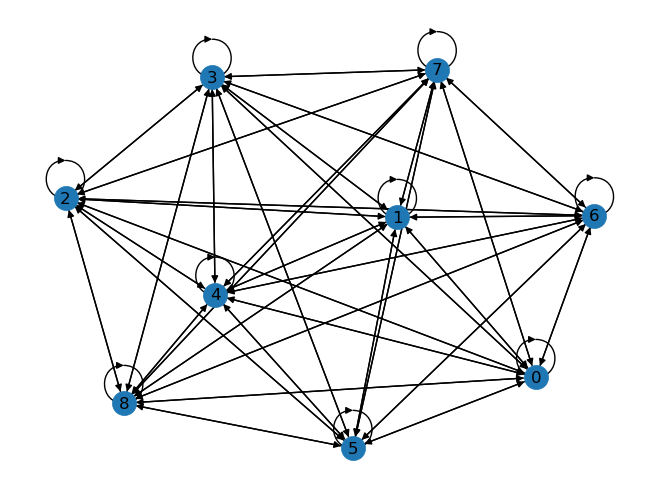

In [460]:
nx.draw(to_networkx(ratio_graph_dataset[0]), with_labels=True)

In [461]:
# load the indices of the validation sets from the ML models
data_split_indices = load_file('data_split_indices.pkl')

# GCN models:

### GCNConv with log_softmax activation function and NLLLoss

In [462]:
#Model
import lightning.pytorch as pl
from torchmetrics import F1Score, ConfusionMatrix
from torch.nn import Dropout1d
import seaborn as sns
import matplotlib.pyplot as plt

n_features = 25 # [Delta, Theta, Alpha, Beta, Gamma] * [mean, median, std, skew, kurt]
param = 64
num_classes = 5 # healthy, ADHD, MDD, OCD, SMC

class GCN(pl.LightningModule):
    def __init__(self, learning_rate, optimizer_name, dropout):
        super(GCN, self).__init__()
        self.learning_rate = learning_rate
        self.optimizer_name = optimizer_name

        self.conv1 = GCNConv(n_features, param, cached=False) # if you defined cache=True, the shape of batch must be same!
        self.bn1 = BatchNorm1d(param)
        self.do1 = Dropout1d(p=dropout)
        self.conv2 = GCNConv(param, param, cached=False)
        self.bn2 = BatchNorm1d(param)
        self.do2 = Dropout1d(p=dropout)
        self.fc1 = Linear(param, param)
        self.bn3 = BatchNorm1d(param)
        self.do3 = Dropout1d(p=dropout)
        self.fc2 = Linear(param, 8)
        self.fc3 = Linear(8, num_classes)

        # add metrics
        self.train_f1 = F1Score(task='multiclass', num_classes=num_classes, average='macro')
        self.val_f1 = F1Score(task='multiclass', num_classes=num_classes, average='macro')
        self.val_cm = ConfusionMatrix(task = 'binary', num_classes=num_classes, threshold=0.05)
        self.validation_step_yhats = []
        self.validation_step_ys = []

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = F.relu(self.conv1(x, edge_index))
        x = self.bn1(x)
        x = self.do1(x)
        x = F.relu(self.conv2(x, edge_index))
        x = self.bn2(x)
        x = self.do2(x)
        x = global_add_pool(x, data.batch)
        x = F.relu(self.fc1(x))
        x = self.bn3(x)
        x = self.do3(x)
        x = F.relu(self.fc2(x))
        #x = F.dropout(x, p=0.2, training=self.training)
        x = torch.flatten(x, start_dim=1)
        x = self.fc3(x)
        x = F.log_softmax(x, dim=1) # Activation function for classification
        return x
    
    def configure_optimizers(self):
        if self.optimizer_name == 'Adam':
            optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        elif self.optimizer_name == 'RMSprop':
            optimizer = torch.optim.RMSprop(self.parameters(), lr=self.learning_rate)
        elif self.optimizer_name == 'SGD':
            optimizer = torch.optim.SGD(self.parameters(), lr=self.learning_rate)
        else:
            raise ValueError(f'Unsupported optimizer: {self.optimizer_name}')
        return optimizer
    
    def training_step(self, train_batch, batch_idx):
            x, y = train_batch.x, train_batch.y
            output = self.forward(train_batch)
            loss = F.nll_loss(output, y)
            y_hat = output.argmax(dim=1)
            self.log('train_loss', loss, on_epoch=True, prog_bar=True)
            self.log('train_f1', self.train_f1(y, y_hat), on_epoch=True, prog_bar=True)
            return loss
    
    def validation_step(self, val_batch, batch_idx):
        x, y = val_batch.x, val_batch.y
        output = self.forward(val_batch)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        self.log('val_loss', loss, on_epoch=True, prog_bar=True)
        self.log('val_f1', self.val_f1(y, y_hat), on_epoch=True, prog_bar=True)
        self.validation_step_yhats.append(y_hat)
        self.validation_step_ys.append(y)
        return loss
    
    def test_step(self, test_batch, batch_idx):
        x, y = test_batch.x, test_batch.y
        output = self.forward(test_batch)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        self.log('test_loss', loss, on_epoch=True, prog_bar=True)
        self.log('test_f1', self.val_f1(y, y_hat), on_epoch=True, prog_bar=True)
        return loss

    # def on_train_epoch_end(self, training_step_outputs):
    #     # compute metrics
    #     train_f1 = self.train_f1.compute()
    #     # log metrics
    #     self.log("epoch_train_f1", train_f1)
    #     # reset all metrics
    #     self.train_f1.reset()
    #     print(f"\nf1: {train_f1:.4}")

    # def on_validation_epoch_end(self):
    #     # plot confusion matrix
    #     y_hat = torch.cat(self.validation_step_yhats)
    #     y = torch.cat(self.validation_step_ys)
    #     confusion_matrix = self.val_cm(y_hat, y.int())

    #     confusion_matrix_computed = confusion_matrix.detach().cpu().numpy().astype(int)

    #     df_cm = pd.DataFrame(confusion_matrix_computed)
    #     plt.figure(figsize = (10,7))
    #     fig_ = sns.heatmap(df_cm, annot=True, cmap='Spectral').get_figure()
    #     plt.close(fig_)
    #     self.loggers[0].experiment.add_figure("Confusion matrix", fig_, self.current_epoch)

    #     self.validation_step_yhats.clear() # free memory
    #     self.validation_step_ys.clear()
    
    def predict_step(self, batch):
        x, y = batch.x, batch.y
        output = self.forward(batch)
        y_hat = output.argmax(dim=1)
        return y_hat


    # def backward(self, trainer, loss, optimizer, optimizer_idx):
    #     loss.backward()
    
    # def optimizer_step(self, epoch, batch_idx, optimizer, optimizer_idx):
    #     optimizer.step()
    #     optimizer.zero_grad()

### Model: graphLambda without edge_attr

In [463]:
import lightning.pytorch as pl
from torchmetrics import F1Score, ConfusionMatrix
import seaborn as sns
import matplotlib.pyplot as plt
import torch
import torch_geometric
from torch.nn import Sequential, Linear, ReLU, BatchNorm1d, Dropout, Dropout1d, ModuleList
import torch.nn.functional as F
from torch_geometric.nn import  GCNConv, global_add_pool, GATConv, GINConv


n_features = 25 # [Delta, Theta, Alpha, Beta, Gamma] * [mean, median, std, skew, kurt]
num_classes = 5 # healthy, ADHD, MDD, OCD, SMC

class graphLambda_wo_edge_attr(pl.LightningModule):
    def __init__(self, learning_rate, optimizer_name, fc_layers, dropout):
        super(graphLambda_wo_edge_attr, self).__init__()
        self.learning_rate = learning_rate
        self.optimizer_name = optimizer_name

        #GCN-representation
        self.conv1 = GCNConv(n_features, 256, cached=False )
        self.bn01 = BatchNorm1d(256)
        self.conv2 = GCNConv(256, 128, cached=False )
        self.bn02 = BatchNorm1d(128)
        self.conv3 = GCNConv(128, 128, cached=False)
        self.bn03 = BatchNorm1d(128)
        #GAT-representation
        self.gat1 = GATConv(n_features, 256, heads=3)
        self.bn11 = BatchNorm1d(256*3)
        self.gat2 = GATConv(256*3, 128, heads=3)
        self.bn12 = BatchNorm1d(128*3)
        self.gat3 = GATConv(128*3, 128, heads=3)
        self.bn13 = BatchNorm1d(128*3)
        #GIN-representation
        fc_gin1=Sequential(Linear(n_features, 256), ReLU(), Linear(256, 256))
        self.gin1 = GINConv(fc_gin1)
        self.bn21 = BatchNorm1d(256)
        fc_gin2=Sequential(Linear(256, 128), ReLU(), Linear(128, 128))
        self.gin2 = GINConv(fc_gin2)
        self.bn22 = BatchNorm1d(128)
        fc_gin3=Sequential(Linear(128, 64), ReLU(), Linear(64, 64))
        self.gin3 = GINConv(fc_gin3)
        self.bn23 = BatchNorm1d(64)
        # Fully connected layers for concatinating outputs (varied depending on fc_layers)
        self.fcs = ModuleList()
        self.dropouts = ModuleList()
        input_size = 128*4 + 64 # Input size for the first layer
        output_size = num_classes # Output size for the last layer
        sizes = np.linspace(input_size, output_size, fc_layers + 1, dtype=int) # Calculate the size for each layer
        for i in range(fc_layers): # Create the layers
            self.fcs.append(Linear(sizes[i], sizes[i + 1]))
            self.dropouts.append(Dropout(p=dropout))

        # add metrics
        self.train_f1 = F1Score(task='multiclass', num_classes=num_classes, average='macro')
        self.val_f1 = F1Score(task='multiclass', num_classes=num_classes, average='macro')
        self.val_cm = ConfusionMatrix(task = 'binary', num_classes=num_classes, threshold=0.05)
        self.validation_step_yhats = []
        self.validation_step_ys = []
        
    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        y=x
        z=x
        #GCN-representation
        x = F.relu(self.conv1(x, edge_index))
        x = self.bn01(x)
        x = F.relu(self.conv2(x, edge_index))
        x = self.bn02(x)
        x = F.relu(self.conv3(x, edge_index))
        x = self.bn03(x)
        x = global_add_pool(x, data.batch)
        #GAT-representation
        y = F.relu(self.gat1(y, edge_index))
        y = self.bn11(y)
        y = F.relu(self.gat2(y, edge_index))
        y = self.bn12(y)
        y = F.relu(self.gat3(y, edge_index))
        y = self.bn13(y)
        y = global_add_pool(y, data.batch)
        #GIN-representation
        z = F.relu(self.gin1(z, edge_index))
        z = self.bn21(z)
        z = F.relu(self.gin2(z, edge_index))
        z = self.bn22(z)
        z = F.relu(self.gin3(z, edge_index))
        z = self.bn23(z)
        z = global_add_pool(z, data.batch)
        #Concatinating_representations
        cr=torch.cat((x,y,z),1)
        for fc, dropout in zip(self.fcs, self.dropouts):
            cr = F.relu(fc(cr))
            cr = dropout(cr)
        #cr = F.relu(cr).view(-1)
        cr = F.log_softmax(cr, dim=1) # Activation function for classification
        return cr  
    
    def configure_optimizers(self):
        if self.optimizer_name == 'Adam':
            optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        elif self.optimizer_name == 'RMSprop':
            optimizer = torch.optim.RMSprop(self.parameters(), lr=self.learning_rate)
        elif self.optimizer_name == 'SGD':
            optimizer = torch.optim.SGD(self.parameters(), lr=self.learning_rate)
        else:
            raise ValueError(f'Unsupported optimizer: {self.optimizer_name}')
        return optimizer
    
    def training_step(self, train_batch, batch_idx):
        x, y = train_batch.x, train_batch.y
        output = self.forward(train_batch)
        output = output.to(torch.float)
        y = y.to(torch.long)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        self.log('train_loss', loss, on_epoch=True, prog_bar=True)
        self.log('train_f1', self.train_f1(y, y_hat), on_epoch=True, prog_bar=True)
        return loss
    
    def validation_step(self, val_batch, batch_idx):
        x, y = val_batch.x, val_batch.y
        output = self.forward(val_batch)
        output = output.to(torch.float)
        y = y.to(torch.long)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        self.log('val_loss', loss, on_epoch=True, prog_bar=True)
        self.log('val_f1', self.val_f1(y, y_hat), on_epoch=True, prog_bar=True)
        self.validation_step_yhats.append(y_hat)
        self.validation_step_ys.append(y)
        return loss
    
    def test_step(self, test_batch, batch_idx):
        x, y = test_batch.x, test_batch.y
        output = self.forward(test_batch)
        output = output.to(torch.float)
        y = y.to(torch.long)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        self.log('test_loss', loss, on_epoch=True, prog_bar=True)
        self.log('test_f1', self.val_f1(y, y_hat), on_epoch=True, prog_bar=True)
        return loss
    
    # def on_train_epoch_end(self, training_step_outputs):
    #     # compute metrics
    #     train_f1 = self.train_f1.compute()
    #     # log metrics
    #     self.log("epoch_train_f1", train_f1)
    #     # reset all metrics
    #     self.train_f1.reset()
    #     print(f"\nf1: {train_f1:.4}")

    # def on_validation_epoch_end(self):
    #     # plot confusion matrix
    #     y_hat = torch.cat(self.validation_step_yhats)
    #     y = torch.cat(self.validation_step_ys)
    #     confusion_matrix = self.val_cm(y_hat, y.int())

    #     confusion_matrix_computed = confusion_matrix.detach().cpu().numpy().astype(int)

    #     df_cm = pd.DataFrame(confusion_matrix_computed)
    #     plt.figure(figsize = (10,7))
    #     fig_ = sns.heatmap(df_cm, annot=True, cmap='Spectral').get_figure()
    #     plt.close(fig_)
    #     self.loggers[0].experiment.add_figure("Confusion matrix", fig_, self.current_epoch)

    #     self.validation_step_yhats.clear() # free memory
    #     self.validation_step_ys.clear()
    
    def predict_step(self, batch):
        x, y = batch.x, batch.y
        output = self.forward(batch)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        return y_hat

### Model: graphLambda with edge_attr

In [464]:
#Model
import lightning.pytorch as pl
from torchmetrics import F1Score, ConfusionMatrix
import seaborn as sns
import matplotlib.pyplot as plt
import torch
import torch_geometric
from torch.nn import Sequential, Linear, ReLU, BatchNorm1d, Dropout, Dropout1d, ModuleList
import torch.nn.functional as F
from torch_geometric.nn import  GCNConv, global_add_pool, GATConv, GINConv, GATv2Conv


n_features = 25 # [Delta, Theta, Alpha, Beta, Gamma] * [mean, median, std, skew, kurt]
num_classes = 5 # healthy, ADHD, MDD, OCD, SMC
n_edge_attrs = 5 # [Delta, Theta, Alpha, Beta, Gamma]

class graphLambda_w_edge_attr(pl.LightningModule):
    def __init__(self, learning_rate, optimizer_name, fc_layers, dropout):
        super(graphLambda_w_edge_attr, self).__init__()
        self.learning_rate = learning_rate
        self.optimizer_name = optimizer_name

        #GCN-representation
        self.conv1 = GCNConv(n_features, 256, cached=False )
        self.bn01 = BatchNorm1d(256)
        self.conv2 = GCNConv(256, 128, cached=False )
        self.bn02 = BatchNorm1d(128)
        self.conv3 = GCNConv(128, 128, cached=False)
        self.bn03 = BatchNorm1d(128)
        #GAT-representation
        self.gat1 = GATv2Conv(n_features, 256, heads=3, edge_dim=n_edge_attrs)
        self.bn11 = BatchNorm1d(256*3)
        self.gat2 = GATv2Conv(256*3, 128, heads=3, edge_dim=n_edge_attrs)
        self.bn12 = BatchNorm1d(128*3)
        self.gat3 = GATv2Conv(128*3, 128, heads=3, edge_dim=n_edge_attrs)
        self.bn13 = BatchNorm1d(128*3)
        #GIN-representation
        fc_gin1=Sequential(Linear(n_features, 256), ReLU(), Linear(256, 256))
        self.gin1 = GINConv(fc_gin1)
        self.bn21 = BatchNorm1d(256)
        fc_gin2=Sequential(Linear(256, 128), ReLU(), Linear(128, 128))
        self.gin2 = GINConv(fc_gin2)
        self.bn22 = BatchNorm1d(128)
        fc_gin3=Sequential(Linear(128, 64), ReLU(), Linear(64, 64))
        self.gin3 = GINConv(fc_gin3)
        self.bn23 = BatchNorm1d(64)
        # Fully connected layers for concatinating outputs (varied depending on fc_layers)
        self.fcs = ModuleList()
        self.dropouts = ModuleList()
        input_size = 128*4 + 64 # Input size for the first layer
        output_size = num_classes # Output size for the last layer
        sizes = np.linspace(input_size, output_size, fc_layers + 1, dtype=int) # Calculate the size for each layer
        for i in range(fc_layers): # Create the layers
            self.fcs.append(Linear(sizes[i], sizes[i + 1]))
            self.dropouts.append(Dropout(p=dropout))

        # add metrics
        self.train_f1 = F1Score(task='multiclass', num_classes=num_classes, average='macro')
        self.val_f1 = F1Score(task='multiclass', num_classes=num_classes, average='macro')
        self.val_cm = ConfusionMatrix(task = 'binary', num_classes=num_classes, threshold=0.05)
        self.validation_step_yhats = []
        self.validation_step_ys = []
        
    def forward(self, data):
        x, edge_index, edge_attr = data.x, data.edge_index, data.edge_attr
        y=x
        z=x
        #GCN-representation
        x = F.relu(self.conv1(x, edge_index))
        x = self.bn01(x)
        x = F.relu(self.conv2(x, edge_index))
        x = self.bn02(x)
        x = F.relu(self.conv3(x, edge_index))
        x = self.bn03(x)
        x = global_add_pool(x, data.batch)
        #GAT-representation
        y = F.relu(self.gat1(y, edge_index, edge_attr))
        y = self.bn11(y)
        y = F.relu(self.gat2(y, edge_index, edge_attr))
        y = self.bn12(y)
        y = F.relu(self.gat3(y, edge_index, edge_attr))
        y = self.bn13(y)
        y = global_add_pool(y, data.batch)
        #GIN-representation
        z = F.relu(self.gin1(z, edge_index))
        z = self.bn21(z)
        z = F.relu(self.gin2(z, edge_index))
        z = self.bn22(z)
        z = F.relu(self.gin3(z, edge_index))
        z = self.bn23(z)
        z = global_add_pool(z, data.batch)
        #Concatinating_representations
        cr=torch.cat((x,y,z),1)
        for fc, dropout in zip(self.fcs, self.dropouts):
            cr = F.relu(fc(cr))
            cr = dropout(cr)
        #cr = F.relu(cr).view(-1)
        cr = F.log_softmax(cr, dim=1) # Activation function for classification
        return cr  
    
    def configure_optimizers(self):
        if self.optimizer_name == 'Adam':
            optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        elif self.optimizer_name == 'RMSprop':
            optimizer = torch.optim.RMSprop(self.parameters(), lr=self.learning_rate)
        elif self.optimizer_name == 'SGD':
            optimizer = torch.optim.SGD(self.parameters(), lr=self.learning_rate)
        else:
            raise ValueError(f'Unsupported optimizer: {self.optimizer_name}')
        return optimizer
    
    def training_step(self, train_batch, batch_idx):
        x, y = train_batch.x, train_batch.y
        output = self.forward(train_batch)
        output = output.to(torch.float)
        y = y.to(torch.long)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        self.log('train_loss', loss, on_epoch=True, prog_bar=True)
        self.log('train_f1', self.train_f1(y, y_hat), on_epoch=True, prog_bar=True)
        return loss
    
    def validation_step(self, val_batch, batch_idx):
        x, y = val_batch.x, val_batch.y
        output = self.forward(val_batch)
        output = output.to(torch.float)
        y = y.to(torch.long)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        self.log('val_loss', loss, on_epoch=True, prog_bar=True)
        self.log('val_f1', self.val_f1(y, y_hat), on_epoch=True, prog_bar=True)
        self.validation_step_yhats.append(y_hat)
        self.validation_step_ys.append(y)
        return loss
    
    def test_step(self, test_batch, batch_idx):
        x, y = test_batch.x, test_batch.y
        output = self.forward(test_batch)
        output = output.to(torch.float)
        y = y.to(torch.long)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        self.log('test_loss', loss, on_epoch=True, prog_bar=True)
        self.log('test_f1', self.val_f1(y, y_hat), on_epoch=True, prog_bar=True)
        return loss
    
    # def on_train_epoch_end(self, training_step_outputs):
    #     # compute metrics
    #     train_f1 = self.train_f1.compute()
    #     # log metrics
    #     self.log("epoch_train_f1", train_f1)
    #     # reset all metrics
    #     self.train_f1.reset()
    #     print(f"\nf1: {train_f1:.4}")

    # def on_validation_epoch_end(self):
    #     # plot confusion matrix
    #     y_hat = torch.cat(self.validation_step_yhats)
    #     y = torch.cat(self.validation_step_ys)
    #     confusion_matrix = self.val_cm(y_hat, y.int())

    #     confusion_matrix_computed = confusion_matrix.detach().cpu().numpy().astype(int)

    #     df_cm = pd.DataFrame(confusion_matrix_computed)
    #     plt.figure(figsize = (10,7))
    #     fig_ = sns.heatmap(df_cm, annot=True, cmap='Spectral').get_figure()
    #     plt.close(fig_)
    #     self.loggers[0].experiment.add_figure("Confusion matrix", fig_, self.current_epoch)

    #     self.validation_step_yhats.clear() # free memory
    #     self.validation_step_ys.clear()
    
    def predict_step(self, batch):
        x, y = batch.x, batch.y
        output = self.forward(batch)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        return y_hat

# 1. EC feature set

In [465]:
# split the data into train, validation and test sets, using the same split as one of the baseline models using nested cross-validation
baseline_train_idxs = data_split_indices['EC'][0]
baseline_val_idxs = data_split_indices['EC'][1]
baseline_test_idxs = data_split_indices['EC'][2]

# first splitting validation data using the first split from the baseline RF model
groups = [elem for elem in subjects_ec_ids for i in range(12)] # times 12 for each epoch

print(f'{len(ec_graph_dataset) = }')
print(f'{len(baseline_train_idxs) = }, {len(baseline_val_idxs) = }, {len(baseline_test_idxs) = } total: {len(baseline_train_idxs)+len(baseline_val_idxs)+len(baseline_test_idxs)}')

X_train = [ec_graph_dataset[i] for i in baseline_train_idxs] 
X_val = [ec_graph_dataset[i] for i in baseline_val_idxs]
X_test = [ec_graph_dataset[i] for i in baseline_test_idxs]
Y_train =[ec_y_list[i] for i in baseline_train_idxs]
Y_val = [ec_y_list[i] for i in baseline_val_idxs]
Y_test = [ec_y_list[i] for i in baseline_test_idxs]
groups_train = [groups[i] for i in baseline_train_idxs]
groups_val = [groups[i] for i in baseline_val_idxs]
groups_test = [groups[i] for i in baseline_test_idxs]

len(ec_graph_dataset) = 2688
len(baseline_train_idxs) = 1428, len(baseline_val_idxs) = 720, len(baseline_test_idxs) = 540 total: 2688


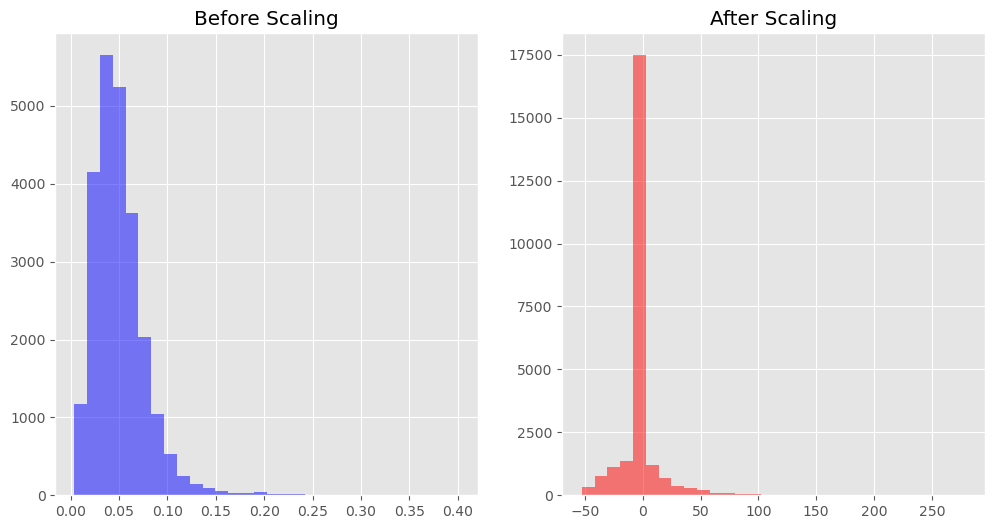

In [466]:
# standardize statistical node features
from sklearn.preprocessing import StandardScaler

# Concatenate all x values before scaling for the first feature, as a sanity check for standardization
x_before = np.concatenate([data.x.numpy()[:, 0] for data in X_train + X_val + X_test])

scaler = StandardScaler()
scaler.fit(np.vstack([data.x.numpy() for data in X_train + X_val]))


# Transform the x values of the data in X_train
for data in X_train:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Transform the x values of the data in X_val
for data in X_val:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Transform the x values of the data in X_test
for data in X_test:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Concatenate all x values after scaling for the first feature, as a sanity check for standardization
x_after = np.concatenate([data.x.numpy()[:, 0] for data in X_train + X_val + X_test])

# Plot the distribution of the first x feature before and after scaling as a sanity check
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(x_before, bins=30, color='b', alpha=0.5)
plt.title('Before Scaling')

plt.subplot(1, 2, 2)
plt.hist(x_after, bins=30, color='r', alpha=0.5)
plt.title('After Scaling')

plt.show()

In [467]:
def filter_adjacency(edge_index, edge_attr, threshold):
    # Filter edges where the edge attributes are greater than the threshold in any of the five freq bands
    mask = (edge_attr > threshold).any(dim=1)
    filtered_edge_index = edge_index[:, mask]
    return filtered_edge_index

### Model: Standard GCN

In [423]:
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import RichProgressBar
from pytorch_lightning.loggers import TensorBoardLogger
import logging
import warnings

warnings.filterwarnings("ignore", ".*Consider increasing the value of the `num_workers` argument*")
warnings.filterwarnings("ignore", "Trying to infer the `batch_size` from an ambiguous collection.*")
torch.set_float32_matmul_precision('high')
logging.getLogger("lightning.pytorch.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

def objective(trial):
    # Suggest values for the hyperparameters
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    batch_size = trial.suggest_categorical('batch_size', [170, 340, 510, 680, 850])
    dropout = trial.suggest_float('dropout', 0, 0.8)
    edge_threshold = trial.suggest_float('edge_threshold', 0.5, 0.9)
    hyperparameters = dict(learning_rate=learning_rate, optimizer_name=optimizer_name,
                           batch_size=batch_size, dropout=dropout,
                           edge_threshold=edge_threshold)
    print(f'Tested parameters: {hyperparameters}')
    n_epochs = batch_size * 4 # vary training epochs based on batch size

    # Create a copy of the dataset, for this specific trial
    X_train_trial = [data.clone() for data in X_train]
    X_val_trial = [data.clone() for data in X_val]
    X_test_trial = [data.clone() for data in X_test]
    
    # Only include edges with a synchrony value above the threshold in any of the five frequency bands
    for data in X_train_trial:
        data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
    for data in X_val_trial:
        data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
    for data in X_test_trial:
        data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
    
    # Create the model
    model = GCN(learning_rate=learning_rate, optimizer_name=optimizer_name, dropout=dropout)

    # Create checkpoint callback
    checkpoint_callback = ModelCheckpoint(monitor='val_f1',
                                        mode='max',
                                        save_top_k=3,
                                        filename='{epoch}-{train_loss:.2f}-{train_f1:.2f}-{val_loss:.2f}-{val_f1:.2f}',
                                        )

    # Create the PyTorch Lightning trainer
    trainer = Trainer(
        accelerator='gpu',
        devices=1,
        max_epochs=n_epochs,
        callbacks=[PyTorchLightningPruningCallback(trial, monitor="val_f1"), checkpoint_callback],
        enable_progress_bar=False,
        enable_model_summary=False,
        logger=True,
        enable_checkpointing=True,
    )

    # Define the data loaders
    train_loader = DataLoader(X_train_trial, batch_size=batch_size, shuffle=True,
                              drop_last=True) # , num_workers=0, persistent_workers=True
    val_loader = DataLoader(X_val_trial, batch_size=len(X_val), shuffle=False,
                            drop_last=True) # , num_workers=0, persistent_workers=True

    # Log the hyperparameters
    trainer.logger.log_hyperparams(hyperparameters)

    # Train the model
    trainer.fit(model, train_loader, val_loader)

    # Evaluate the model
    val_f1 = trainer.callback_metrics["val_f1"].item()

    # After training, store the best model path in the trial's user attributes
    trial.set_user_attr("best_model_path", checkpoint_callback.best_model_path)

    return val_f1

study = optuna.create_study(direction='maximize', pruner=optuna.pruners.MedianPruner(n_warmup_steps=100))
study.optimize(objective, n_trials=3)

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

df = study.trials_dataframe()
df.to_pickle('ec_results_stand_GCN_trials.pkl')

[I 2024-06-25 19:05:54,679] A new study created in memory with name: no-name-2506547a-3c43-440c-93e4-d0c1817aab51


Tested parameters: {'learning_rate': 0.002855327098478117, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'dropout': 0.660055045903336, 'edge_threshold': 0.8955621337911145}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:298: The number of training batches (2) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
`Trainer.fit` stopped: `max_epochs=2040` reached.
[I 2024-06-25 19:10:57,080] Trial 0 finished with value: 0.30946433544158936 and parameters: {'learning_rate': 0.002855327098478117, 'optimizer': 'RMSprop', 'batch_size': 510, 'dropout': 0.660055045903336, 'edge_threshold': 0.8955621337911145}. Best is trial 0 with value: 0.30946433544158936.


Tested parameters: {'learning_rate': 3.654446080363796e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'dropout': 0.35268684587997723, 'edge_threshold': 0.5886595240888999}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
`Trainer.fit` stopped: `max_epochs=2040` reached.
[I 2024-06-25 19:15:56,541] Trial 1 finished with value: 0.37371087074279785 and parameters: {'learning_rate': 3.654446080363796e-05, 'optimizer': 'RMSprop', 'batch_size': 510, 'dropout': 0.35268684587997723, 'edge_threshold': 0.5886595240888999}. Best is trial 1 with value: 0.37371087074279785.


Tested parameters: {'learning_rate': 2.2230614171742742e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'dropout': 0.533229224406423, 'edge_threshold': 0.8397925589129938}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:298: The number of training batches (8) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
`Trainer.fit` stopped: `max_epochs=680` reached.
[I 2024-06-25 19:18:39,693] Trial 2 finished with value: 0.15478304028511047 and parameters: {'learning_rate': 2.2230614171742742e-05, 'optimizer': 'Adam', 'batch_size': 170, 'dropout': 0.533229224406423, 'edge_threshold': 0.8397925589129938}. Best is trial 1 with value: 0.37371087074279785.


Best trial:
  Value: 0.37371087074279785
  Params: 
    learning_rate: 3.654446080363796e-05
    optimizer: RMSprop
    batch_size: 510
    dropout: 0.35268684587997723
    edge_threshold: 0.5886595240888999


In [424]:
# print the best model path for later tensorboard visualization
print(f'Best model path: {trial.user_attrs["best_model_path"]}')

Best model path: d:\Documents\RU\Master_Neurobiology\Internship_jaar_2\Project\Notebooks\lightning_logs\version_55\checkpoints\epoch=2000-train_loss=1.30-train_f1=0.42-val_loss=1.59-val_f1=0.38.ckpt


{'learning_rate': 3.654446080363796e-05, 'optimizer': 'RMSprop', 'batch_size': 510, 'dropout': 0.35268684587997723, 'edge_threshold': 0.5886595240888999}



GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          val_f1           │    0.38210731744766235    │
│         val_loss          │     1.594570279121399     │
└───────────────────────────┴───────────────────────────┘

classification report:
               precision    recall  f1-score   support

        ADHD       0.62      0.34      0.44       132
     HEALTHY       0.42      0.44      0.43       144
         MDD       0.30      0.17      0.22       168
         OCD       0.22      0.43      0.29        96
         SMC       0.49      0.59      0.54       180

    accuracy                           0.39       720
   macro avg       0.41      0.39      0.38       720
weighted avg       0.42      0.39      0.39       720

F1-score: 0.382107327525671


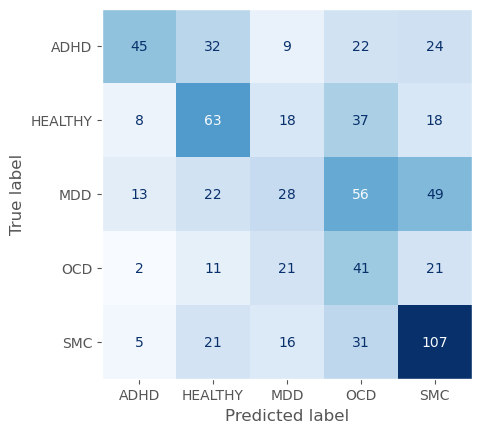

In [425]:
# final eval on val data for the best model during tuning
# get best model
best_model_path = trial.user_attrs["best_model_path"]
print(trial.params)
learning_rate = trial.params['learning_rate']
optimizer_name = trial.params['optimizer']
dropout = trial.params['dropout']
edge_threshold = trial.params['edge_threshold']
# Load the model directly from the checkpoint
model = GCN.load_from_checkpoint(best_model_path, learning_rate=learning_rate, optimizer_name=optimizer_name, dropout=dropout)

print(model.hparams)
X_val_best_trial = [data.clone() for data in X_val]
for data in X_val_best_trial:
    data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)

val_loader = DataLoader(X_val_best_trial, batch_size=len(X_val), shuffle=False,
                            drop_last=True)

trainer = Trainer(accelerator='gpu', devices=1, enable_progress_bar=False, enable_model_summary=False, logger=False, enable_checkpointing=False)
trainer.validate(model, val_loader)

# compute confusion matrix and classification report with sklearn of best model checkpoint
from sklearn.metrics import f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
y_pred = trainer.predict(model, val_loader)
y_pred = np.concatenate(y_pred).flatten()
y = Y_val

class_labels = le.inverse_transform(sorted(np.unique(y)))
print('classification report:\n', classification_report(y, y_pred, target_names=class_labels))
print('F1-score:', f1_score(y, y_pred, average="macro"))
cm = confusion_matrix(y, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False)
plt.grid(False)


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          val_f1           │    0.6149261593818665     │
│         val_loss          │    1.1505942344665527     │
└───────────────────────────┴───────────────────────────┘

classification report:
               precision    recall  f1-score   support

        ADHD       0.85      0.52      0.64       108
     HEALTHY       0.62      0.86      0.72       108
         MDD       0.80      0.45      0.58       108
         OCD       0.52      0.46      0.49       108
         SMC       0.53      0.81      0.64       108

    accuracy                           0.62       540
   macro avg       0.66      0.62      0.61       540
weighted avg       0.66      0.62      0.61       540

F1-score:
 0.6149261389509103


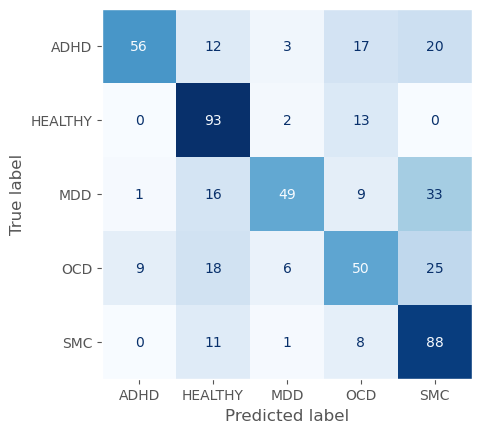

In [426]:
# final eval on test data for the best model during tuning
X_test_best_trial = [data.clone() for data in X_test]
for data in X_test_best_trial:
    data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
test_loader = DataLoader(X_test_best_trial, batch_size=len(X_test), shuffle=False,
                            drop_last=True)

trainer = Trainer(accelerator='gpu', devices=1, enable_progress_bar=False, enable_model_summary=False, logger=False, enable_checkpointing=False)
trainer.validate(model, test_loader)

# compute confusion matrix and classification report with sklearn of best model checkpoint
from sklearn.metrics import f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
y_pred = trainer.predict(model, test_loader)
y_pred = np.concatenate(y_pred).flatten()
y = Y_test

class_labels = le.inverse_transform(sorted(np.unique(y)))
print('classification report:\n', classification_report(y, y_pred, target_names=class_labels))
print('F1-score:\n', f1_score(y, y_pred, average="macro"))
cm = confusion_matrix(y, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False)
plt.grid(False)


In [449]:
df_trials = pd.read_pickle('ec_results_stand_GCN_trials.pkl')
df_trials.sort_values('value', ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_edge_threshold,params_learning_rate,params_optimizer,user_attrs_best_model_path,state
73,73,0.385796,2024-06-25 20:56:11.248602,2024-06-25 20:59:47.013118,0 days 00:03:35.764516,680,0.518904,0.543559,0.013466,Adam,/home/tsmolders/lightning_logs/version_73/chec...,COMPLETE
22,22,0.371915,2024-06-25 19:24:27.082733,2024-06-25 19:26:30.638385,0 days 00:02:03.555652,340,0.455960,0.650900,0.005231,RMSprop,/home/tsmolders/lightning_logs/version_22/chec...,COMPLETE
67,67,0.369888,2024-06-25 20:39:05.345536,2024-06-25 20:42:28.365966,0 days 00:03:23.020430,680,0.513750,0.518496,0.002841,Adam,/home/tsmolders/lightning_logs/version_67/chec...,COMPLETE
16,16,0.357840,2024-06-25 19:20:14.226264,2024-06-25 19:22:38.637886,0 days 00:02:24.411622,510,0.528320,0.574461,0.000587,Adam,/home/tsmolders/lightning_logs/version_16/chec...,COMPLETE
56,56,0.357744,2024-06-25 20:14:59.501072,2024-06-25 20:17:10.201731,0 days 00:02:10.700659,340,0.433231,0.564544,0.001665,Adam,/home/tsmolders/lightning_logs/version_56/chec...,COMPLETE
58,58,0.356040,2024-06-25 20:19:17.425822,2024-06-25 20:21:16.255105,0 days 00:01:58.829283,340,0.419957,0.547641,0.003998,Adam,/home/tsmolders/lightning_logs/version_58/chec...,COMPLETE
43,43,0.355045,2024-06-25 20:02:56.822046,2024-06-25 20:05:01.838617,0 days 00:02:05.016571,340,0.546787,0.627202,0.008115,RMSprop,/home/tsmolders/lightning_logs/version_43/chec...,COMPLETE
76,76,0.354658,2024-06-25 21:00:05.491617,2024-06-25 21:03:26.540815,0 days 00:03:21.049198,680,0.627915,0.528162,0.007396,Adam,/home/tsmolders/lightning_logs/version_76/chec...,COMPLETE
77,77,0.354082,2024-06-25 21:03:26.545075,2024-06-25 21:06:56.516917,0 days 00:03:29.971842,680,0.622780,0.526302,0.010718,Adam,/home/tsmolders/lightning_logs/version_77/chec...,COMPLETE
51,51,0.352635,2024-06-25 20:08:10.726618,2024-06-25 20:10:22.295272,0 days 00:02:11.568654,340,0.507752,0.628722,0.004678,RMSprop,/home/tsmolders/lightning_logs/version_51/chec...,COMPLETE


#### Visualizations

In [428]:
# function to change axes size
def set_size(w,h, ax=None):
    """ w, h: width, height in inches """
    if not ax: ax=plt.gca()
    l = ax.figure.subplotpars.left
    r = ax.figure.subplotpars.right
    t = ax.figure.subplotpars.top
    b = ax.figure.subplotpars.bottom
    figw = float(w)/(r-l)
    figh = float(h)/(t-b)
    ax.figure.set_size_inches(figw, figh)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1755039964.py:2: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

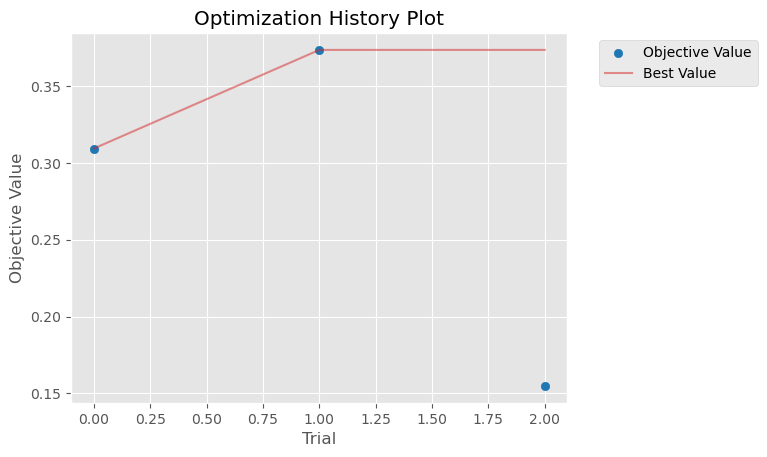

In [429]:
# Visualize the optimization history
plot_optimization_history(study)

[I 2024-06-25 19:18:42,103] A new study created in memory with name: no-name-67d4ff19-6fc9-4453-ae28-97b816fe4b1f


C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\3414932042.py:7: ExperimentalWarning: plot_intermediate_values is experimental (supported from v2.2.0). The interface can change in the future.
  plot_intermediate_values(plotted_study)


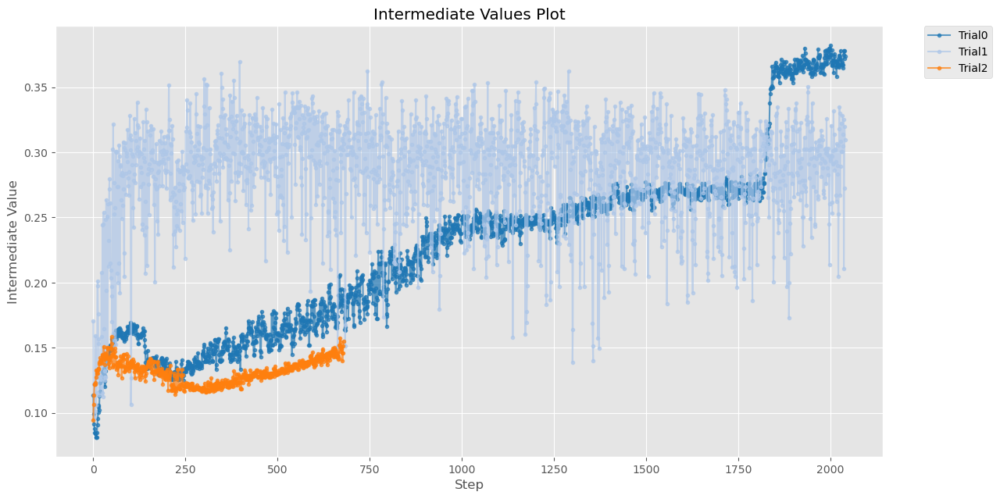

In [430]:
# Visualize the learning curves of the best 10 trials
trials = study.trials
plotted_trials = sorted(trials, key=lambda t: t.value, reverse=True)[:10]
plotted_study = optuna.create_study()
for trial in plotted_trials:
    plotted_study.add_trial(trial)
plot_intermediate_values(plotted_study)
set_size(10, 5)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\2919792376.py:2: ExperimentalWarning: plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  plot_parallel_coordinate(study)


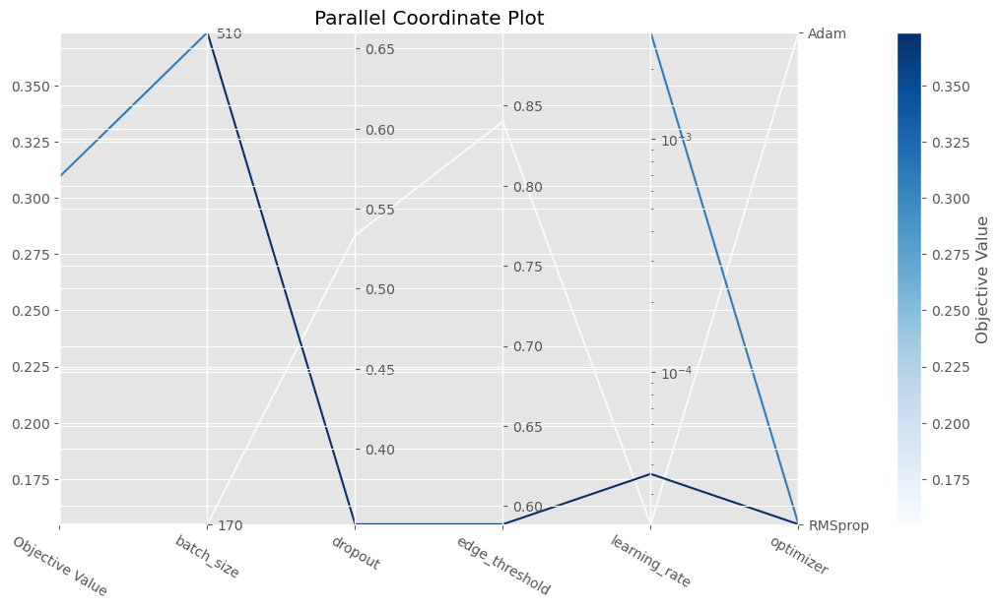

In [431]:
# Visualize high-dimensional parameter relationships.
plot_parallel_coordinate(study)
set_size(10, 5)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\624402143.py:2: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  plot_contour(study)
[W 2024-06-25 19:18:43,787] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.


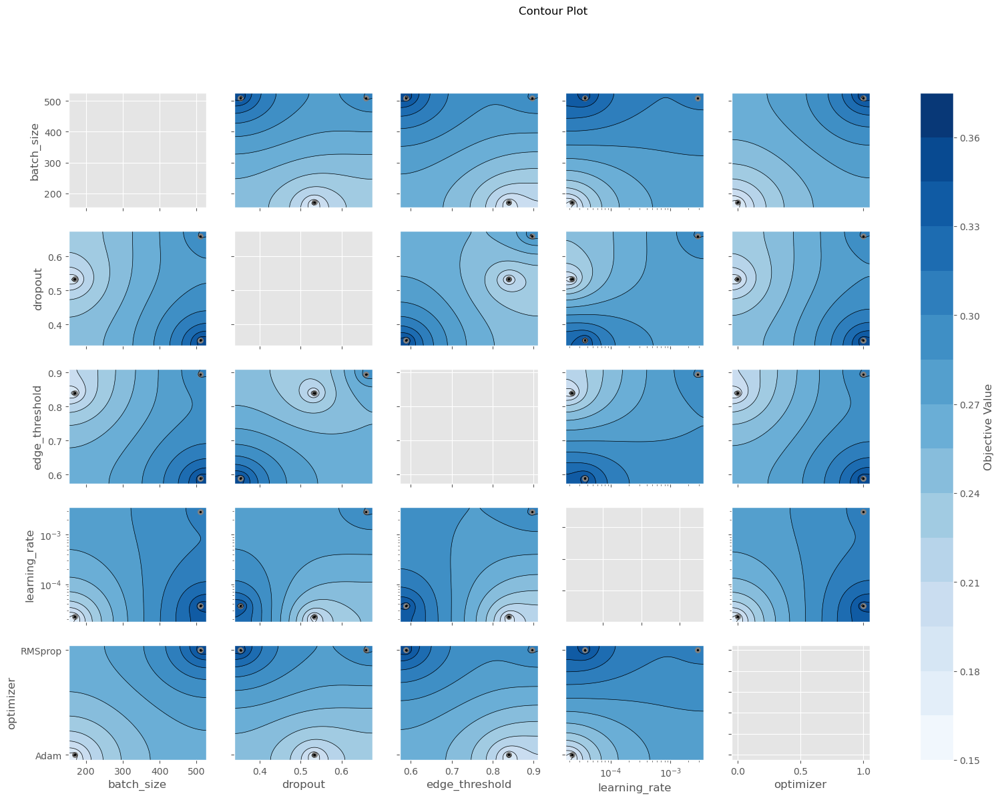

In [432]:
# Visualize hyperparameter relationships
plot_contour(study)
set_size(15, 10)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1888575690.py:2: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  plot_slice(study)


array([<Axes: xlabel='batch_size', ylabel='Objective Value'>,
       <Axes: xlabel='dropout'>, <Axes: xlabel='edge_threshold'>,
       <Axes: xlabel='learning_rate'>, <Axes: xlabel='optimizer'>],
      dtype=object)

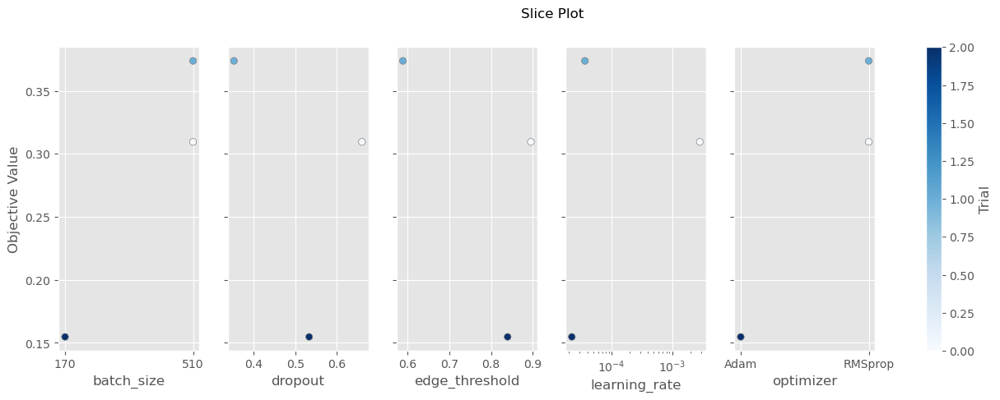

In [433]:
# Visualize individual hyperparameters as slice plot
plot_slice(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1473508994.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

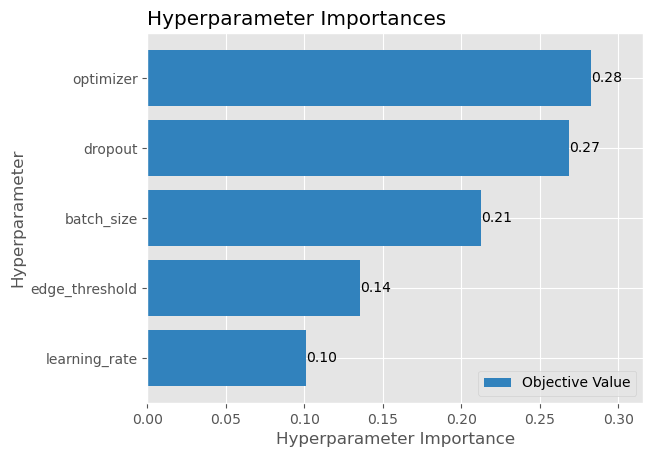

In [434]:
# Visualize parameter importances.
plot_param_importances(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\3113371256.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

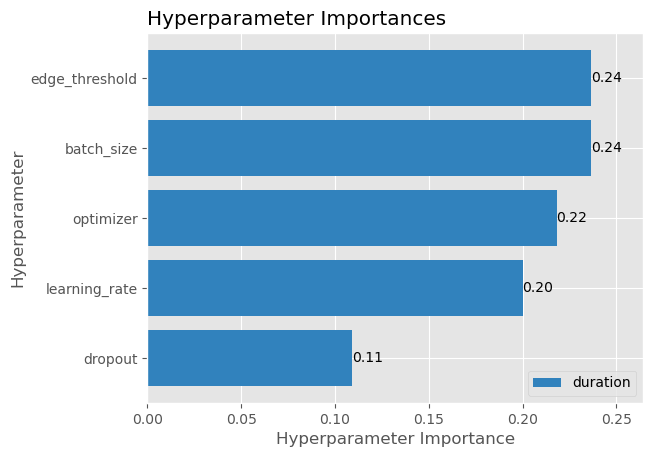

In [435]:
# Learn which hyperparameters are affecting the trial duration with hyperparameter importance.
plot_param_importances(
    study, target=lambda t: t.duration.total_seconds(), target_name="duration"
)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1828777839.py:2: ExperimentalWarning: plot_edf is experimental (supported from v2.2.0). The interface can change in the future.
  plot_edf(study)


<Axes: title={'center': 'Empirical Distribution Function Plot'}, xlabel='Objective Value', ylabel='Cumulative Probability'>

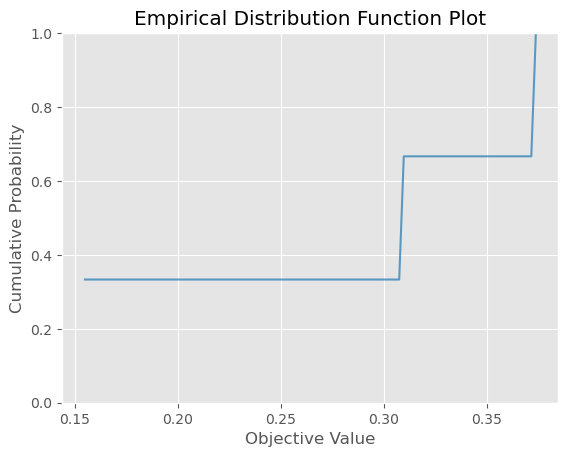

In [436]:
# Visualize empirical distribution function.
plot_edf(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1172520691.py:2: ExperimentalWarning: plot_rank is experimental (supported from v3.2.0). The interface can change in the future.
  plot_rank(study)
[W 2024-06-25 19:18:53,232] Output figures of this Matplotlib-based `plot_rank` function would be different from those of the Plotly-based `plot_rank`.


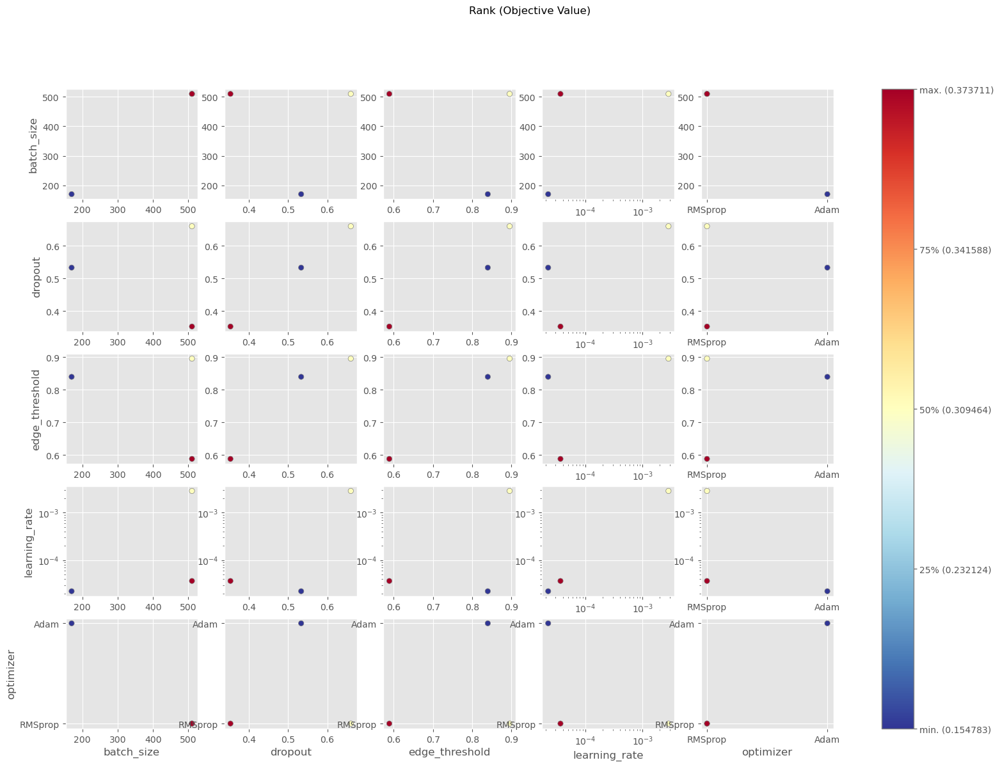

In [437]:
# Visualize parameter relations with scatter plots colored by objective values.
plot_rank(study)
set_size(15, 10)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\124343896.py:2: ExperimentalWarning: plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.
  plot_timeline(study)


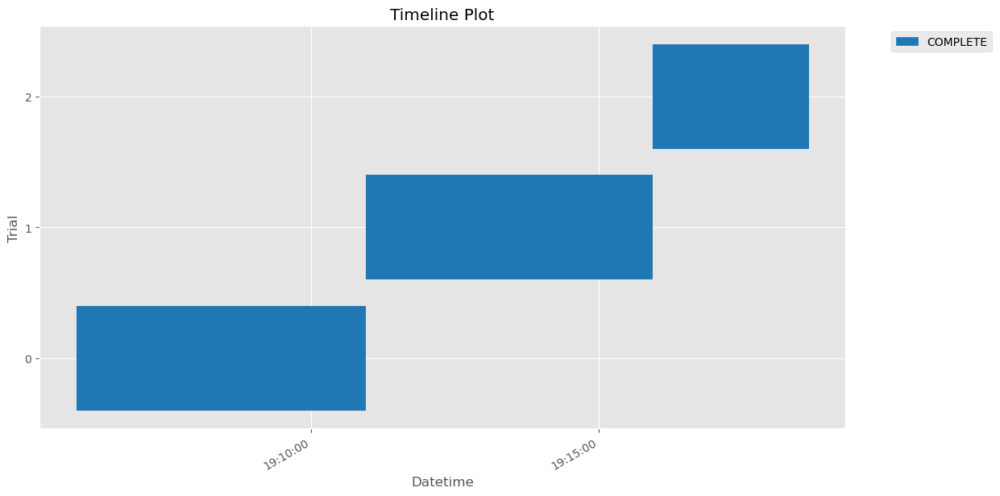

In [438]:
# Visualize the optimization timeline of performed trials.
plot_timeline(study)
set_size(10, 5)

### Model: graphLambda without edge_attr

In [439]:
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import RichProgressBar
import logging
import warnings

warnings.filterwarnings("ignore", ".*Consider increasing the value of the `num_workers` argument*")
warnings.filterwarnings("ignore", "Trying to infer the `batch_size` from an ambiguous collection.*")
torch.set_float32_matmul_precision('high')
logging.getLogger("lightning.pytorch.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

def objective(trial):
    # Suggest values for the hyperparameters
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    batch_size = trial.suggest_categorical('batch_size', [170, 340, 510, 680, 850])
    fc_layers = trial.suggest_int('fc_layers', 1, 8)
    dropout = trial.suggest_float('dropout', 0, 0.8)
    edge_threshold = trial.suggest_float('edge_threshold', 0.5, 0.9)
    hyperparameters = dict(learning_rate=learning_rate, optimizer_name=optimizer_name,
                           batch_size=batch_size, fc_layers=fc_layers, dropout=dropout,
                           edge_threshold=edge_threshold)
    print(f'Tested parameters: {hyperparameters}')
    n_epochs = batch_size * 4 # vary training epochs based on batch size

    # Create a copy of the dataset, for this specific trial
    X_train_trial = [data.clone() for data in X_train]
    X_val_trial = [data.clone() for data in X_val]
    X_test_trial = [data.clone() for data in X_test]
    
    # Only include edges with a synchrony value above the threshold in any of the five frequency bands
    for data in X_train_trial:
        data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
    for data in X_val_trial:
        data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
    for data in X_test_trial:
        data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)

    # Create the model
    model = graphLambda_wo_edge_attr(learning_rate=learning_rate, optimizer_name=optimizer_name, fc_layers=fc_layers, dropout=dropout)

    
    # Create checkpoint callback
    checkpoint_callback = ModelCheckpoint(monitor='val_f1',
                                        mode='max',
                                        save_top_k=3,
                                        filename='{epoch}-{train_loss:.2f}-{train_f1:.2f}-{val_loss:.2f}-{val_f1:.2f}',
                                        )

    # Create the PyTorch Lightning trainer
    trainer = Trainer(
        accelerator='gpu',
        devices=1,
        max_epochs=n_epochs,
        callbacks=[PyTorchLightningPruningCallback(trial, monitor="val_f1"), checkpoint_callback],
        enable_progress_bar=False,
        enable_model_summary=False,
        logger=True,
        enable_checkpointing=True,
    )

    # Define the data loaders
    train_loader = DataLoader(X_train_trial, batch_size=batch_size, shuffle=True,
                              drop_last=True) # , num_workers=0, persistent_workers=True
    val_loader = DataLoader(X_val_trial, batch_size=len(X_val), shuffle=False,
                            drop_last=True) # , num_workers=0, persistent_workers=True

    # Log the hyperparameters
    trainer.logger.log_hyperparams(hyperparameters)

    # Train the model
    trainer.fit(model, train_loader, val_loader)

    # Evaluate the model
    val_f1 = trainer.callback_metrics["val_f1"].item()

    # After training, store the best model path in the trial's user attributes
    trial.set_user_attr("best_model_path", checkpoint_callback.best_model_path)

    return val_f1

study = optuna.create_study(direction='maximize', pruner=optuna.pruners.ThresholdPruner(lower=0.1, n_warmup_steps=100))
study.optimize(objective, n_trials=5)

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

df = study.trials_dataframe()
df.to_pickle('ec_results_wo_edge_attrs_trials.pkl')

[I 2024-06-25 19:18:57,945] A new study created in memory with name: no-name-a41ca2f8-4b9e-4a9b-bc5c-1677c65a4f48


Tested parameters: {'learning_rate': 0.003695420016559784, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.4047403318798084, 'edge_threshold': 0.718050916581997}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:298: The number of training batches (8) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
[I 2024-06-25 19:19:54,449] Trial 0 pruned. Trial was pruned at epoch 138.


Tested parameters: {'learning_rate': 0.03777739578016646, 'optimizer_name': 'SGD', 'batch_size': 850, 'fc_layers': 2, 'dropout': 0.2860059255864947, 'edge_threshold': 0.7085690388018685}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:298: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
`Trainer.fit` stopped: `max_epochs=3400` reached.
[I 2024-06-25 19:30:00,415] Trial 1 finished with value: 0.27494633197784424 and parameters: {'learning_rate': 0.03777739578016646, 'optimizer': 'SGD', 'batch_size': 850, 'fc_layers': 2, 'dropout': 0.2860059255864947, 'edge_threshold': 0.7085690388018685}. Best is trial 1 with value: 0.27494633197784424.


Tested parameters: {'learning_rate': 0.0005701587988045848, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 7, 'dropout': 0.24263081743786483, 'edge_threshold': 0.6134901123933466}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:298: The number of training batches (2) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
`Trainer.fit` stopped: `max_epochs=2720` reached.
[I 2024-06-25 19:41:57,459] Trial 2 finished with value: 0.3112437427043915 and parameters: {'learning_rate': 0.0005701587988045848, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 7, 'dropout': 0.24263081743786483, 'edge_threshold': 0.6134901123933466}. Best is trial 2 with value: 0.3112437427043915.


Tested parameters: {'learning_rate': 0.0030725653400327773, 'optimizer_name': 'SGD', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.7798000186756724, 'edge_threshold': 0.8081346636550053}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[I 2024-06-25 19:42:18,806] Trial 3 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 1.435130550602906e-05, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.421014526857046, 'edge_threshold': 0.8900306638569313}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[I 2024-06-25 19:44:47,921] Trial 4 pruned. Trial was pruned at epoch 406.


Best trial:
  Value: 0.3112437427043915
  Params: 
    learning_rate: 0.0005701587988045848
    optimizer: RMSprop
    batch_size: 680
    fc_layers: 7
    dropout: 0.24263081743786483
    edge_threshold: 0.6134901123933466


In [372]:
# print the best model path for later tensorboard visualization
print(f'Best model path: {trial.user_attrs["best_model_path"]}')

Best model path: d:\Documents\RU\Master_Neurobiology\Internship_jaar_2\Project\Notebooks\lightning_logs\version_47\checkpoints\epoch=9-train_loss=1.61-train_f1=0.14-val_loss=1.61-val_f1=0.08.ckpt


{'learning_rate': 0.00013675454897709135, 'optimizer': 'SGD', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.2485869840960807, 'edge_threshold': 0.8219681885333963}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          val_f1           │    0.08008898794651031    │
│         val_loss          │    1.6074665784835815     │
└───────────────────────────┴───────────────────────────┘

classification report:
               precision    recall  f1-score   support

        ADHD       0.00      0.00      0.00       132
     HEALTHY       0.00      0.00      0.00       144
         MDD       0.00      0.00      0.00       168
         OCD       0.00      0.00      0.00        96
         SMC       0.25      1.00      0.40       180

    accuracy                           0.25       720
   macro avg       0.05      0.20      0.08       720
weighted avg       0.06      0.25      0.10       720

F1-score: 0.08008898776418243


c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


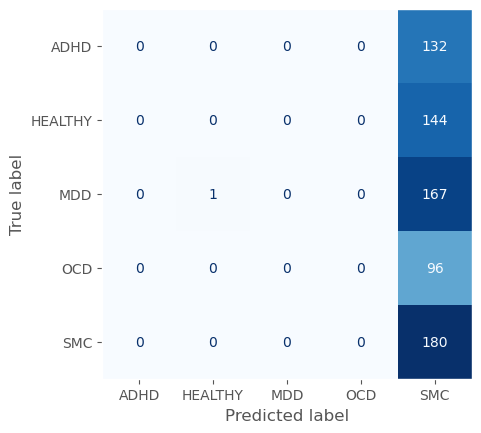

In [373]:
# final eval on val data for the best model during tuning
# get best model
best_model_path = trial.user_attrs["best_model_path"]
print(trial.params)
learning_rate = trial.params['learning_rate']
optimizer_name = trial.params['optimizer']
dropout = trial.params['dropout']
fc_layers = trial.params['fc_layers']
edge_threshold = trial.params['edge_threshold']
# Load the model directly from the checkpoint
model = graphLambda_wo_edge_attr.load_from_checkpoint(best_model_path, learning_rate=learning_rate, optimizer_name=optimizer_name, dropout=dropout, fc_layers=fc_layers)
X_val_best_trial = [data.clone() for data in X_val]
for data in X_val_best_trial:
    data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
print(model.hparams)

val_loader = DataLoader(X_val_best_trial, batch_size=len(X_val), shuffle=False,
                            drop_last=True)

trainer = Trainer(accelerator='gpu', devices=1, enable_progress_bar=False, enable_model_summary=False, logger=False, enable_checkpointing=False)
trainer.validate(model, val_loader)

# compute confusion matrix and classification report with sklearn of best model checkpoint
from sklearn.metrics import f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
y_pred = trainer.predict(model, val_loader)
y_pred = np.concatenate(y_pred).flatten()
y = Y_val

class_labels = le.inverse_transform(sorted(np.unique(y)))
print('classification report:\n', classification_report(y, y_pred, target_names=class_labels))
print('F1-score:', f1_score(y, y_pred, average="macro"))
cm = confusion_matrix(y, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False)
plt.grid(False)


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          val_f1           │    0.06676970422267914    │
│         val_loss          │    1.6116414070129395     │
└───────────────────────────┴───────────────────────────┘

c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


classification report:
               precision    recall  f1-score   support

        ADHD       0.00      0.00      0.00       108
     HEALTHY       0.00      0.00      0.00       108
         MDD       0.00      0.00      0.00       108
         OCD       0.00      0.00      0.00       108
         SMC       0.20      1.00      0.33       108

    accuracy                           0.20       540
   macro avg       0.04      0.20      0.07       540
weighted avg       0.04      0.20      0.07       540

F1-score:
 0.06676970633693972


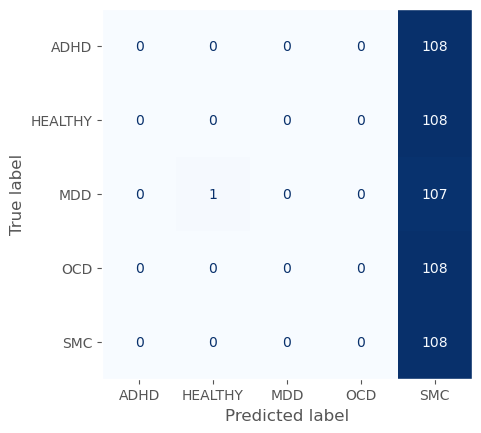

In [374]:
# final eval on test data for the best model during tuning
X_test_best_trial = [data.clone() for data in X_test]
for data in X_test_best_trial:
    data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
test_loader = DataLoader(X_test_best_trial, batch_size=len(X_test), shuffle=False,
                            drop_last=True)

trainer = Trainer(accelerator='gpu', devices=1, enable_progress_bar=False, enable_model_summary=False, logger=False, enable_checkpointing=False)
trainer.validate(model, test_loader)

# compute confusion matrix and classification report with sklearn of best model checkpoint
from sklearn.metrics import f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
y_pred = trainer.predict(model, test_loader)
y_pred = np.concatenate(y_pred).flatten()
y = Y_test

class_labels = le.inverse_transform(sorted(np.unique(y)))
print('classification report:\n', classification_report(y, y_pred, target_names=class_labels))
print('F1-score:\n', f1_score(y, y_pred, average="macro"))
cm = confusion_matrix(y, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False)
plt.grid(False)


In [440]:
df_trials = pd.read_pickle('ec_results_wo_edge_attrs_trials.pkl')
df_trials.sort_values('value', ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_edge_threshold,params_fc_layers,params_learning_rate,params_optimizer,user_attrs_best_model_path,state
2,2,0.311244,2024-06-25 19:30:00.416742,2024-06-25 19:41:57.452532,0 days 00:11:57.035790,680,0.242631,0.613490,7,0.000570,RMSprop,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE
1,1,0.274946,2024-06-25 19:19:54.450032,2024-06-25 19:30:00.406624,0 days 00:10:05.956592,850,0.286006,0.708569,2,0.037777,SGD,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE
0,0,0.099612,2024-06-25 19:18:57.946972,2024-06-25 19:19:54.449030,0 days 00:00:56.502058,170,0.404740,0.718051,6,0.003695,SGD,NaN,PRUNED
4,4,0.098913,2024-06-25 19:42:18.807254,2024-06-25 19:44:47.921765,0 days 00:02:29.114511,170,0.421015,0.890031,4,0.000014,SGD,NaN,PRUNED
3,3,0.061972,2024-06-25 19:41:57.460540,2024-06-25 19:42:18.805251,0 days 00:00:21.344711,510,0.779800,0.808135,7,0.003073,SGD,NaN,PRUNED


#### Visualizations

In [441]:
# function to change axes size
def set_size(w,h, ax=None):
    """ w, h: width, height in inches """
    if not ax: ax=plt.gca()
    l = ax.figure.subplotpars.left
    r = ax.figure.subplotpars.right
    t = ax.figure.subplotpars.top
    b = ax.figure.subplotpars.bottom
    figw = float(w)/(r-l)
    figh = float(h)/(t-b)
    ax.figure.set_size_inches(figw, figh)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1755039964.py:2: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

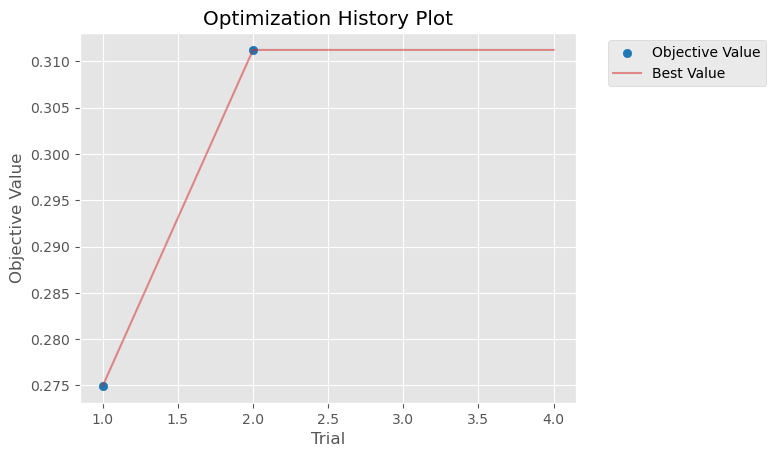

In [442]:
# Visualize the optimization history
plot_optimization_history(study)

[I 2024-06-25 18:34:16,884] A new study created in memory with name: no-name-8a56a22d-4103-479a-b9f4-6d357e6a55bc
C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\3414932042.py:7: ExperimentalWarning: plot_intermediate_values is experimental (supported from v2.2.0). The interface can change in the future.
  plot_intermediate_values(plotted_study)


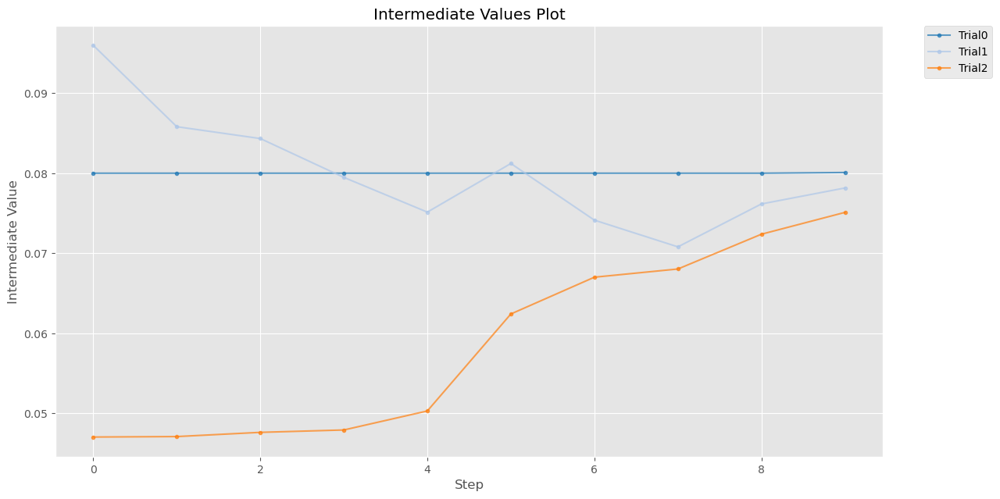

In [378]:
# Visualize the learning curves of the best 10 trials
trials = study.trials
plotted_trials = sorted(trials, key=lambda t: t.value, reverse=True)[:10]
plotted_study = optuna.create_study()
for trial in plotted_trials:
    plotted_study.add_trial(trial)
plot_intermediate_values(plotted_study)
set_size(10, 5)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\2919792376.py:2: ExperimentalWarning: plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  plot_parallel_coordinate(study)


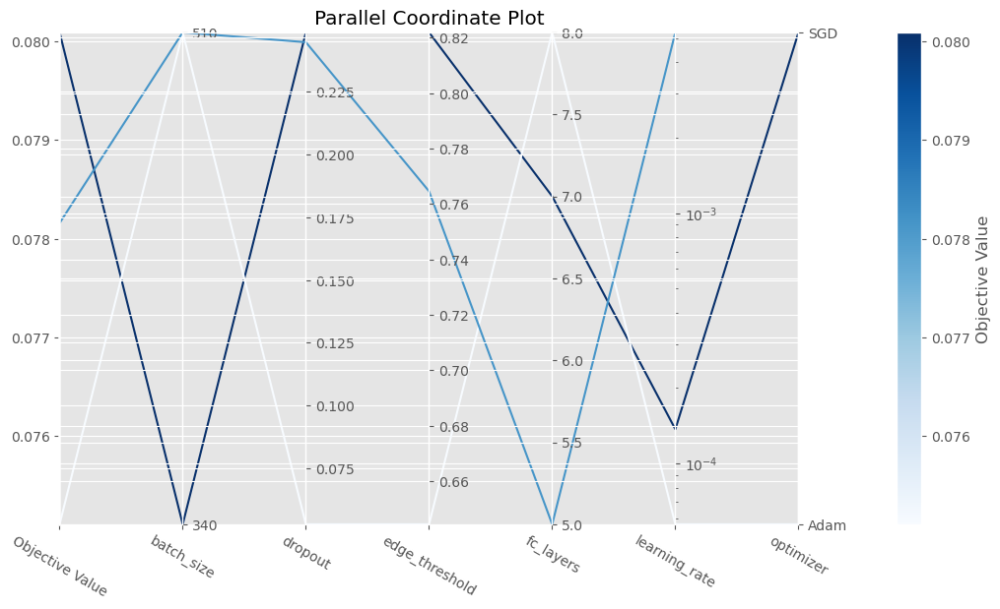

In [379]:
# Visualize high-dimensional parameter relationships.
plot_parallel_coordinate(study)
set_size(10, 5)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\624402143.py:2: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  plot_contour(study)
[W 2024-06-25 21:02:51,940] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.


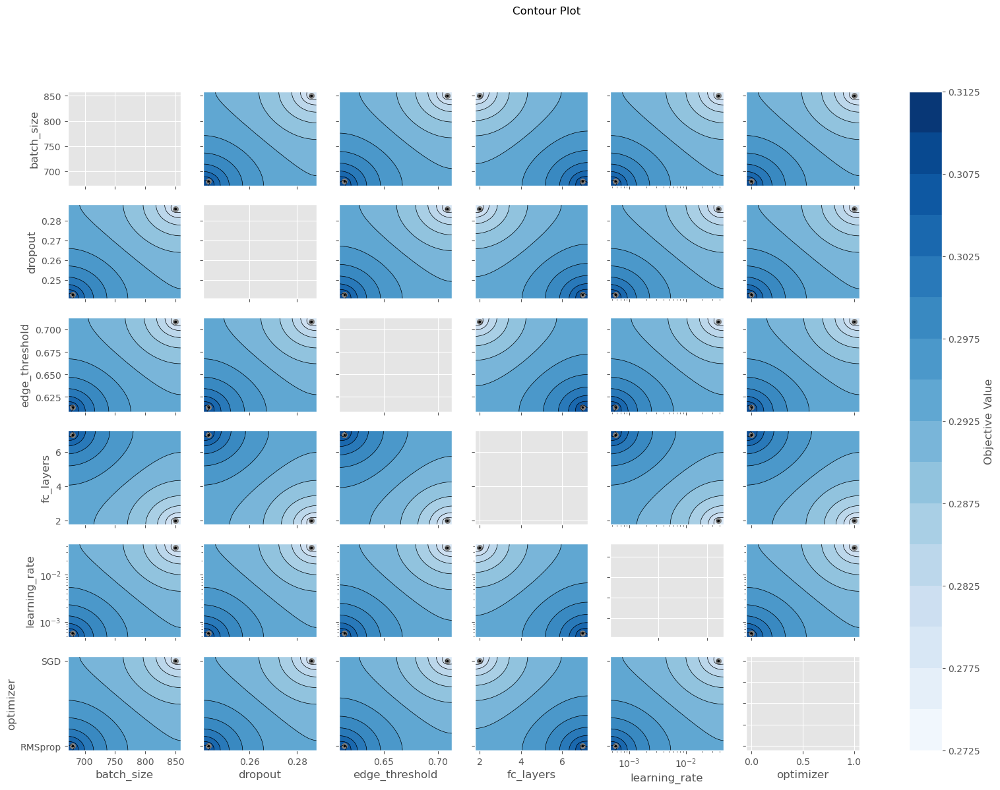

In [443]:
# Visualize hyperparameter relationships
plot_contour(study)
set_size(15, 10)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1888575690.py:2: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  plot_slice(study)


array([<Axes: xlabel='batch_size', ylabel='Objective Value'>,
       <Axes: xlabel='dropout'>, <Axes: xlabel='edge_threshold'>,
       <Axes: xlabel='fc_layers'>, <Axes: xlabel='learning_rate'>,
       <Axes: xlabel='optimizer'>], dtype=object)

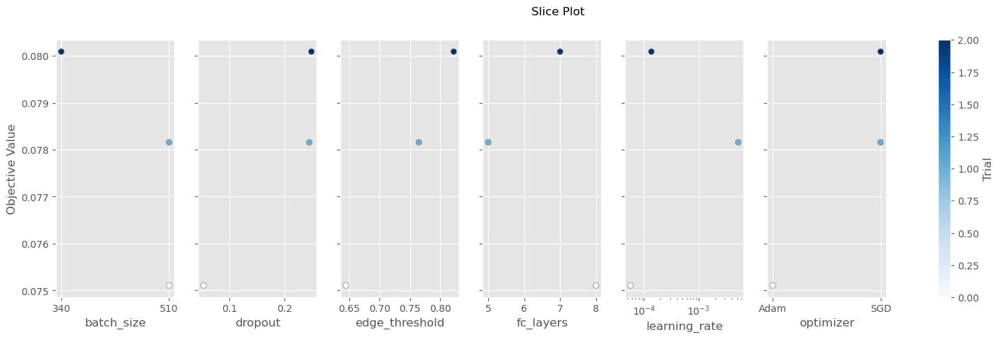

In [381]:
# Visualize individual hyperparameters as slice plot
plot_slice(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1473508994.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

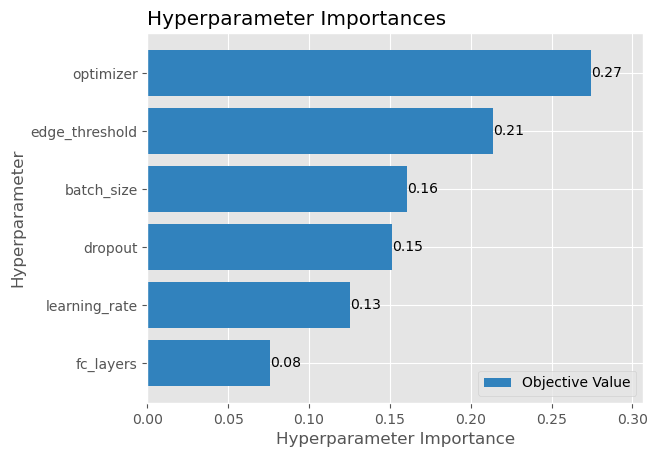

In [382]:
# Visualize parameter importances.
plot_param_importances(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\3113371256.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

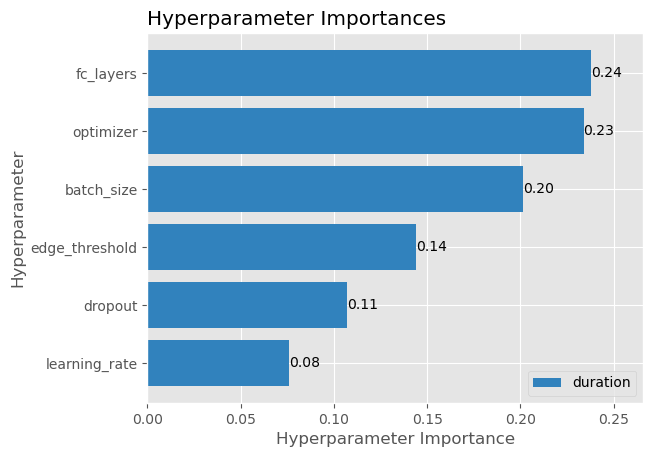

In [383]:
# Learn which hyperparameters are affecting the trial duration with hyperparameter importance.
plot_param_importances(
    study, target=lambda t: t.duration.total_seconds(), target_name="duration"
)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1828777839.py:2: ExperimentalWarning: plot_edf is experimental (supported from v2.2.0). The interface can change in the future.
  plot_edf(study)


<Axes: title={'center': 'Empirical Distribution Function Plot'}, xlabel='Objective Value', ylabel='Cumulative Probability'>

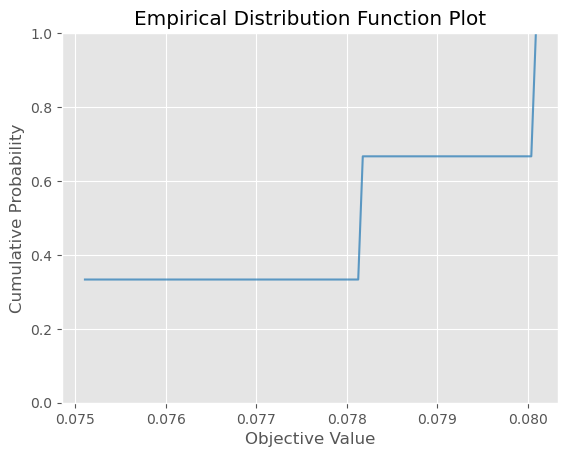

In [384]:
# Visualize empirical distribution function.
plot_edf(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1172520691.py:2: ExperimentalWarning: plot_rank is experimental (supported from v3.2.0). The interface can change in the future.
  plot_rank(study)
[W 2024-06-25 18:34:34,800] Output figures of this Matplotlib-based `plot_rank` function would be different from those of the Plotly-based `plot_rank`.


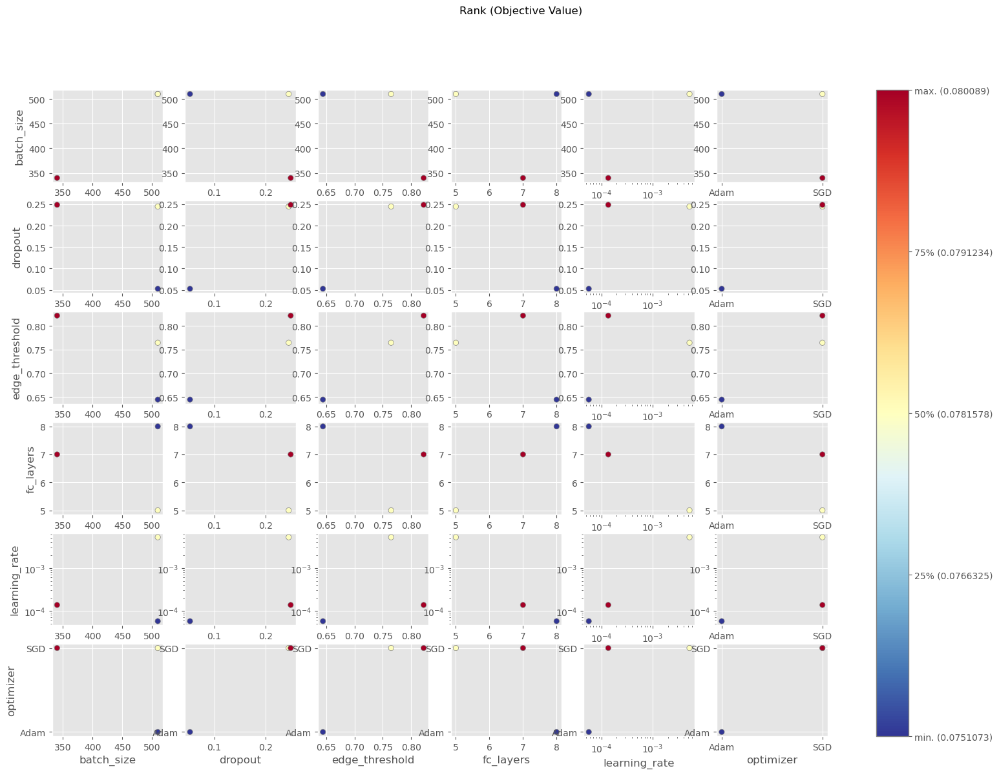

In [385]:
# Visualize parameter relations with scatter plots colored by objective values.
plot_rank(study)
set_size(15, 10)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\124343896.py:2: ExperimentalWarning: plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.
  plot_timeline(study)


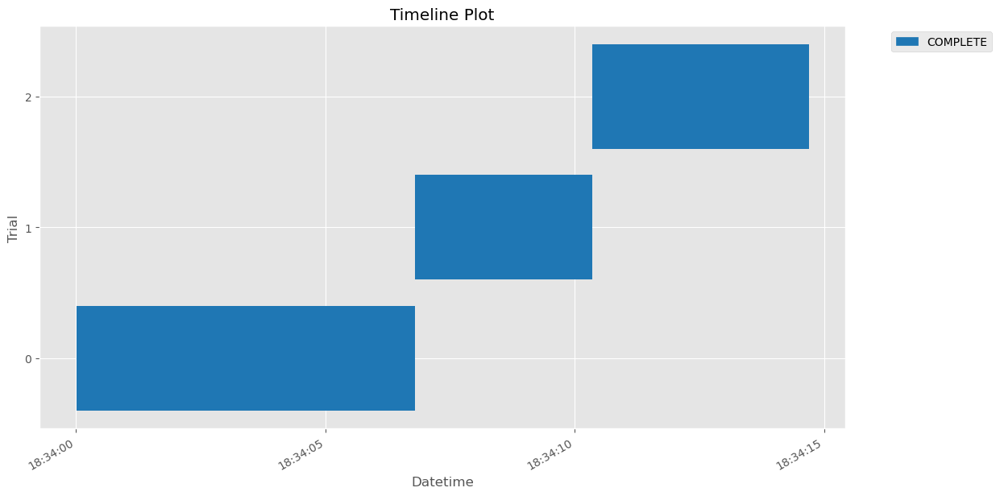

In [386]:
# Visualize the optimization timeline of performed trials.
plot_timeline(study)
set_size(10, 5)

### Model: graphLambda with edge_attr

In [444]:
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import RichProgressBar
import logging
import warnings

warnings.filterwarnings("ignore", ".*Consider increasing the value of the `num_workers` argument*")
warnings.filterwarnings("ignore", "Trying to infer the `batch_size` from an ambiguous collection.*")
torch.set_float32_matmul_precision('high')
logging.getLogger("lightning.pytorch.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

def objective(trial):
    # Suggest values for the hyperparameters
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    batch_size = trial.suggest_categorical('batch_size', [170, 340, 510, 680, 850])
    fc_layers = trial.suggest_int('fc_layers', 1, 8)
    dropout = trial.suggest_float('dropout', 0, 0.8)
    hyperparameters = dict(learning_rate=learning_rate, optimizer_name=optimizer_name, batch_size=batch_size, fc_layers=fc_layers, dropout=dropout)
    print(f'Tested parameters: {hyperparameters}')
    n_epochs = batch_size * 4 # vary training epochs based on batch size


    # Create the model
    model = graphLambda_w_edge_attr(learning_rate=learning_rate, optimizer_name=optimizer_name, fc_layers=fc_layers, dropout=dropout)

    
    # Create checkpoint callback
    checkpoint_callback = ModelCheckpoint(monitor='val_f1',
                                        mode='max',
                                        save_top_k=3,
                                        filename='{epoch}-{train_loss:.2f}-{train_f1:.2f}-{val_loss:.2f}-{val_f1:.2f}',
                                        )

    # Create the PyTorch Lightning trainer
    trainer = Trainer(
        accelerator='gpu',
        devices=1,
        max_epochs=n_epochs,
        callbacks=[PyTorchLightningPruningCallback(trial, monitor="val_f1"), checkpoint_callback],
        enable_progress_bar=False,
        enable_model_summary=False,
        logger=True,
        enable_checkpointing=True,
    )

    # Define the data loaders
    train_loader = DataLoader(X_train, batch_size=batch_size, shuffle=True,
                              drop_last=True) # , num_workers=0, persistent_workers=True
    val_loader = DataLoader(X_val, batch_size=len(X_val), shuffle=False,
                            drop_last=True) # , num_workers=0, persistent_workers=True

    # Log the hyperparameters
    trainer.logger.log_hyperparams(hyperparameters)

    # Train the model
    trainer.fit(model, train_loader, val_loader)

    # Evaluate the model
    val_f1 = trainer.callback_metrics["val_f1"].item()

    # After training, store the best model path in the trial's user attributes
    trial.set_user_attr("best_model_path", checkpoint_callback.best_model_path)

    return val_f1

study = optuna.create_study(direction='maximize', pruner=optuna.pruners.ThresholdPruner(lower=0.1, n_warmup_steps=100))
study.optimize(objective, n_trials=5)

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

df = study.trials_dataframe()
df.to_pickle('ec_results_w_edge_attrs_trials.pkl')

[I 2024-06-25 21:03:46,238] A new study created in memory with name: no-name-2a3e4cde-79d8-490a-866f-8bc006307ac4
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Tested parameters: {'learning_rate': 0.045628710978568666, 'optimizer_name': 'SGD', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.28945399520519804}


c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:298: The number of training batches (2) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
`Trainer.fit` stopped: `max_epochs=2040` reached.
[I 2024-06-25 21:13:38,960] Trial 0 finished with value: 0.29042384028434753 and parameters: {'learning_rate': 0.045628710978568666, 'optimizer': 'SGD', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.28945399520519804}. Best is trial 0 with value: 0.29042384028434753.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Tested parameters: {'learning_rate': 0.0008816537405466104, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.41659191896977044}


c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:298: The number of training batches (8) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
[I 2024-06-25 21:14:24,754] Trial 1 pruned. Trial was pruned at epoch 100.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Tested parameters: {'learning_rate': 5.798901652145287e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 5, 'dropout': 0.24457341319036133}


`Trainer.fit` stopped: `max_epochs=2040` reached.
[I 2024-06-25 21:23:53,176] Trial 2 finished with value: 0.3658982515335083 and parameters: {'learning_rate': 5.798901652145287e-05, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 5, 'dropout': 0.24457341319036133}. Best is trial 2 with value: 0.3658982515335083.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Tested parameters: {'learning_rate': 0.0010746650588952882, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.7185350028252184}


[I 2024-06-25 21:24:39,063] Trial 3 pruned. Trial was pruned at epoch 100.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Tested parameters: {'learning_rate': 0.00034239227084294097, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 1, 'dropout': 0.1415387294473467}


`Trainer.fit` stopped: `max_epochs=680` reached.
[I 2024-06-25 21:29:33,741] Trial 4 finished with value: 0.35822242498397827 and parameters: {'learning_rate': 0.00034239227084294097, 'optimizer': 'SGD', 'batch_size': 170, 'fc_layers': 1, 'dropout': 0.1415387294473467}. Best is trial 2 with value: 0.3658982515335083.


Best trial:
  Value: 0.3658982515335083
  Params: 
    learning_rate: 5.798901652145287e-05
    optimizer: RMSprop
    batch_size: 510
    fc_layers: 5
    dropout: 0.24457341319036133


In [445]:
# print the best model path for later tensorboard visualization
print(f'Best model path: {trial.user_attrs["best_model_path"]}')

Best model path: d:\Documents\RU\Master_Neurobiology\Internship_jaar_2\Project\Notebooks\lightning_logs\version_64\checkpoints\epoch=1141-train_loss=0.41-train_f1=0.82-val_loss=5.89-val_f1=0.39.ckpt


{'learning_rate': 5.798901652145287e-05, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 5, 'dropout': 0.24457341319036133}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          val_f1           │    0.3919340670108795     │
│         val_loss          │     5.892683029174805     │
└───────────────────────────┴───────────────────────────┘

classification report:
               precision    recall  f1-score   support

        ADHD       0.55      0.34      0.42       132
     HEALTHY       0.40      0.56      0.47       144
         MDD       0.45      0.38      0.41       168
         OCD       0.16      0.18      0.17        96
         SMC       0.49      0.51      0.50       180

    accuracy                           0.41       720
   macro avg       0.41      0.39      0.39       720
weighted avg       0.43      0.41      0.41       720

F1-score: 0.3919340646206121


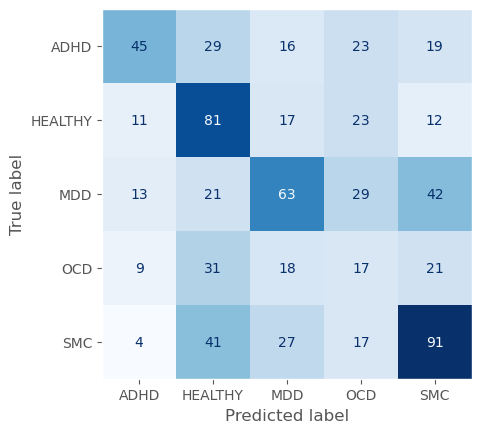

In [446]:
# final eval on val data for the best model during tuning
# get best model
best_model_path = trial.user_attrs["best_model_path"]
print(trial.params)
learning_rate = trial.params['learning_rate']
optimizer_name = trial.params['optimizer']
dropout = trial.params['dropout']
fc_layers = trial.params['fc_layers']
# Load the model directly from the checkpoint
model = graphLambda_w_edge_attr.load_from_checkpoint(best_model_path, learning_rate=learning_rate, optimizer_name=optimizer_name, dropout=dropout, fc_layers=fc_layers)

print(model.hparams)

val_loader = DataLoader(X_val, batch_size=len(X_val), shuffle=False,
                            drop_last=True)

trainer = Trainer(accelerator='gpu', devices=1, enable_progress_bar=False, enable_model_summary=False, logger=False, enable_checkpointing=False)
trainer.validate(model, val_loader)

# compute confusion matrix and classification report with sklearn of best model checkpoint
from sklearn.metrics import f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
y_pred = trainer.predict(model, val_loader)
y_pred = np.concatenate(y_pred).flatten()
y = Y_val

class_labels = le.inverse_transform(sorted(np.unique(y)))
print('classification report:\n', classification_report(y, y_pred, target_names=class_labels))
print('F1-score:', f1_score(y, y_pred, average="macro"))
cm = confusion_matrix(y, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False)
plt.grid(False)


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          val_f1           │    0.6489982604980469     │
│         val_loss          │     4.592993259429932     │
└───────────────────────────┴───────────────────────────┘

classification report:
               precision    recall  f1-score   support

        ADHD       0.80      0.69      0.74       108
     HEALTHY       0.63      0.89      0.74       108
         MDD       0.76      0.51      0.61       108
         OCD       0.58      0.38      0.46       108
         SMC       0.59      0.84      0.70       108

    accuracy                           0.66       540
   macro avg       0.67      0.66      0.65       540
weighted avg       0.67      0.66      0.65       540

F1-score:
 0.6489982431789405


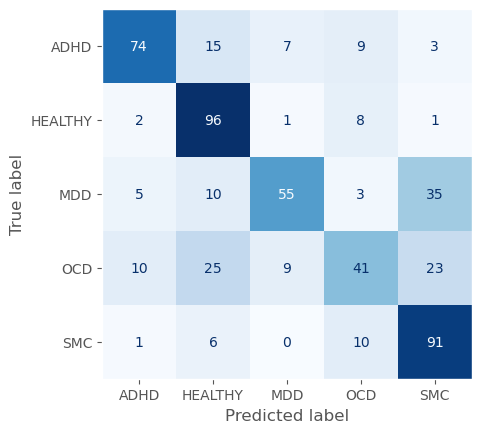

In [447]:
# final eval on test data for the best model during tuning

test_loader = DataLoader(X_test, batch_size=len(X_test), shuffle=False,
                            drop_last=True)

trainer = Trainer(accelerator='gpu', devices=1, enable_progress_bar=False, enable_model_summary=False, logger=False, enable_checkpointing=False)
trainer.validate(model, test_loader)

# compute confusion matrix and classification report with sklearn of best model checkpoint
from sklearn.metrics import f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
y_pred = trainer.predict(model, test_loader)
y_pred = np.concatenate(y_pred).flatten()
y = Y_test

class_labels = le.inverse_transform(sorted(np.unique(y)))
print('classification report:\n', classification_report(y, y_pred, target_names=class_labels))
print('F1-score:\n', f1_score(y, y_pred, average="macro"))
cm = confusion_matrix(y, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False)
plt.grid(False)


In [448]:
df_trials = pd.read_pickle('ec_results_w_edge_attrs_trials.pkl')
df_trials.sort_values('value', ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_fc_layers,params_learning_rate,params_optimizer,user_attrs_best_model_path,state
2,2,0.365898,2024-06-25 21:14:24.755707,2024-06-25 21:23:53.171787,0 days 00:09:28.416080,510,0.244573,5,0.000058,RMSprop,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE
4,4,0.358222,2024-06-25 21:24:39.063185,2024-06-25 21:29:33.738212,0 days 00:04:54.675027,170,0.141539,1,0.000342,SGD,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE
0,0,0.290424,2024-06-25 21:03:46.240430,2024-06-25 21:13:38.954869,0 days 00:09:52.714439,510,0.289454,6,0.045629,SGD,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE
1,1,0.092464,2024-06-25 21:13:38.961877,2024-06-25 21:14:24.754706,0 days 00:00:45.792829,170,0.416592,5,0.000882,SGD,NaN,PRUNED
3,3,0.061972,2024-06-25 21:23:53.177925,2024-06-25 21:24:39.062174,0 days 00:00:45.884249,170,0.718535,5,0.001075,SGD,NaN,PRUNED


#### Visualizations

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1755039964.py:2: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

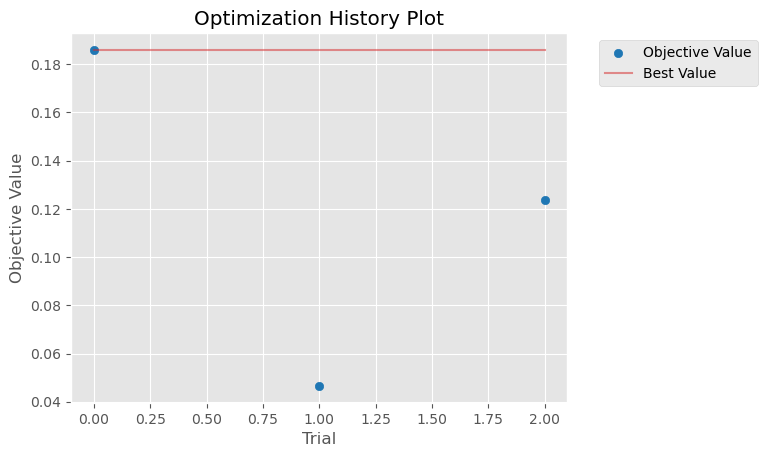

In [392]:
# Visualize the optimization history
plot_optimization_history(study)

[I 2024-06-25 18:34:58,382] A new study created in memory with name: no-name-923d8467-4762-4ae5-8f16-7dc21219eb45
C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\3414932042.py:7: ExperimentalWarning: plot_intermediate_values is experimental (supported from v2.2.0). The interface can change in the future.
  plot_intermediate_values(plotted_study)


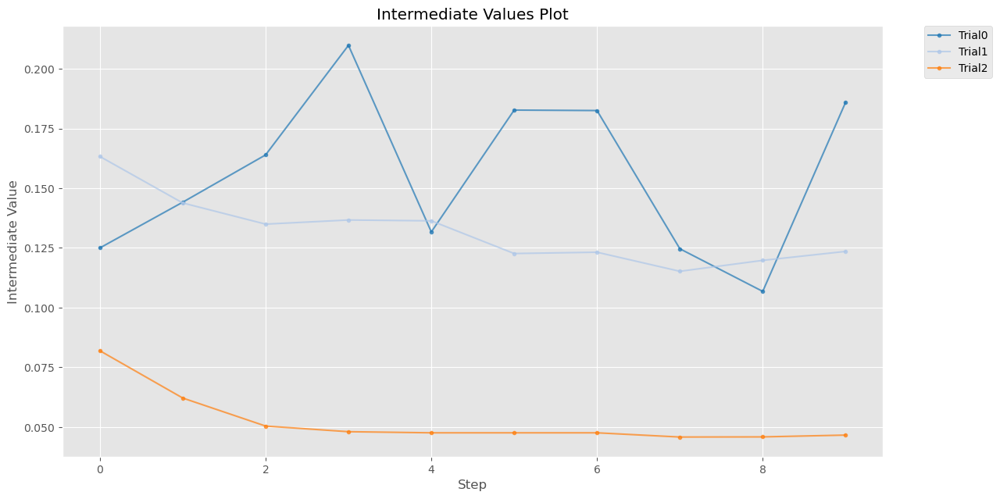

In [393]:
# Visualize the learning curves of the best 10 trials
trials = study.trials
plotted_trials = sorted(trials, key=lambda t: t.value, reverse=True)[:10]
plotted_study = optuna.create_study()
for trial in plotted_trials:
    plotted_study.add_trial(trial)
plot_intermediate_values(plotted_study)
set_size(10, 5)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\2919792376.py:2: ExperimentalWarning: plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  plot_parallel_coordinate(study)


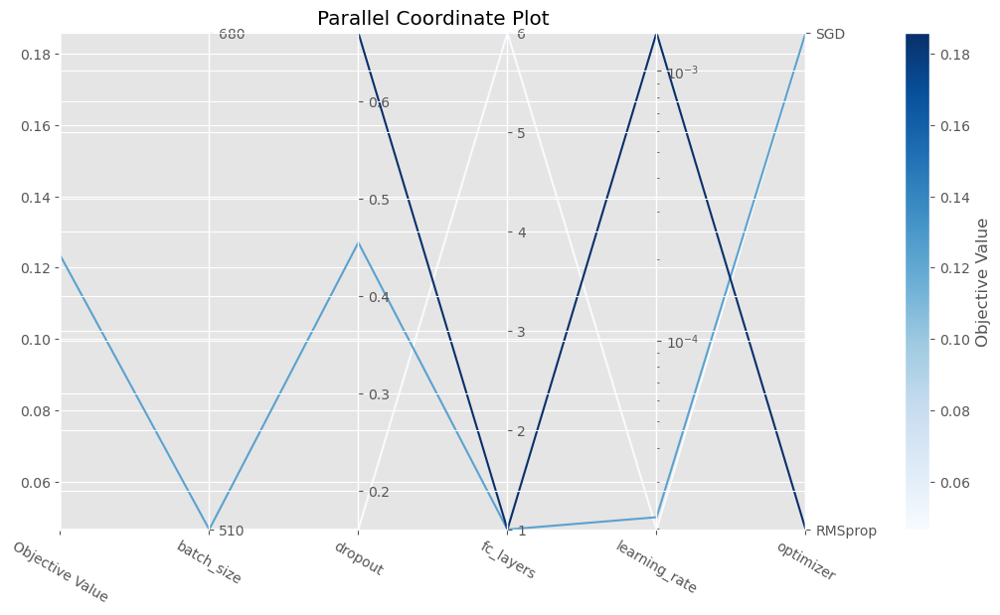

In [394]:
# Visualize high-dimensional parameter relationships.
plot_parallel_coordinate(study)
set_size(10, 5)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\624402143.py:2: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  plot_contour(study)
[W 2024-06-25 18:34:59,941] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.


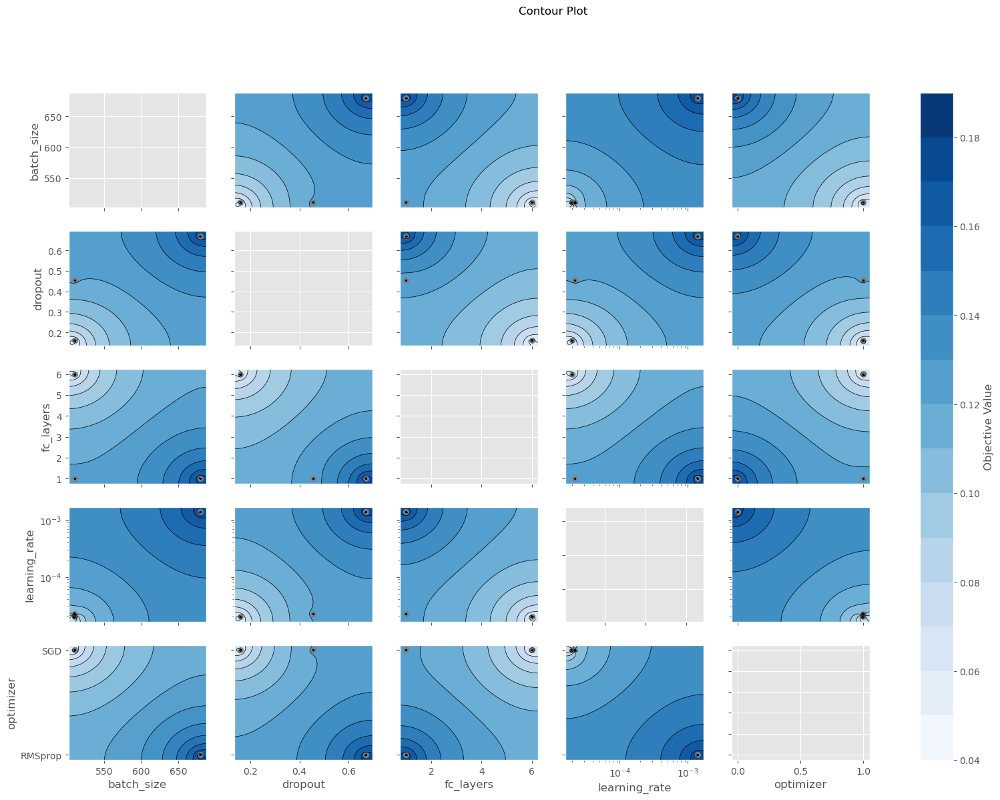

In [395]:
# Visualize hyperparameter relationships
plot_contour(study)
set_size(15, 10)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1888575690.py:2: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  plot_slice(study)


array([<Axes: xlabel='batch_size', ylabel='Objective Value'>,
       <Axes: xlabel='dropout'>, <Axes: xlabel='fc_layers'>,
       <Axes: xlabel='learning_rate'>, <Axes: xlabel='optimizer'>],
      dtype=object)

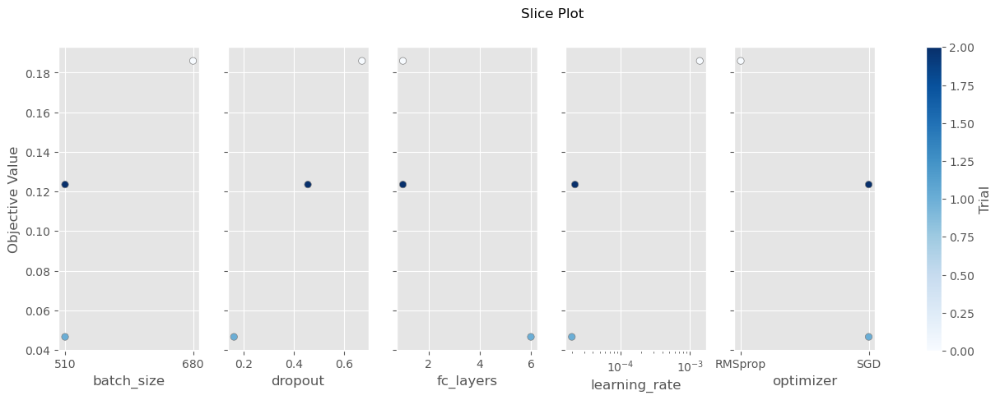

In [396]:
# Visualize individual hyperparameters as slice plot
plot_slice(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1473508994.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

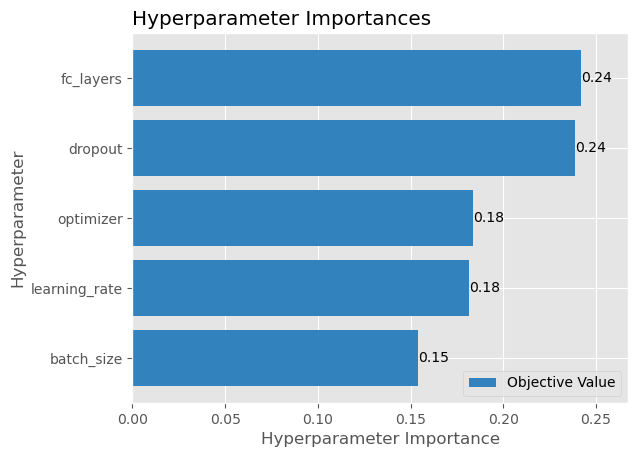

In [397]:
# Visualize parameter importances.
plot_param_importances(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\3113371256.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

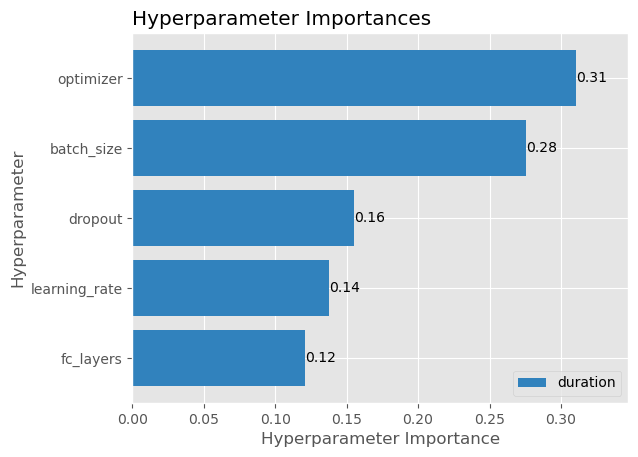

In [398]:
# Learn which hyperparameters are affecting the trial duration with hyperparameter importance.
plot_param_importances(
    study, target=lambda t: t.duration.total_seconds(), target_name="duration"
)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1828777839.py:2: ExperimentalWarning: plot_edf is experimental (supported from v2.2.0). The interface can change in the future.
  plot_edf(study)


<Axes: title={'center': 'Empirical Distribution Function Plot'}, xlabel='Objective Value', ylabel='Cumulative Probability'>

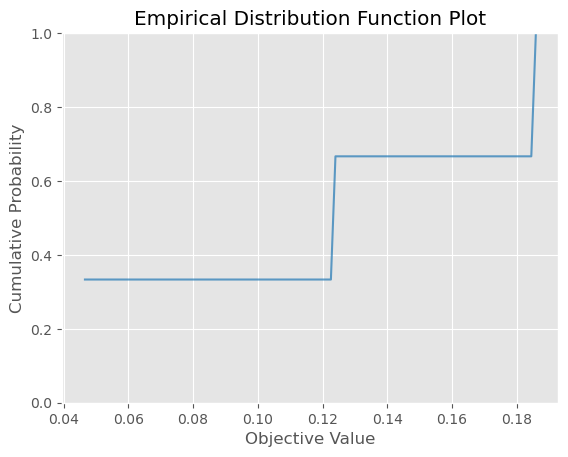

In [399]:
# Visualize empirical distribution function.
plot_edf(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1172520691.py:2: ExperimentalWarning: plot_rank is experimental (supported from v3.2.0). The interface can change in the future.
  plot_rank(study)
[W 2024-06-25 18:35:11,453] Output figures of this Matplotlib-based `plot_rank` function would be different from those of the Plotly-based `plot_rank`.


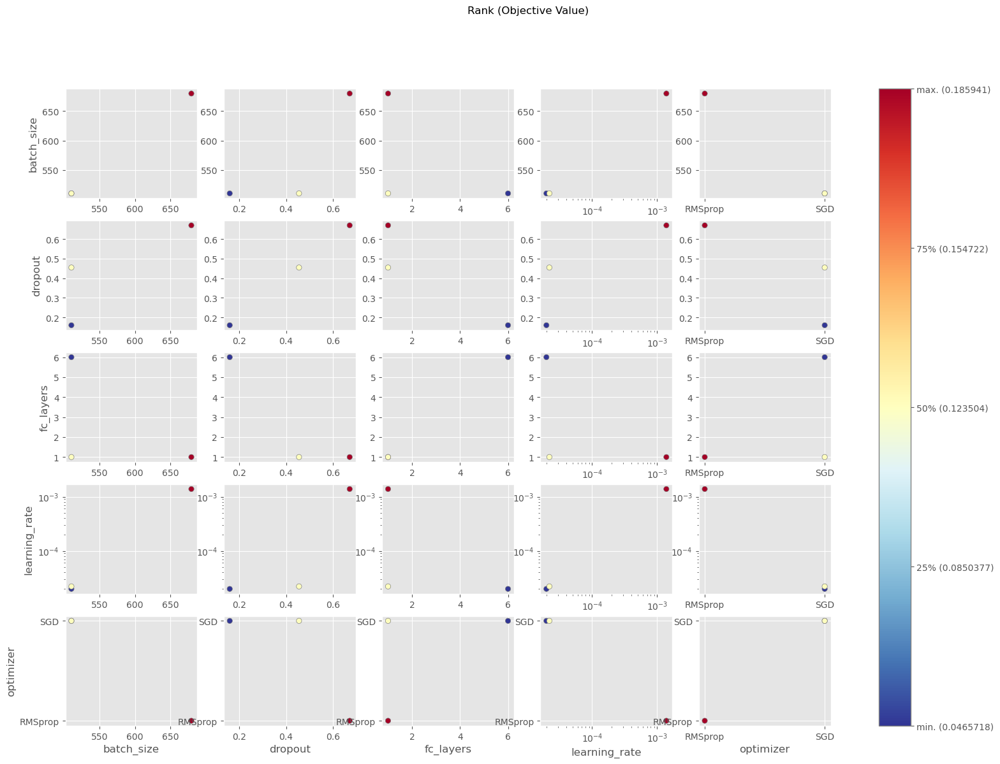

In [400]:
# Visualize parameter relations with scatter plots colored by objective values.
plot_rank(study)
set_size(15, 10)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\124343896.py:2: ExperimentalWarning: plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.
  plot_timeline(study)


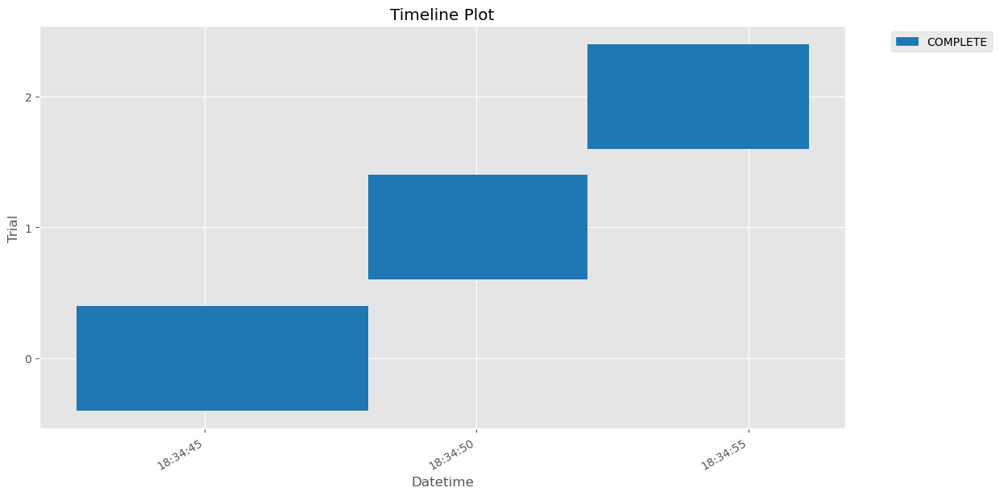

In [401]:
# Visualize the optimization timeline of performed trials.
plot_timeline(study)
set_size(10, 5)

# 2. EO feature set

In [402]:
# split the data into train, validation and test sets, using the same split as one of the baseline models using nested cross-validation
baseline_train_idxs = data_split_indices['EO'][0]
baseline_val_idxs = data_split_indices['EO'][1]
baseline_test_idxs = data_split_indices['EO'][2]

# first splitting validation data using the first split from the baseline RF model
groups = [elem for elem in subjects_eo_ids for i in range(12)] # times 12 for each epoch

print(f'{len(eo_graph_dataset) = }')
print(f'{len(baseline_train_idxs) = }, {len(baseline_val_idxs) = }, {len(baseline_test_idxs) = } total: {len(baseline_train_idxs)+len(baseline_val_idxs)+len(baseline_test_idxs)}')

X_train = [eo_graph_dataset[i] for i in baseline_train_idxs] 
X_val = [eo_graph_dataset[i] for i in baseline_val_idxs]
X_test = [eo_graph_dataset[i] for i in baseline_test_idxs]
Y_train =[eo_y_list[i] for i in baseline_train_idxs]
Y_val = [eo_y_list[i] for i in baseline_val_idxs]
Y_test = [eo_y_list[i] for i in baseline_test_idxs]
groups_train = [groups[i] for i in baseline_train_idxs]
groups_val = [groups[i] for i in baseline_val_idxs]
groups_test = [groups[i] for i in baseline_test_idxs]

len(eo_graph_dataset) = 2700
len(baseline_train_idxs) = 1440, len(baseline_val_idxs) = 720, len(baseline_test_idxs) = 540 total: 2700


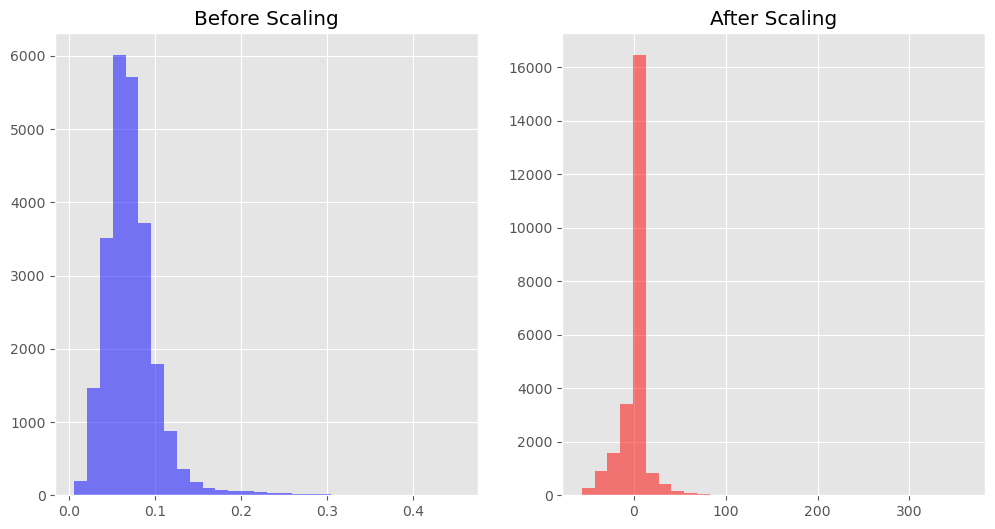

In [403]:
# standardize statistical node features
from sklearn.preprocessing import StandardScaler

# Concatenate all x values before scaling for the first feature, as a sanity check for standardization
x_before = np.concatenate([data.x.numpy()[:, 0] for data in X_train + X_val + X_test])

scaler = StandardScaler()
scaler.fit(np.vstack([data.x.numpy() for data in X_train + X_val])) # fit on training and validation data


# Transform the x values of the data in X_train
for data in X_train:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Transform the x values of the data in X_val
for data in X_val:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Transform the x values of the data in X_test
for data in X_test:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Concatenate all x values after scaling for the first feature, as a sanity check for standardization
x_after = np.concatenate([data.x.numpy()[:, 0] for data in X_train + X_val + X_test])

# Plot the distribution of the first x feature before and after scaling as a sanity check
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(x_before, bins=30, color='b', alpha=0.5)
plt.title('Before Scaling')

plt.subplot(1, 2, 2)
plt.hist(x_after, bins=30, color='r', alpha=0.5)
plt.title('After Scaling')

plt.show()

### Model: standard GCN

In [404]:
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import RichProgressBar
import logging
import warnings

warnings.filterwarnings("ignore", ".*Consider increasing the value of the `num_workers` argument*")
warnings.filterwarnings("ignore", "Trying to infer the `batch_size` from an ambiguous collection.*")
torch.set_float32_matmul_precision('high')
logging.getLogger("lightning.pytorch.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

def objective(trial):
    # Suggest values for the hyperparameters
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    batch_size = trial.suggest_categorical('batch_size', [170, 340, 510, 680, 850])
    dropout = trial.suggest_float('dropout', 0, 0.8)
    edge_threshold = trial.suggest_float('edge_threshold', 0.5, 0.9)
    hyperparameters = dict(learning_rate=learning_rate, optimizer_name=optimizer_name,
                           batch_size=batch_size, dropout=dropout,
                           edge_threshold=edge_threshold)
    print(f'Tested parameters: {hyperparameters}')
    n_epochs = batch_size * 4 # vary training epochs based on batch size

    # Create a copy of the dataset, for this specific trial
    X_train_trial = [data.clone() for data in X_train]
    X_val_trial = [data.clone() for data in X_val]
    X_test_trial = [data.clone() for data in X_test]
    
    # Only include edges with a synchrony value above the threshold in any of the five frequency bands
    for data in X_train_trial:
        data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
    for data in X_val_trial:
        data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
    for data in X_test_trial:
        data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)

    # Create the model
    model = GCN(learning_rate=learning_rate, optimizer_name=optimizer_name, dropout=dropout)

    # Create checkpoint callback
    checkpoint_callback = ModelCheckpoint(monitor='val_f1',
                                        mode='max',
                                        save_top_k=3,
                                        filename='{epoch}-{train_loss:.2f}-{train_f1:.2f}-{val_loss:.2f}-{val_f1:.2f}',
                                        )

    # Create the PyTorch Lightning trainer
    trainer = Trainer(
        accelerator='gpu',
        devices=1,
        max_epochs=n_epochs,
        callbacks=[PyTorchLightningPruningCallback(trial, monitor="val_f1"), checkpoint_callback],
        enable_progress_bar=False,
        enable_model_summary=False,
        logger=True,
        enable_checkpointing=True,
    )

    # Define the data loaders
    train_loader = DataLoader(X_train_trial, batch_size=batch_size, shuffle=True,
                              drop_last=True) # , num_workers=0, persistent_workers=True
    val_loader = DataLoader(X_val_trial, batch_size=len(X_val), shuffle=False,
                            drop_last=True) # , num_workers=0, persistent_workers=True

    # Log the hyperparameters
    trainer.logger.log_hyperparams(hyperparameters)

    # Train the model
    trainer.fit(model, train_loader, val_loader)

    # Evaluate the model
    val_f1 = trainer.callback_metrics["val_f1"].item()

    # After training, store the best model path in the trial's user attributes
    trial.set_user_attr("best_model_path", checkpoint_callback.best_model_path)

    return val_f1

study = optuna.create_study(direction='maximize', pruner=optuna.pruners.MedianPruner(n_warmup_steps=100))
study.optimize(objective, n_trials=100)

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

df = study.trials_dataframe()
df.to_pickle('eo_results_stand_GCN_trials.pkl')

[I 2024-06-25 18:35:17,973] A new study created in memory with name: no-name-d9f8db7e-c312-43a5-ae04-6b829e0d3e3e


Tested parameters: {'learning_rate': 0.01242601897110397, 'optimizer_name': 'SGD', 'batch_size': 340, 'dropout': 0.5520604778100385, 'edge_threshold': 0.5162660544439677}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:298: The number of training batches (4) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\lightning\pytorch\trainer\call.py:54: Detected KeyboardInterrupt, attempting graceful shutdown...
[I 2024-06-25 18:35:20,261] Trial 0 finished with value: 0.07111120969057083 and parameters: {'learning_rate': 0.01242601897110397, 'optimizer': 'SGD', 'batch_size': 340, 'dropout': 0.5520604778100385, 'edge_threshold': 0.5162660544439677}. Best is trial 0 with value: 0.07111120969057083.


Tested parameters: {'learning_rate': 7.61957435030255e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'dropout': 0.6930970454351896, 'edge_threshold': 0.6070643291097815}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:298: The number of training batches (2) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
`Trainer.fit` stopped: `max_epochs=10` reached.
[I 2024-06-25 18:35:23,052] Trial 1 finished with value: 0.12248170375823975 and parameters: {'learning_rate': 7.61957435030255e-05, 'optimizer': 'Adam', 'batch_size': 510, 'dropout': 0.6930970454351896, 'edge_threshold': 0.6070643291097815}. Best is trial 1 with value: 0.12248170375823975.


Tested parameters: {'learning_rate': 0.0005082068030991944, 'optimizer_name': 'SGD', 'batch_size': 510, 'dropout': 0.004473578586037696, 'edge_threshold': 0.6284307336214363}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
`Trainer.fit` stopped: `max_epochs=10` reached.
[I 2024-06-25 18:35:25,793] Trial 2 finished with value: 0.04717746004462242 and parameters: {'learning_rate': 0.0005082068030991944, 'optimizer': 'SGD', 'batch_size': 510, 'dropout': 0.004473578586037696, 'edge_threshold': 0.6284307336214363}. Best is trial 1 with value: 0.12248170375823975.


Best trial:
  Value: 0.12248170375823975
  Params: 
    learning_rate: 7.61957435030255e-05
    optimizer: Adam
    batch_size: 510
    dropout: 0.6930970454351896
    edge_threshold: 0.6070643291097815


In [ ]:
# print the best model path for later tensorboard visualization
print(f'Best model path: {trial.user_attrs["best_model_path"]}')

Best model path: d:\Documents\RU\Master_Neurobiology\Internship_jaar_2\Project\Notebooks\lightning_logs\version_24\checkpoints\epoch=0-train_loss=1.72-train_f1=0.11-val_loss=1.80-val_f1=0.15.ckpt


{'learning_rate': 2.790896603619934e-05, 'optimizer': 'SGD', 'batch_size': 850, 'dropout': 0.6343139714392412, 'edge_threshold': 0.8179065762729425}



GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          val_f1           │    0.15324363112449646    │
│         val_loss          │    1.7968209981918335     │
└───────────────────────────┴───────────────────────────┘

c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


classification report:
               precision    recall  f1-score   support

        ADHD       0.60      0.15      0.24       204
     HEALTHY       0.00      0.00      0.00       144
         MDD       0.00      0.00      0.00        84
         OCD       0.32      0.07      0.12       108
         SMC       0.26      0.94      0.41       180

    accuracy                           0.29       720
   macro avg       0.24      0.23      0.15       720
weighted avg       0.28      0.29      0.19       720

F1-score: 0.15324363880352276


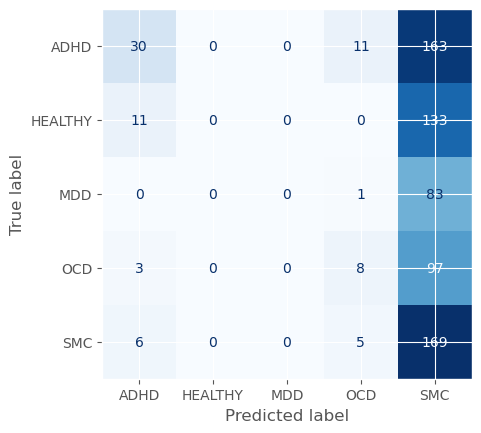

In [ ]:
# final eval on val data for the best model during tuning
# get best model
best_model_path = trial.user_attrs["best_model_path"]
print(trial.params)
learning_rate = trial.params['learning_rate']
optimizer_name = trial.params['optimizer']
dropout = trial.params['dropout']
edge_threshold = trial.params['edge_threshold']
# Load the model directly from the checkpoint
model = GCN.load_from_checkpoint(best_model_path, learning_rate=learning_rate, optimizer_name=optimizer_name, dropout=dropout)

print(model.hparams)
X_val_best_trial = [data.clone() for data in X_val]
for data in X_val_best_trial:
    data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
val_loader = DataLoader(X_val_best_trial, batch_size=len(X_val), shuffle=False,
                            drop_last=True)

trainer = Trainer(accelerator='gpu', devices=1, enable_progress_bar=False, enable_model_summary=False, logger=False, enable_checkpointing=False)
trainer.validate(model, val_loader)

# compute confusion matrix and classification report with sklearn of best model checkpoint
from sklearn.metrics import f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
y_pred = trainer.predict(model, val_loader)
y_pred = np.concatenate(y_pred).flatten()
y = Y_val

class_labels = le.inverse_transform(sorted(np.unique(y)))
print('classification report:\n', classification_report(y, y_pred, target_names=class_labels))
print('F1-score:', f1_score(y, y_pred, average="macro"))
cm = confusion_matrix(y, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False)
plt.grid(False)


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          val_f1           │    0.15161405503749847    │
│         val_loss          │     2.417970895767212     │
└───────────────────────────┴───────────────────────────┘

classification report:
               precision    recall  f1-score   support

        ADHD       0.23      0.46      0.31       108
     HEALTHY       0.00      0.00      0.00       108
         MDD       0.00      0.00      0.00       108
         OCD       0.17      0.11      0.14       108
         SMC       0.23      0.53      0.32       108

    accuracy                           0.22       540
   macro avg       0.13      0.22      0.15       540
weighted avg       0.13      0.22      0.15       540

F1-score:
 0.1516140569118333


c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


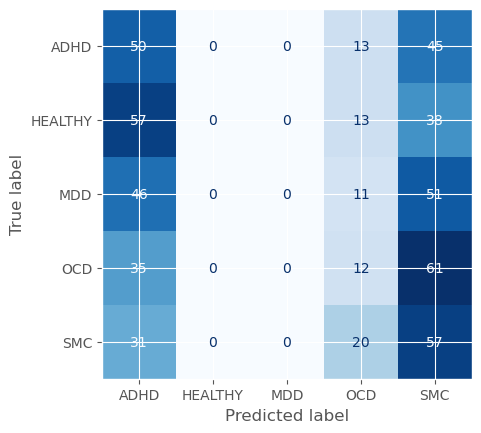

In [ ]:
# final eval on test data for the best model during tuning
X_test_best_trial = [data.clone() for data in X_test]
for data in X_test_best_trial:
    data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
test_loader = DataLoader(X_test_best_trial, batch_size=len(X_test), shuffle=False,
                            drop_last=True)

trainer = Trainer(accelerator='gpu', devices=1, enable_progress_bar=False, enable_model_summary=False, logger=False, enable_checkpointing=False)
trainer.validate(model, test_loader)

# compute confusion matrix and classification report with sklearn of best model checkpoint
from sklearn.metrics import f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
y_pred = trainer.predict(model, test_loader)
y_pred = np.concatenate(y_pred).flatten()
y = Y_test

class_labels = le.inverse_transform(sorted(np.unique(y)))
print('classification report:\n', classification_report(y, y_pred, target_names=class_labels))
print('F1-score:\n', f1_score(y, y_pred, average="macro"))
cm = confusion_matrix(y, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False)
plt.grid(False)


In [ ]:
df_trials = pd.read_pickle('eo_results_stand_GCN_trials.pkl')
df_trials.sort_values('value', ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_edge_threshold,params_learning_rate,params_optimizer,user_attrs_best_model_path,state
0,0,0.110785,2024-06-25 17:52:53.541356,2024-06-25 17:52:55.881469,0 days 00:00:02.340113,850,0.634314,0.817907,0.000028,SGD,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE
1,1,0.068786,2024-06-25 17:52:55.883471,2024-06-25 17:52:58.544901,0 days 00:00:02.661430,680,0.755815,0.757645,0.007250,Adam,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE
2,2,0.067700,2024-06-25 17:52:58.545902,2024-06-25 17:53:01.645726,0 days 00:00:03.099824,680,0.393565,0.786378,0.000020,RMSprop,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE


#### Visualizations

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1755039964.py:2: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

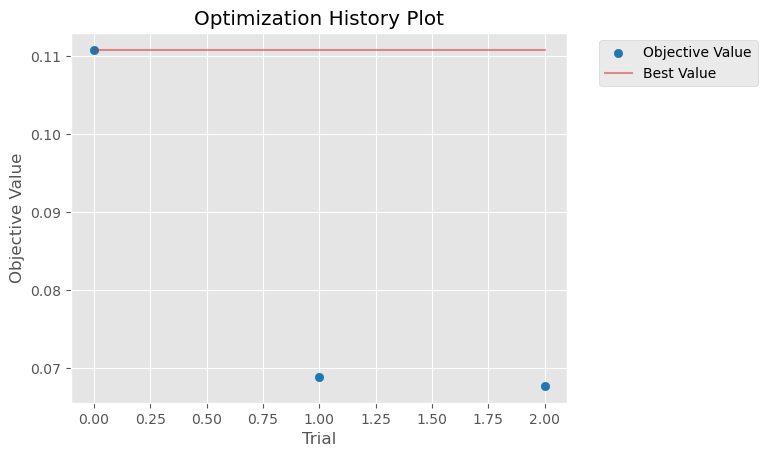

In [ ]:
# Visualize the optimization history
plot_optimization_history(study)

[I 2024-06-25 17:53:03,402] A new study created in memory with name: no-name-c8fa5508-ad85-4eba-8c43-ef874437f52d
C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\3414932042.py:7: ExperimentalWarning: plot_intermediate_values is experimental (supported from v2.2.0). The interface can change in the future.
  plot_intermediate_values(plotted_study)


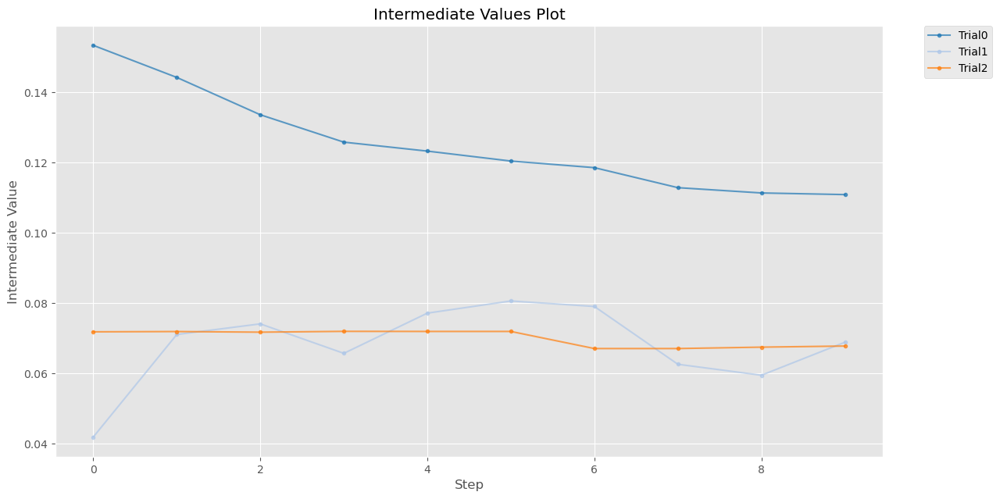

In [ ]:
# Visualize the learning curves of the best 10 trials
trials = study.trials
plotted_trials = sorted(trials, key=lambda t: t.value, reverse=True)[:10]
plotted_study = optuna.create_study()
for trial in plotted_trials:
    plotted_study.add_trial(trial)
plot_intermediate_values(plotted_study)
set_size(10, 5)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\2919792376.py:2: ExperimentalWarning: plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  plot_parallel_coordinate(study)


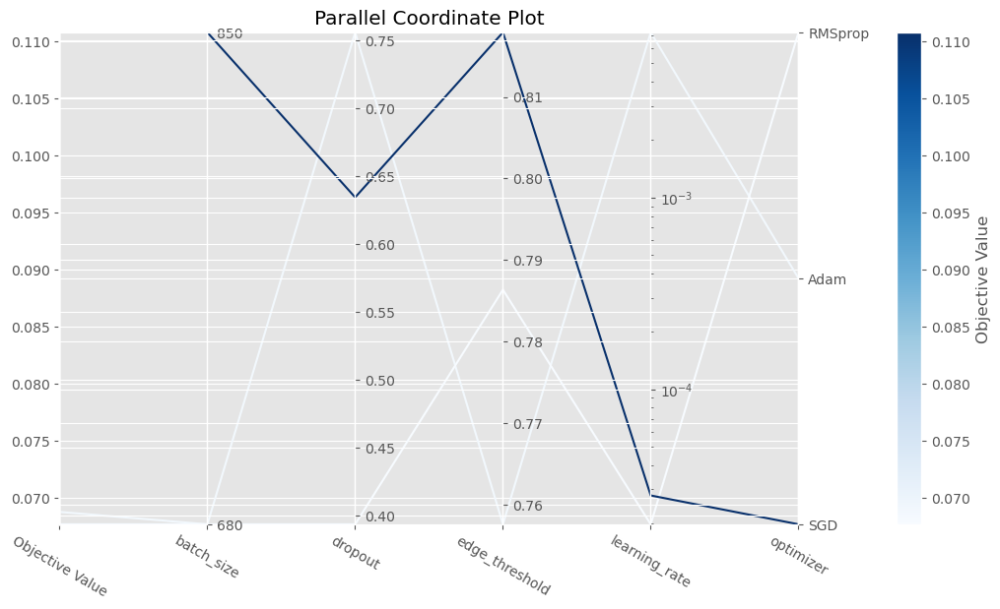

In [ ]:
# Visualize high-dimensional parameter relationships.
plot_parallel_coordinate(study)
set_size(10, 5)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\624402143.py:2: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  plot_contour(study)
[W 2024-06-25 17:53:05,113] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.


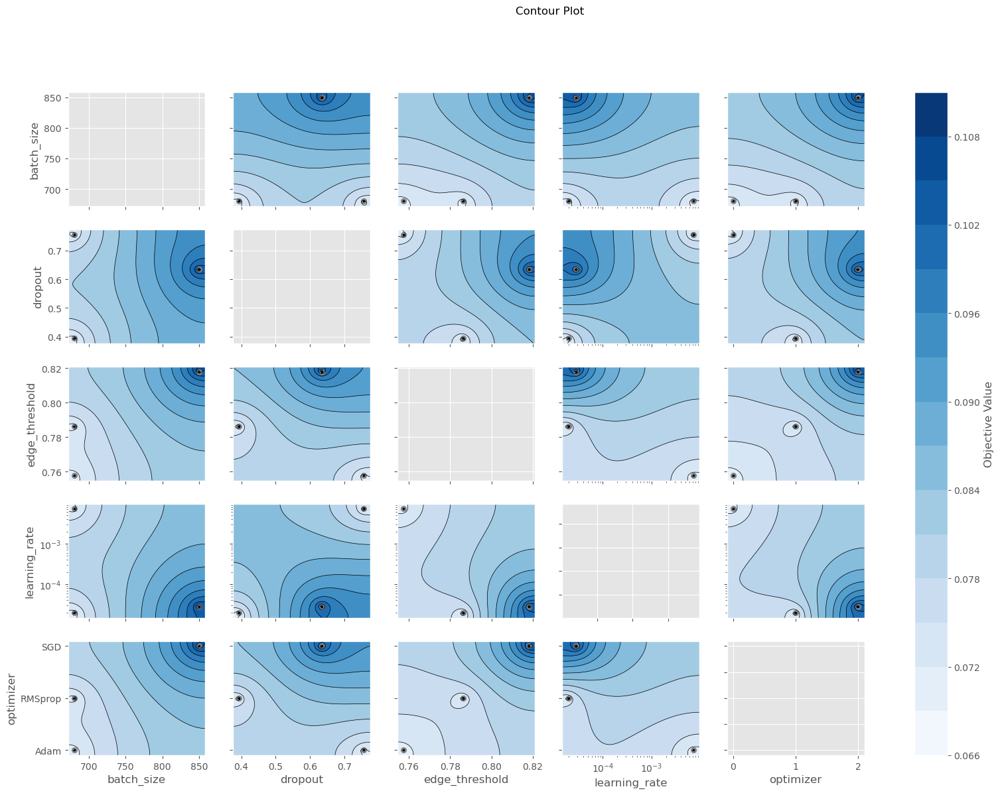

In [ ]:
# Visualize hyperparameter relationships
plot_contour(study)
set_size(15, 10)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1888575690.py:2: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  plot_slice(study)


array([<Axes: xlabel='batch_size', ylabel='Objective Value'>,
       <Axes: xlabel='dropout'>, <Axes: xlabel='edge_threshold'>,
       <Axes: xlabel='learning_rate'>, <Axes: xlabel='optimizer'>],
      dtype=object)

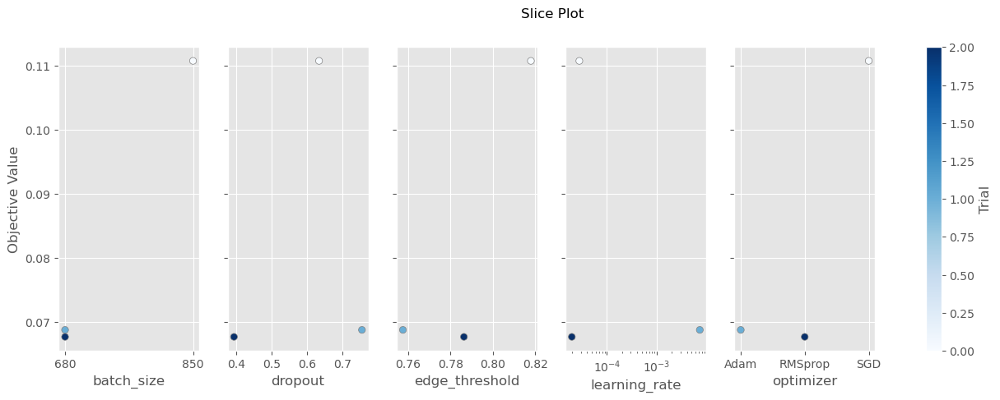

In [ ]:
# Visualize individual hyperparameters as slice plot
plot_slice(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1473508994.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

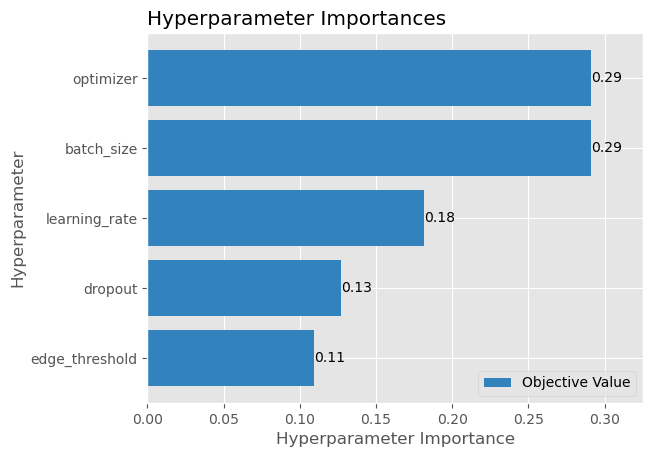

In [ ]:
# Visualize parameter importances.
plot_param_importances(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\3113371256.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

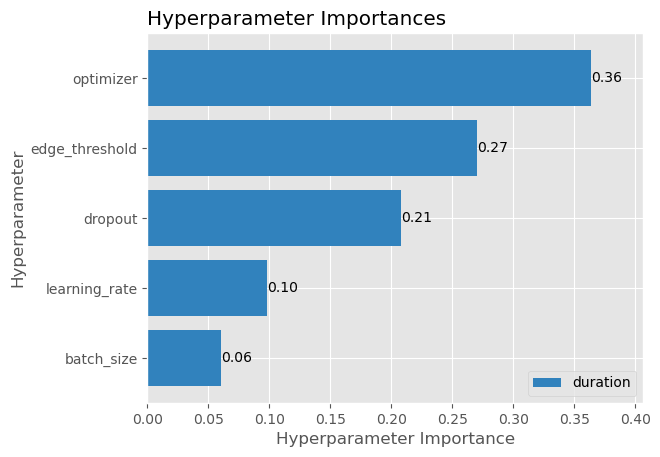

In [ ]:
# Learn which hyperparameters are affecting the trial duration with hyperparameter importance.
plot_param_importances(
    study, target=lambda t: t.duration.total_seconds(), target_name="duration"
)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1828777839.py:2: ExperimentalWarning: plot_edf is experimental (supported from v2.2.0). The interface can change in the future.
  plot_edf(study)


<Axes: title={'center': 'Empirical Distribution Function Plot'}, xlabel='Objective Value', ylabel='Cumulative Probability'>

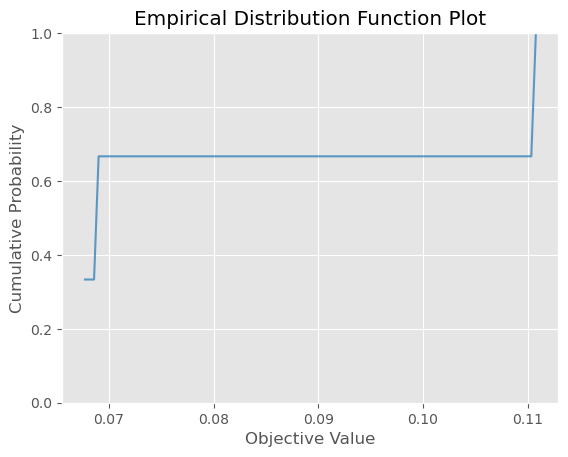

In [ ]:
# Visualize empirical distribution function.
plot_edf(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1172520691.py:2: ExperimentalWarning: plot_rank is experimental (supported from v3.2.0). The interface can change in the future.
  plot_rank(study)
[W 2024-06-25 17:53:15,205] Output figures of this Matplotlib-based `plot_rank` function would be different from those of the Plotly-based `plot_rank`.


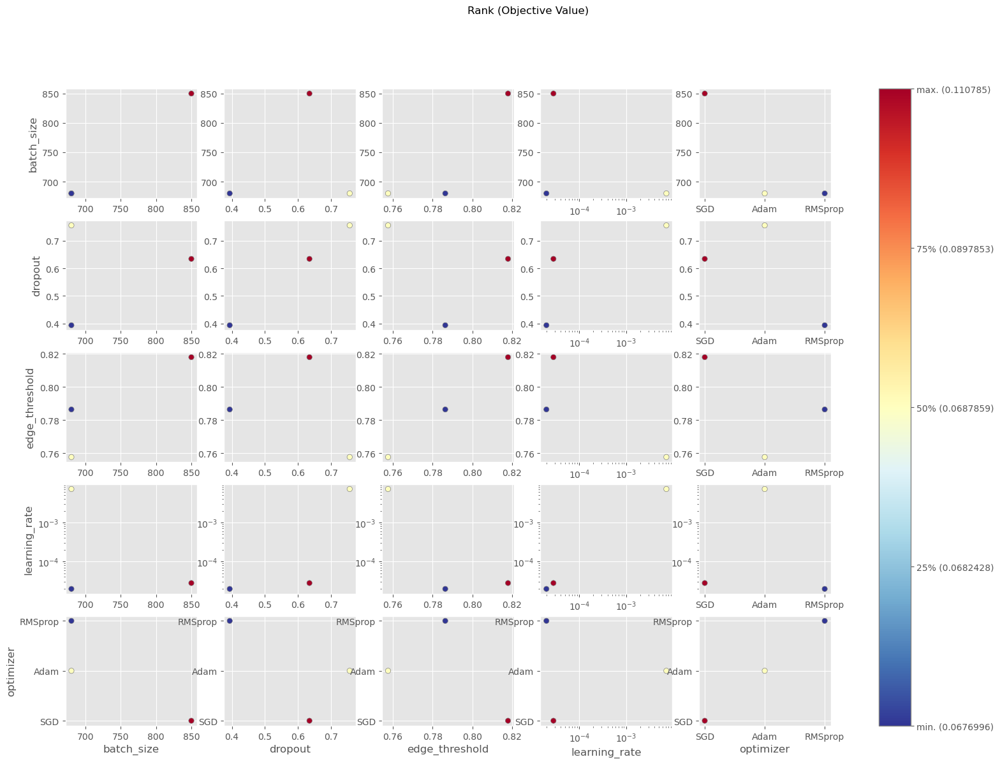

In [ ]:
# Visualize parameter relations with scatter plots colored by objective values.
plot_rank(study)
set_size(15, 10)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\124343896.py:2: ExperimentalWarning: plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.
  plot_timeline(study)


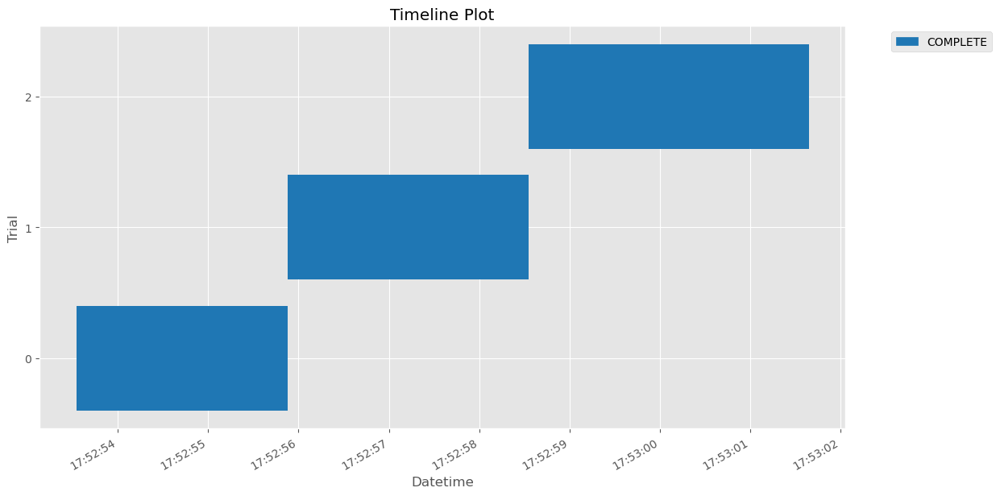

In [ ]:
# Visualize the optimization timeline of performed trials.
plot_timeline(study)
set_size(10, 5)

### Model: graphLambda without edge_attr

In [ ]:
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import RichProgressBar
import logging
import warnings

warnings.filterwarnings("ignore", ".*Consider increasing the value of the `num_workers` argument*")
warnings.filterwarnings("ignore", "Trying to infer the `batch_size` from an ambiguous collection.*")
torch.set_float32_matmul_precision('high')
logging.getLogger("lightning.pytorch.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

def objective(trial):
    # Suggest values for the hyperparameters
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    batch_size = trial.suggest_categorical('batch_size', [170, 340, 510, 680, 850])
    fc_layers = trial.suggest_int('fc_layers', 1, 8)
    dropout = trial.suggest_float('dropout', 0, 0.8)
    edge_threshold = trial.suggest_float('edge_threshold', 0.5, 0.9)
    hyperparameters = dict(learning_rate=learning_rate, optimizer_name=optimizer_name,
                           batch_size=batch_size, fc_layers=fc_layers, dropout=dropout,
                           edge_threshold=edge_threshold)
    print(f'Tested parameters: {hyperparameters}')
    n_epochs = batch_size * 4 # vary training epochs based on batch size

    # Create a copy of the dataset, for this specific trial
    X_train_trial = [data.clone() for data in X_train]
    X_val_trial = [data.clone() for data in X_val]
    X_test_trial = [data.clone() for data in X_test]
    
    # Only include edges with a synchrony value above the threshold in any of the five frequency bands
    for data in X_train_trial:
        data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
    for data in X_val_trial:
        data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
    for data in X_test_trial:
        data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)

    # Create the model
    model = graphLambda_wo_edge_attr(learning_rate=learning_rate, optimizer_name=optimizer_name, fc_layers=fc_layers, dropout=dropout)

    # Create checkpoint callback
    checkpoint_callback = ModelCheckpoint(monitor='val_f1',
                                        mode='max',
                                        save_top_k=3,
                                        filename='{epoch}-{train_loss:.2f}-{train_f1:.2f}-{val_loss:.2f}-{val_f1:.2f}',
                                        )

    # Create the PyTorch Lightning trainer
    trainer = Trainer(
        accelerator='gpu',
        devices=1,
        max_epochs=n_epochs,
        callbacks=[PyTorchLightningPruningCallback(trial, monitor="val_f1"), checkpoint_callback],
        enable_progress_bar=False,
        enable_model_summary=False,
        logger=True,
        enable_checkpointing=True,
    )

    # Define the data loaders
    train_loader = DataLoader(X_train_trial, batch_size=batch_size, shuffle=True,
                              drop_last=True) # , num_workers=0, persistent_workers=True
    val_loader = DataLoader(X_val_trial, batch_size=len(X_val), shuffle=False,
                            drop_last=True) # , num_workers=0, persistent_workers=True

    # Log the hyperparameters
    trainer.logger.log_hyperparams(hyperparameters)

    # Train the model
    trainer.fit(model, train_loader, val_loader)

    # Evaluate the model
    val_f1 = trainer.callback_metrics["val_f1"].item()

    # After training, store the best model path in the trial's user attributes
    trial.set_user_attr("best_model_path", checkpoint_callback.best_model_path)

    return val_f1

study = optuna.create_study(direction='maximize', pruner=optuna.pruners.ThresholdPruner(lower=0.1, n_warmup_steps=100))
study.optimize(objective, n_trials=100)

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

df = study.trials_dataframe()
df.to_pickle('eo_results_wo_edge_attrs_trials.pkl')

[I 2024-06-25 17:53:21,547] A new study created in memory with name: no-name-5ef563e2-8fb6-4125-8928-7fc92d1a94c9


Tested parameters: {'learning_rate': 0.013580012351995813, 'optimizer_name': 'SGD', 'batch_size': 510, 'fc_layers': 5, 'dropout': 0.518857161170709, 'edge_threshold': 0.7823680842384573}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:298: The number of training batches (2) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
`Trainer.fit` stopped: `max_epochs=10` reached.
[I 2024-06-25 17:53:24,790] Trial 0 finished with value: 0.1018221527338028 and parameters: {'learning_rate': 0.013580012351995813, 'optimizer': 'SGD', 'batch_size': 510, 'fc_layers': 5, 'dropout': 0.518857161170709, 'edge_threshold': 0.7823680842384573}. Best is trial 0 with value: 0.1018221527338028.


Tested parameters: {'learning_rate': 0.0027373247309208293, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.047760207596922837, 'edge_threshold': 0.5651358047232539}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:298: The number of training batches (8) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
`Trainer.fit` stopped: `max_epochs=10` reached.
[I 2024-06-25 17:53:29,580] Trial 1 finished with value: 0.08831167966127396 and parameters: {'learning_rate': 0.0027373247309208293, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.047760207596922837, 'edge_threshold': 0.5651358047232539}. Best is trial 0 with value: 0.1018221527338028.


Tested parameters: {'learning_rate': 2.3632989259856358e-05, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 8, 'dropout': 0.2564377819796369, 'edge_threshold': 0.715647527597193}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:298: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
`Trainer.fit` stopped: `max_epochs=10` reached.
[I 2024-06-25 17:53:32,901] Trial 2 finished with value: 0.08282316476106644 and parameters: {'learning_rate': 2.3632989259856358e-05, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 8, 'dropout': 0.2564377819796369, 'edge_threshold': 0.715647527597193}. Best is trial 0 with value: 0.1018221527338028.


Best trial:
  Value: 0.1018221527338028
  Params: 
    learning_rate: 0.013580012351995813
    optimizer: SGD
    batch_size: 510
    fc_layers: 5
    dropout: 0.518857161170709
    edge_threshold: 0.7823680842384573


In [ ]:
# print the best model path for later tensorboard visualization
print(f'Best model path: {trial.user_attrs["best_model_path"]}')

Best model path: d:\Documents\RU\Master_Neurobiology\Internship_jaar_2\Project\Notebooks\lightning_logs\version_27\checkpoints\epoch=0-train_loss=1.70-train_f1=0.19-val_loss=1.61-val_f1=0.12.ckpt


{'learning_rate': 0.013580012351995813, 'optimizer': 'SGD', 'batch_size': 510, 'fc_layers': 5, 'dropout': 0.518857161170709, 'edge_threshold': 0.7823680842384573}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          val_f1           │    0.11702297627925873    │
│         val_loss          │    1.6109824180603027     │
└───────────────────────────┴───────────────────────────┘

classification report:
               precision    recall  f1-score   support

        ADHD       0.41      0.12      0.18       204
     HEALTHY       0.00      0.00      0.00       144
         MDD       0.12      0.90      0.21        84
         OCD       0.00      0.00      0.00       108
         SMC       0.59      0.11      0.19       180

    accuracy                           0.17       720
   macro avg       0.22      0.23      0.12       720
weighted avg       0.28      0.17      0.12       720

F1-score: 0.11702298451698226


c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


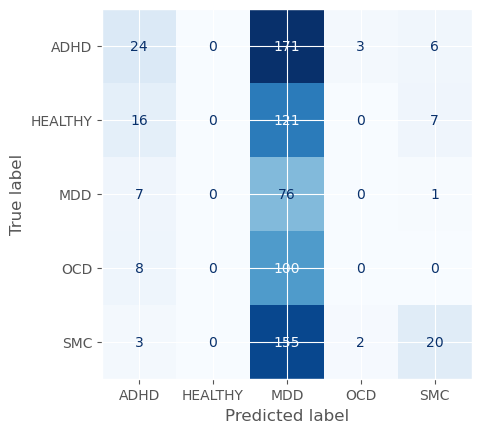

In [ ]:
# final eval on val data for the best model during tuning
# get best model
best_model_path = trial.user_attrs["best_model_path"]
print(trial.params)
learning_rate = trial.params['learning_rate']
optimizer_name = trial.params['optimizer']
dropout = trial.params['dropout']
fc_layers = trial.params['fc_layers']
edge_threshold = trial.params['edge_threshold']
# Load the model directly from the checkpoint
model = graphLambda_wo_edge_attr.load_from_checkpoint(best_model_path, learning_rate=learning_rate, optimizer_name=optimizer_name, dropout=dropout, fc_layers=fc_layers)

X_val_best_trial = [data.clone() for data in X_val]
for data in X_val_best_trial:
    data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
    
print(model.hparams)

val_loader = DataLoader(X_val_best_trial, batch_size=len(X_val), shuffle=False,
                            drop_last=True)

trainer = Trainer(accelerator='gpu', devices=1, enable_progress_bar=False, enable_model_summary=False, logger=False, enable_checkpointing=False)
trainer.validate(model, val_loader)

# compute confusion matrix and classification report with sklearn of best model checkpoint
from sklearn.metrics import f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
y_pred = trainer.predict(model, val_loader)
y_pred = np.concatenate(y_pred).flatten()
y = Y_val

class_labels = le.inverse_transform(sorted(np.unique(y)))
print('classification report:\n', classification_report(y, y_pred, target_names=class_labels))
print('F1-score:', f1_score(y, y_pred, average="macro"))
cm = confusion_matrix(y, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False)
plt.grid(False)


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          val_f1           │    0.21941885352134705    │
│         val_loss          │    1.6049433946609497     │
└───────────────────────────┴───────────────────────────┘

classification report:
               precision    recall  f1-score   support

        ADHD       0.23      0.33      0.27       108
     HEALTHY       0.11      0.01      0.02       108
         MDD       0.25      0.56      0.34       108
         OCD       0.26      0.05      0.08       108
         SMC       0.38      0.39      0.38       108

    accuracy                           0.27       540
   macro avg       0.25      0.27      0.22       540
weighted avg       0.25      0.27      0.22       540

F1-score:
 0.21941885701188787


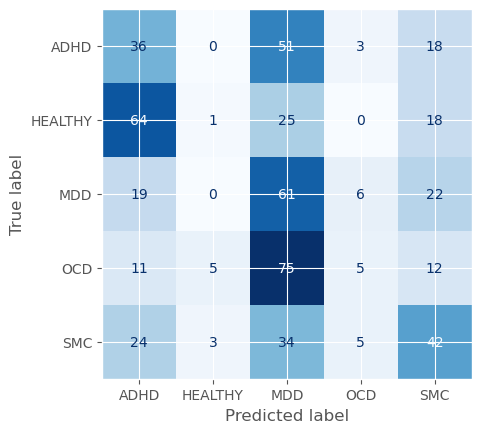

In [ ]:
# final eval on test data for the best model during tuning
X_test_best_trial = [data.clone() for data in X_test]
for data in X_test_best_trial:
    data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
test_loader = DataLoader(X_test_best_trial, batch_size=len(X_test), shuffle=False,
                            drop_last=True)

trainer = Trainer(accelerator='gpu', devices=1, enable_progress_bar=False, enable_model_summary=False, logger=False, enable_checkpointing=False)
trainer.validate(model, test_loader)

# compute confusion matrix and classification report with sklearn of best model checkpoint
from sklearn.metrics import f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
y_pred = trainer.predict(model, test_loader)
y_pred = np.concatenate(y_pred).flatten()
y = Y_test

class_labels = le.inverse_transform(sorted(np.unique(y)))
print('classification report:\n', classification_report(y, y_pred, target_names=class_labels))
print('F1-score:\n', f1_score(y, y_pred, average="macro"))
cm = confusion_matrix(y, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False)
plt.grid(False)


In [ ]:
df_trials = pd.read_pickle('eo_results_wo_edge_attrs_trials.pkl')
df_trials.sort_values('value', ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_edge_threshold,params_fc_layers,params_learning_rate,params_optimizer,user_attrs_best_model_path,state
0,0,0.101822,2024-06-25 17:53:21.548780,2024-06-25 17:53:24.789665,0 days 00:00:03.240885,510,0.518857,0.782368,5,0.013580,SGD,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE
1,1,0.088312,2024-06-25 17:53:24.791676,2024-06-25 17:53:29.579022,0 days 00:00:04.787346,170,0.047760,0.565136,3,0.002737,RMSprop,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE
2,2,0.082823,2024-06-25 17:53:29.581024,2024-06-25 17:53:32.900044,0 days 00:00:03.319020,850,0.256438,0.715648,8,0.000024,Adam,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE


#### Visualizations

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1755039964.py:2: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

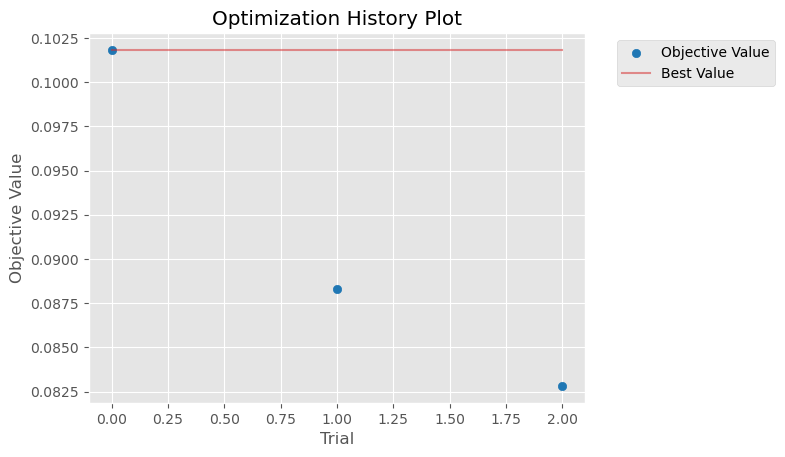

In [ ]:
# Visualize the optimization history
plot_optimization_history(study)

[I 2024-06-25 17:53:34,832] A new study created in memory with name: no-name-a82eea18-0224-4f9b-b6ec-6052767cd32f
C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\3414932042.py:7: ExperimentalWarning: plot_intermediate_values is experimental (supported from v2.2.0). The interface can change in the future.
  plot_intermediate_values(plotted_study)


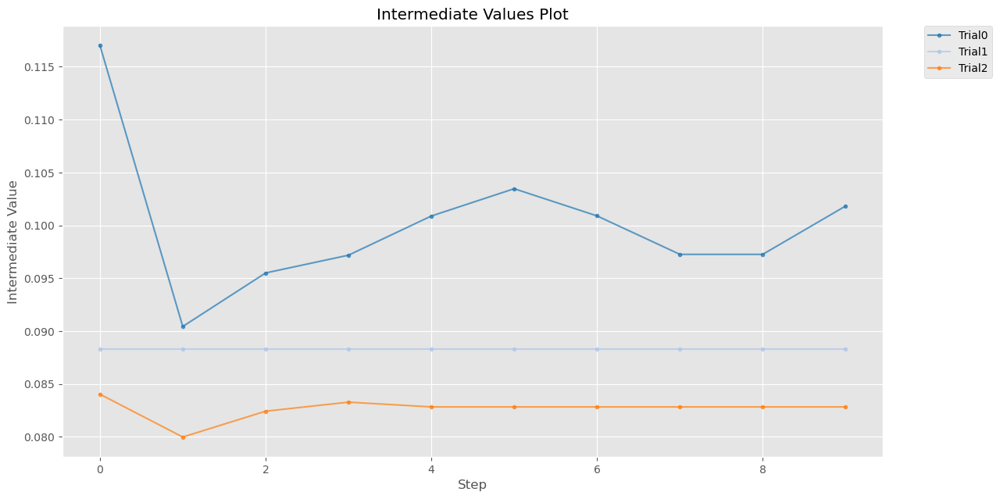

In [ ]:
# Visualize the learning curves of the best 10 trials
trials = study.trials
plotted_trials = sorted(trials, key=lambda t: t.value, reverse=True)[:10]
plotted_study = optuna.create_study()
for trial in plotted_trials:
    plotted_study.add_trial(trial)
plot_intermediate_values(plotted_study)
set_size(10, 5)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\2919792376.py:2: ExperimentalWarning: plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  plot_parallel_coordinate(study)


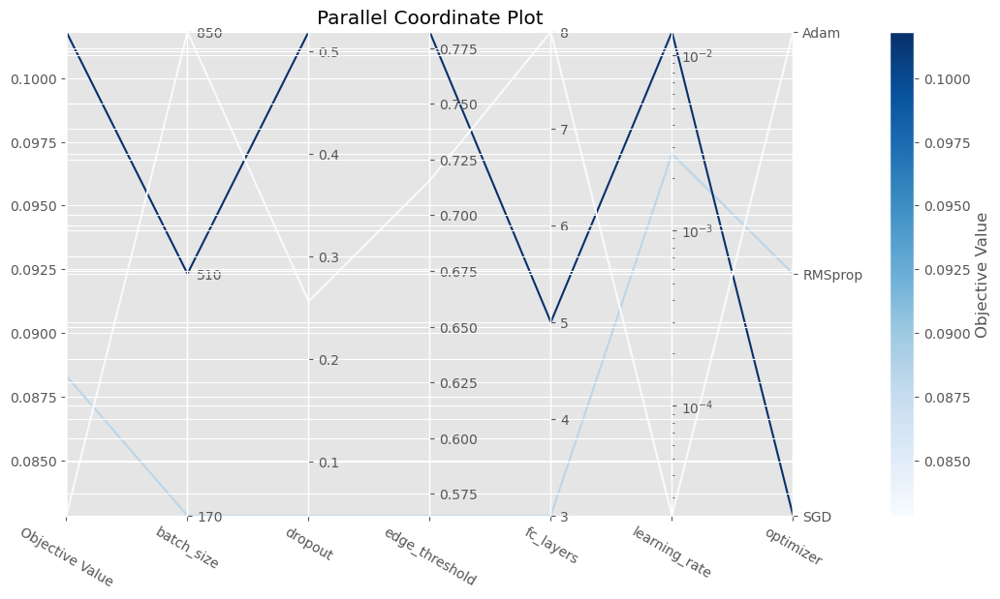

In [ ]:
# Visualize high-dimensional parameter relationships.
plot_parallel_coordinate(study)
set_size(10, 5)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\624402143.py:2: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  plot_contour(study)
[W 2024-06-25 17:53:37,259] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.


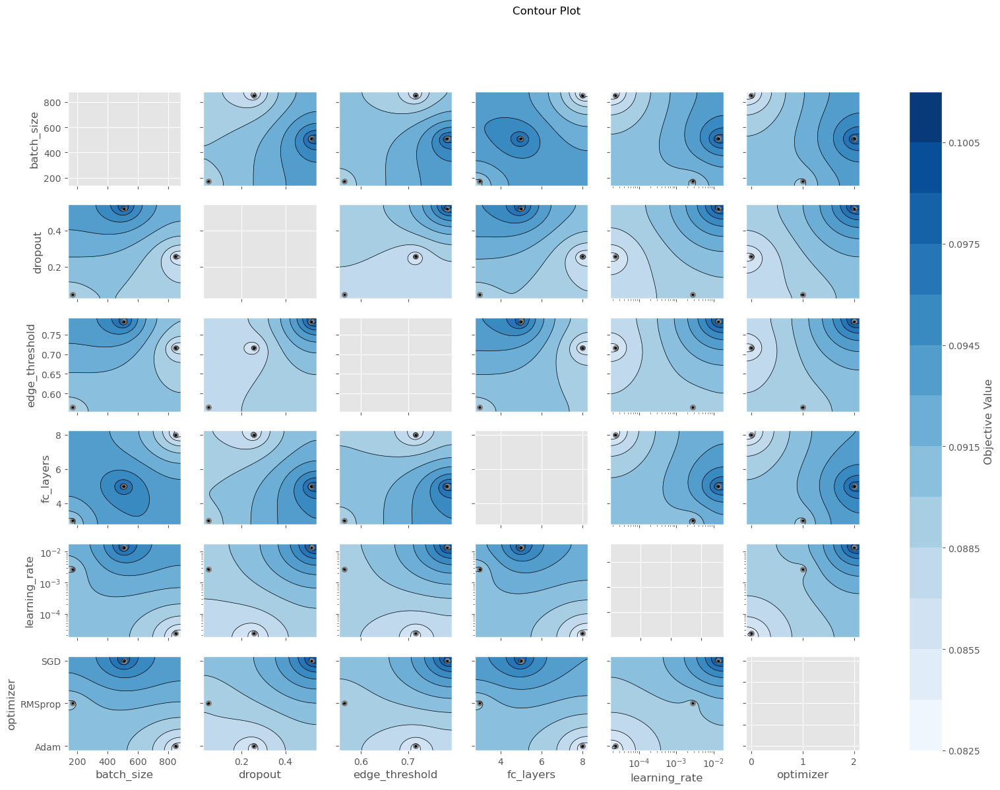

In [ ]:
# Visualize hyperparameter relationships
plot_contour(study)
set_size(15, 10)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1888575690.py:2: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  plot_slice(study)


array([<Axes: xlabel='batch_size', ylabel='Objective Value'>,
       <Axes: xlabel='dropout'>, <Axes: xlabel='edge_threshold'>,
       <Axes: xlabel='fc_layers'>, <Axes: xlabel='learning_rate'>,
       <Axes: xlabel='optimizer'>], dtype=object)

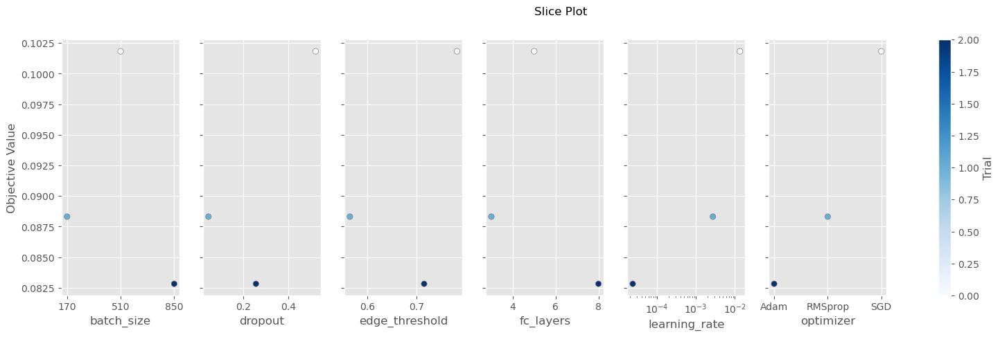

In [ ]:
# Visualize individual hyperparameters as slice plot
plot_slice(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1473508994.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

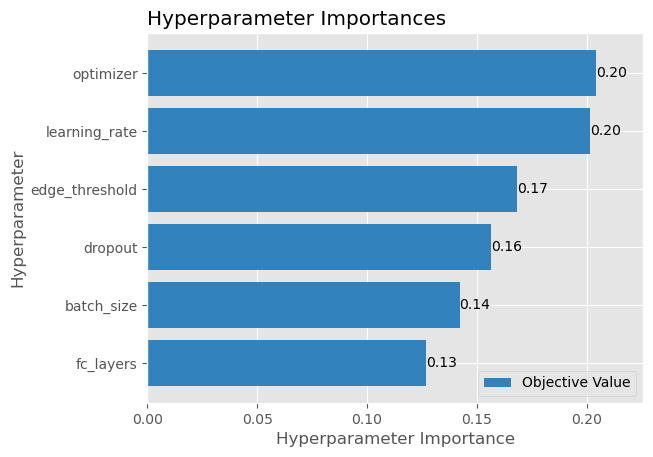

In [ ]:
# Visualize parameter importances.
plot_param_importances(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\3113371256.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

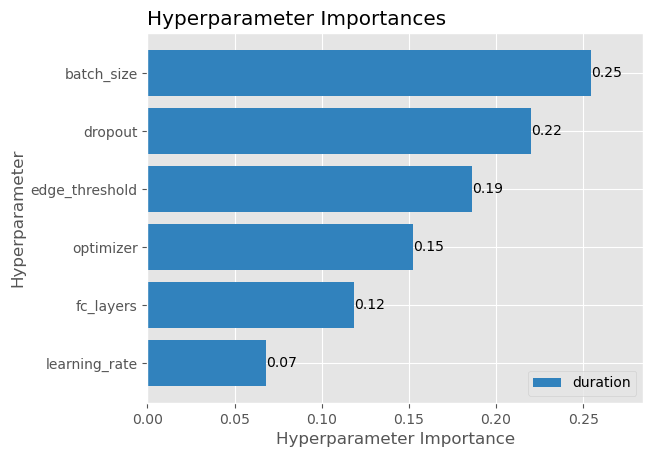

In [ ]:
# Learn which hyperparameters are affecting the trial duration with hyperparameter importance.
plot_param_importances(
    study, target=lambda t: t.duration.total_seconds(), target_name="duration"
)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1828777839.py:2: ExperimentalWarning: plot_edf is experimental (supported from v2.2.0). The interface can change in the future.
  plot_edf(study)


<Axes: title={'center': 'Empirical Distribution Function Plot'}, xlabel='Objective Value', ylabel='Cumulative Probability'>

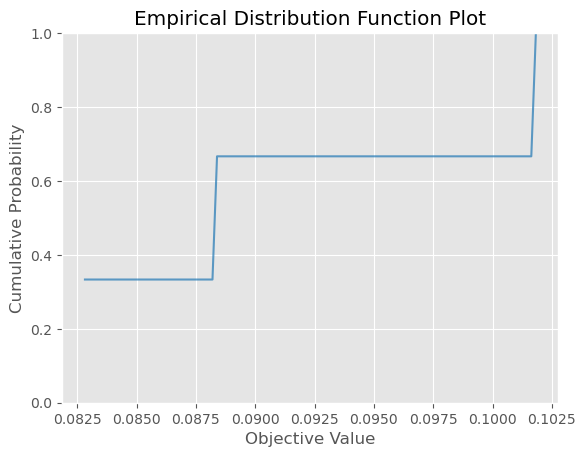

In [ ]:
# Visualize empirical distribution function.
plot_edf(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1172520691.py:2: ExperimentalWarning: plot_rank is experimental (supported from v3.2.0). The interface can change in the future.
  plot_rank(study)
[W 2024-06-25 17:53:50,672] Output figures of this Matplotlib-based `plot_rank` function would be different from those of the Plotly-based `plot_rank`.


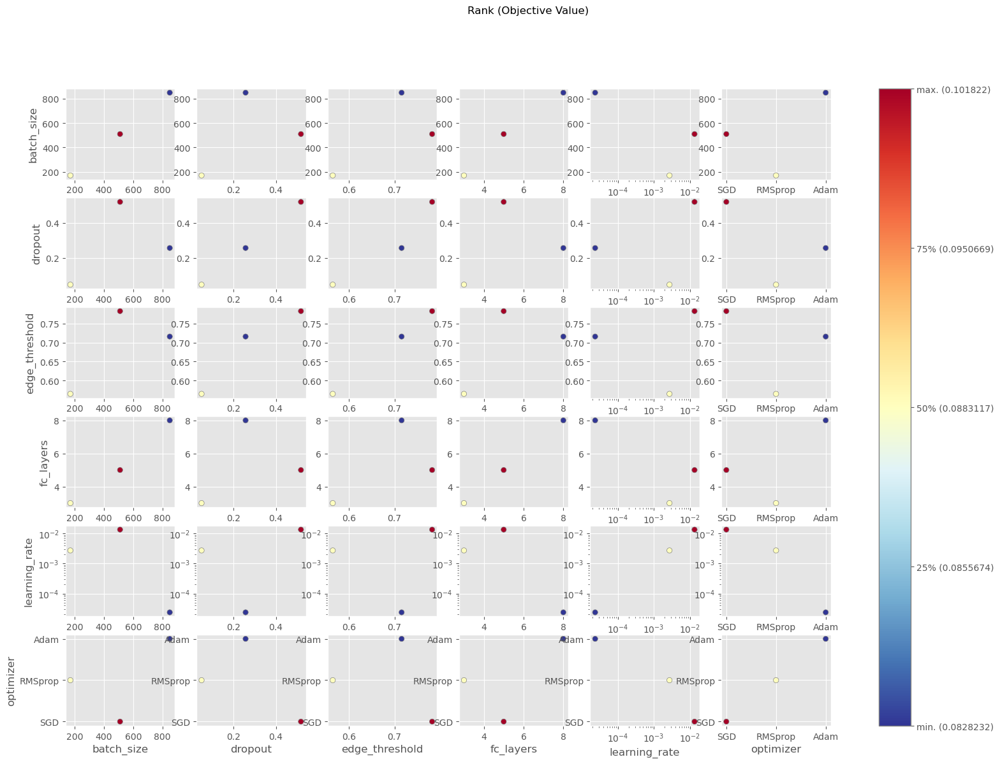

In [ ]:
# Visualize parameter relations with scatter plots colored by objective values.
plot_rank(study)
set_size(15, 10)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\124343896.py:2: ExperimentalWarning: plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.
  plot_timeline(study)


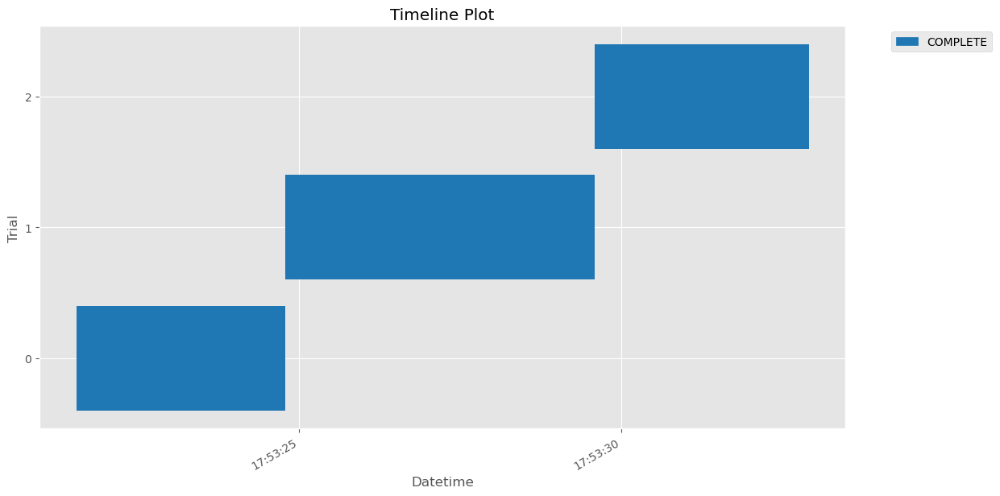

In [ ]:
# Visualize the optimization timeline of performed trials.
plot_timeline(study)
set_size(10, 5)

### Model: graphLambda with edge_attr

In [ ]:
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import RichProgressBar
import logging
import warnings

warnings.filterwarnings("ignore", ".*Consider increasing the value of the `num_workers` argument*")
warnings.filterwarnings("ignore", "Trying to infer the `batch_size` from an ambiguous collection.*")
torch.set_float32_matmul_precision('high')
logging.getLogger("lightning.pytorch.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

def objective(trial):
    # Suggest values for the hyperparameters
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    batch_size = trial.suggest_categorical('batch_size', [170, 340, 510, 680, 850])
    fc_layers = trial.suggest_int('fc_layers', 1, 8)
    dropout = trial.suggest_float('dropout', 0, 0.8)
    hyperparameters = dict(learning_rate=learning_rate, optimizer_name=optimizer_name, batch_size=batch_size, fc_layers=fc_layers, dropout=dropout)
    print(f'Tested parameters: {hyperparameters}')
    n_epochs = batch_size * 4 # vary training epochs based on batch size

    # Create the model
    model = graphLambda_w_edge_attr(learning_rate=learning_rate, optimizer_name=optimizer_name, fc_layers=fc_layers, dropout=dropout)


    # Create checkpoint callback
    checkpoint_callback = ModelCheckpoint(monitor='val_f1',
                                        mode='max',
                                        save_top_k=3,
                                        filename='{epoch}-{train_loss:.2f}-{train_f1:.2f}-{val_loss:.2f}-{val_f1:.2f}',
                                        )

    # Create the PyTorch Lightning trainer
    trainer = Trainer(
        accelerator='gpu',
        devices=1,
        max_epochs=n_epochs,
        callbacks=[PyTorchLightningPruningCallback(trial, monitor="val_f1"), checkpoint_callback],
        enable_progress_bar=False,
        enable_model_summary=False,
        logger=True,
        enable_checkpointing=True,
    )

    # Define the data loaders
    train_loader = DataLoader(X_train, batch_size=batch_size, shuffle=True,
                              drop_last=True) # , num_workers=0, persistent_workers=True
    val_loader = DataLoader(X_val, batch_size=len(X_val), shuffle=False,
                            drop_last=True) # , num_workers=0, persistent_workers=True

    # Log the hyperparameters
    trainer.logger.log_hyperparams(hyperparameters)

    # Train the model
    trainer.fit(model, train_loader, val_loader)

    # Evaluate the model
    val_f1 = trainer.callback_metrics["val_f1"].item()

    # After training, store the best model path in the trial's user attributes
    trial.set_user_attr("best_model_path", checkpoint_callback.best_model_path)

    return val_f1

study = optuna.create_study(direction='maximize', pruner=optuna.pruners.ThresholdPruner(lower=0.1, n_warmup_steps=100))
study.optimize(objective, n_trials=100)

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

df = study.trials_dataframe()
df.to_pickle('eo_results_w_edge_attrs_trials.pkl')

[I 2024-06-25 17:53:57,740] A new study created in memory with name: no-name-a960c4d9-449f-47b7-ba40-a3e6e0302268
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Tested parameters: {'learning_rate': 0.0003440137760424546, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 8, 'dropout': 0.21400881630912016}


c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:298: The number of training batches (2) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
`Trainer.fit` stopped: `max_epochs=10` reached.
[I 2024-06-25 17:54:02,391] Trial 0 finished with value: 0.08989590406417847 and parameters: {'learning_rate': 0.0003440137760424546, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 8, 'dropout': 0.21400881630912016}. Best is trial 0 with value: 0.08989590406417847.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Tested parameters: {'learning_rate': 0.026078700227209747, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.6442907269754946}


`Trainer.fit` stopped: `max_epochs=10` reached.
[I 2024-06-25 17:54:06,051] Trial 1 finished with value: 0.08831167966127396 and parameters: {'learning_rate': 0.026078700227209747, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.6442907269754946}. Best is trial 0 with value: 0.08989590406417847.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Tested parameters: {'learning_rate': 1.511981775012857e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 1, 'dropout': 0.39383557913712947}


`Trainer.fit` stopped: `max_epochs=10` reached.
[I 2024-06-25 17:54:09,976] Trial 2 finished with value: 0.23947490751743317 and parameters: {'learning_rate': 1.511981775012857e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 1, 'dropout': 0.39383557913712947}. Best is trial 2 with value: 0.23947490751743317.


Best trial:
  Value: 0.23947490751743317
  Params: 
    learning_rate: 1.511981775012857e-05
    optimizer: Adam
    batch_size: 510
    fc_layers: 1
    dropout: 0.39383557913712947


In [ ]:
# print the best model path for later tensorboard visualization
print(f'Best model path: {trial.user_attrs["best_model_path"]}')

Best model path: d:\Documents\RU\Master_Neurobiology\Internship_jaar_2\Project\Notebooks\lightning_logs\version_32\checkpoints\epoch=6-train_loss=2.90-train_f1=0.22-val_loss=2.31-val_f1=0.26.ckpt


{'learning_rate': 1.511981775012857e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 1, 'dropout': 0.39383557913712947}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          val_f1           │    0.25820013880729675    │
│         val_loss          │     2.310257911682129     │
└───────────────────────────┴───────────────────────────┘

classification report:
               precision    recall  f1-score   support

        ADHD       0.32      0.32      0.32       204
     HEALTHY       0.28      0.29      0.28       144
         MDD       0.15      0.39      0.22        84
         OCD       0.23      0.10      0.14       108
         SMC       0.46      0.25      0.32       180

    accuracy                           0.27       720
   macro avg       0.29      0.27      0.26       720
weighted avg       0.31      0.27      0.28       720

F1-score: 0.25820012095350553


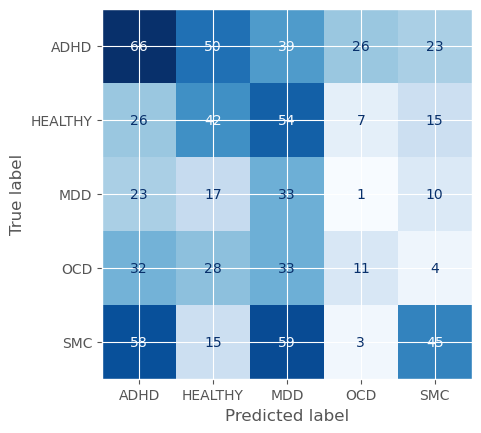

In [ ]:
# final eval on val data for the best model during tuning
# get best model
best_model_path = trial.user_attrs["best_model_path"]
print(trial.params)
learning_rate = trial.params['learning_rate']
optimizer_name = trial.params['optimizer']
dropout = trial.params['dropout']
fc_layers = trial.params['fc_layers']
# Load the model directly from the checkpoint
model = graphLambda_w_edge_attr.load_from_checkpoint(best_model_path, learning_rate=learning_rate, optimizer_name=optimizer_name, dropout=dropout, fc_layers=fc_layers)

print(model.hparams)

val_loader = DataLoader(X_val, batch_size=len(X_val), shuffle=False,
                            drop_last=True)

trainer = Trainer(accelerator='gpu', devices=1, enable_progress_bar=False, enable_model_summary=False, logger=False, enable_checkpointing=False)
trainer.validate(model, val_loader)

# compute confusion matrix and classification report with sklearn of best model checkpoint
from sklearn.metrics import f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
y_pred = trainer.predict(model, val_loader)
y_pred = np.concatenate(y_pred).flatten()
y = Y_val

class_labels = le.inverse_transform(sorted(np.unique(y)))
print('classification report:\n', classification_report(y, y_pred, target_names=class_labels))
print('F1-score:', f1_score(y, y_pred, average="macro"))
cm = confusion_matrix(y, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False)
plt.grid(False)


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          val_f1           │    0.27934956550598145    │
│         val_loss          │     4.282884120941162     │
└───────────────────────────┴───────────────────────────┘

classification report:
               precision    recall  f1-score   support

        ADHD       0.37      0.28      0.32       108
     HEALTHY       0.19      0.12      0.15       108
         MDD       0.28      0.11      0.16       108
         OCD       0.19      0.26      0.22       108
         SMC       0.43      0.79      0.56       108

    accuracy                           0.31       540
   macro avg       0.29      0.31      0.28       540
weighted avg       0.29      0.31      0.28       540

F1-score:
 0.2793495516837846


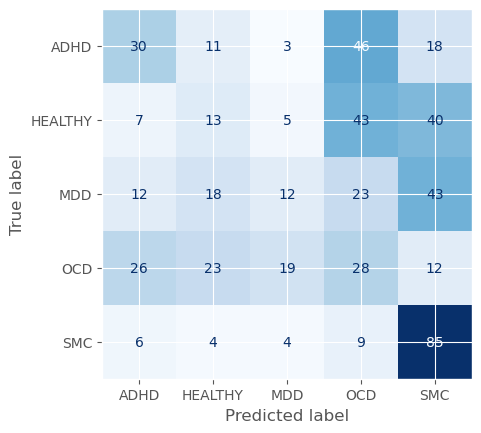

In [ ]:
# final eval on test data for the best model during tuning

test_loader = DataLoader(X_test, batch_size=len(X_test), shuffle=False,
                            drop_last=True)

trainer = Trainer(accelerator='gpu', devices=1, enable_progress_bar=False, enable_model_summary=False, logger=False, enable_checkpointing=False)
trainer.validate(model, test_loader)

# compute confusion matrix and classification report with sklearn of best model checkpoint
from sklearn.metrics import f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
y_pred = trainer.predict(model, test_loader)
y_pred = np.concatenate(y_pred).flatten()
y = Y_test

class_labels = le.inverse_transform(sorted(np.unique(y)))
print('classification report:\n', classification_report(y, y_pred, target_names=class_labels))
print('F1-score:\n', f1_score(y, y_pred, average="macro"))
cm = confusion_matrix(y, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False)
plt.grid(False)


In [ ]:
df_trials = pd.read_pickle('eo_results_w_edge_attrs_trials.pkl')
df_trials.sort_values('value', ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_fc_layers,params_learning_rate,params_optimizer,user_attrs_best_model_path,state
2,2,0.239475,2024-06-25 17:54:06.052710,2024-06-25 17:54:09.975839,0 days 00:00:03.923129,510,0.393836,1,0.000015,Adam,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE
0,0,0.089896,2024-06-25 17:53:57.741149,2024-06-25 17:54:02.390378,0 days 00:00:04.649229,680,0.214009,8,0.000344,RMSprop,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE
1,1,0.088312,2024-06-25 17:54:02.392379,2024-06-25 17:54:06.051708,0 days 00:00:03.659329,510,0.644291,3,0.026079,Adam,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE


#### Visualizations

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1755039964.py:2: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

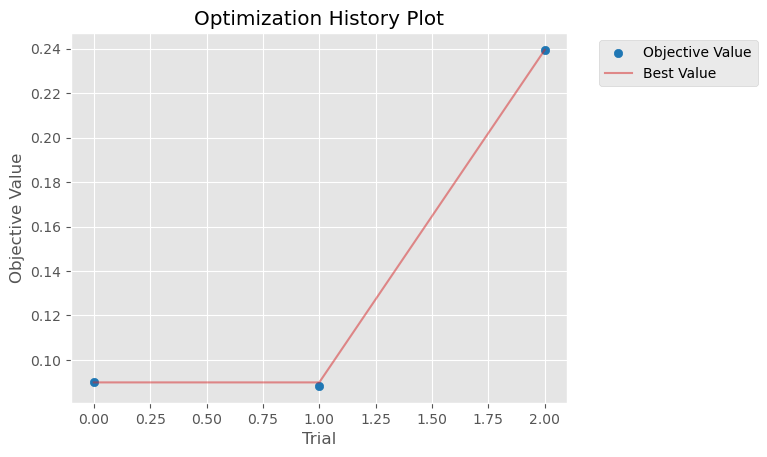

In [ ]:
# Visualize the optimization history
plot_optimization_history(study)

[I 2024-06-25 17:54:11,799] A new study created in memory with name: no-name-9a3f03e6-cb85-4cd8-abac-b7419759e6c0
C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\3414932042.py:7: ExperimentalWarning: plot_intermediate_values is experimental (supported from v2.2.0). The interface can change in the future.
  plot_intermediate_values(plotted_study)


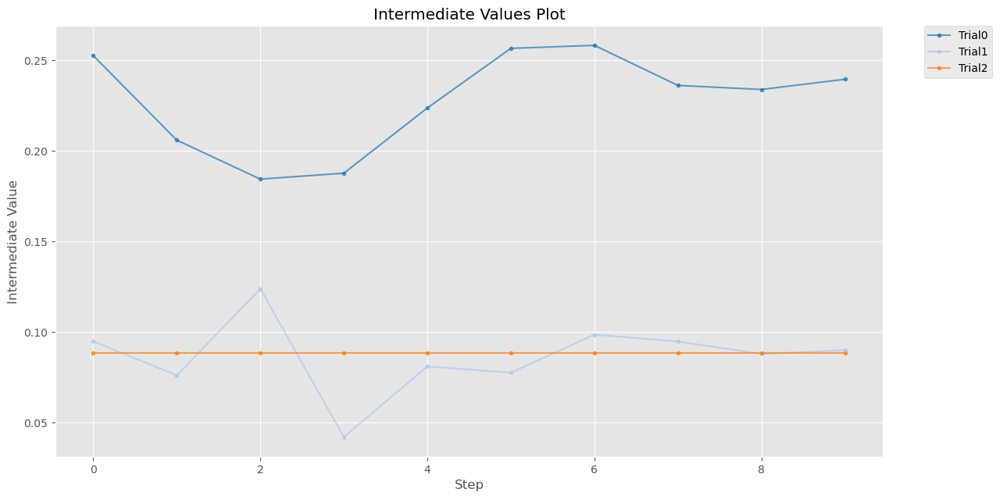

In [ ]:
# Visualize the learning curves of the best 10 trials
trials = study.trials
plotted_trials = sorted(trials, key=lambda t: t.value, reverse=True)[:10]
plotted_study = optuna.create_study()
for trial in plotted_trials:
    plotted_study.add_trial(trial)
plot_intermediate_values(plotted_study)
set_size(10, 5)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\2919792376.py:2: ExperimentalWarning: plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  plot_parallel_coordinate(study)


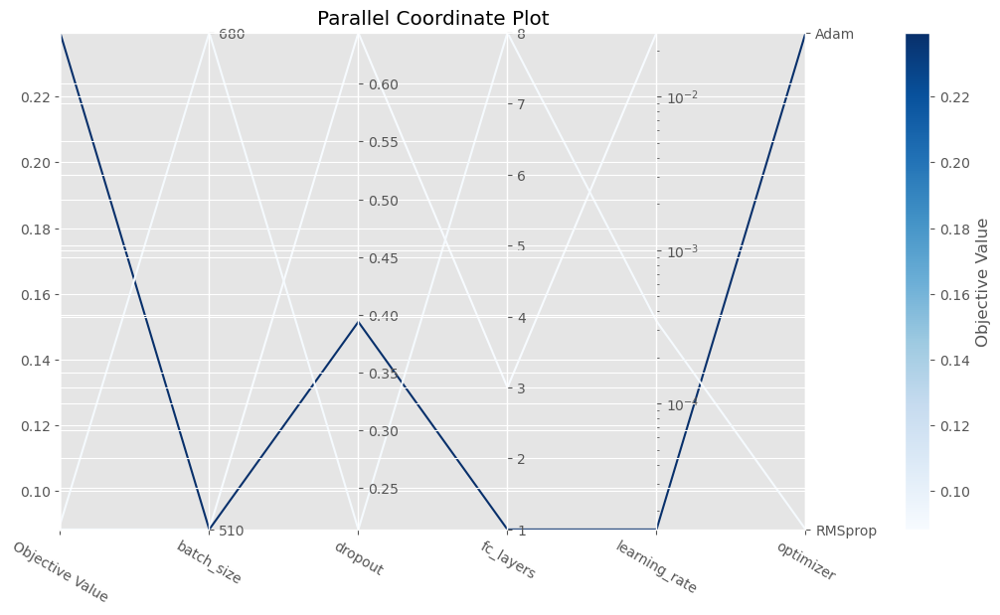

In [ ]:
# Visualize high-dimensional parameter relationships.
plot_parallel_coordinate(study)
set_size(10, 5)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\624402143.py:2: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  plot_contour(study)
[W 2024-06-25 17:54:13,361] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.


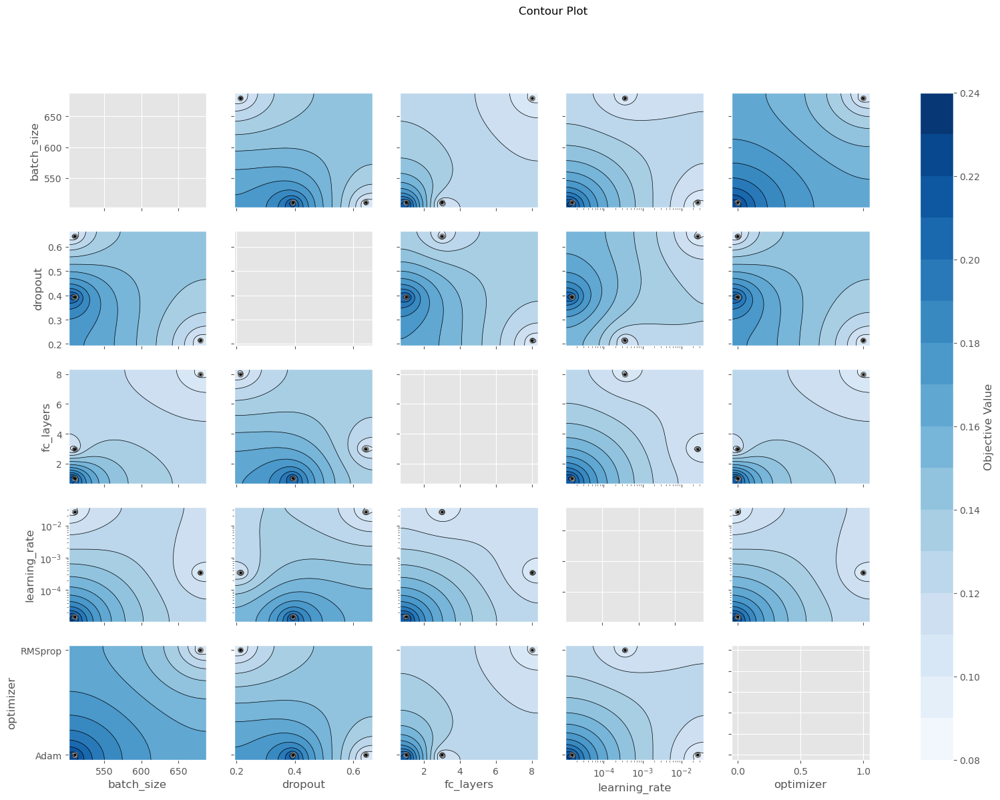

In [ ]:
# Visualize hyperparameter relationships
plot_contour(study)
set_size(15, 10)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1888575690.py:2: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  plot_slice(study)


array([<Axes: xlabel='batch_size', ylabel='Objective Value'>,
       <Axes: xlabel='dropout'>, <Axes: xlabel='fc_layers'>,
       <Axes: xlabel='learning_rate'>, <Axes: xlabel='optimizer'>],
      dtype=object)

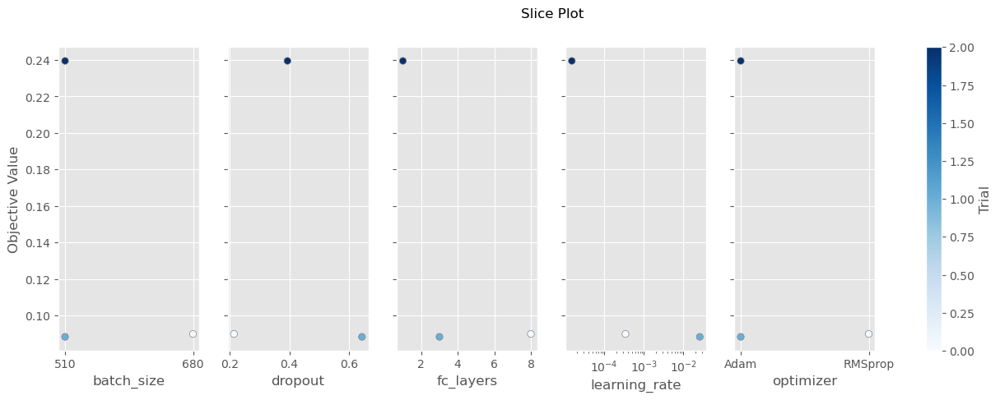

In [ ]:
# Visualize individual hyperparameters as slice plot
plot_slice(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1473508994.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

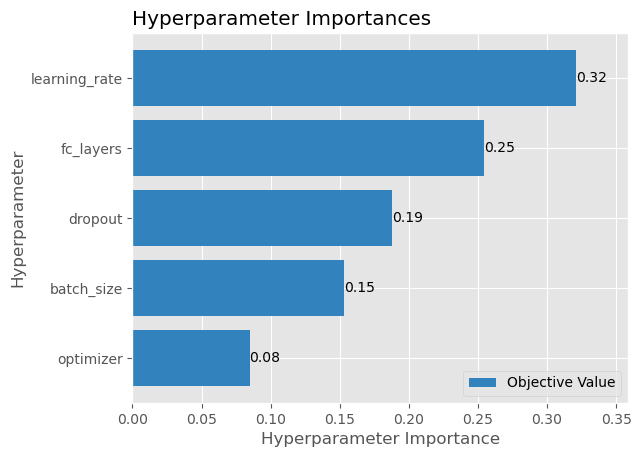

In [ ]:
# Visualize parameter importances.
plot_param_importances(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\3113371256.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

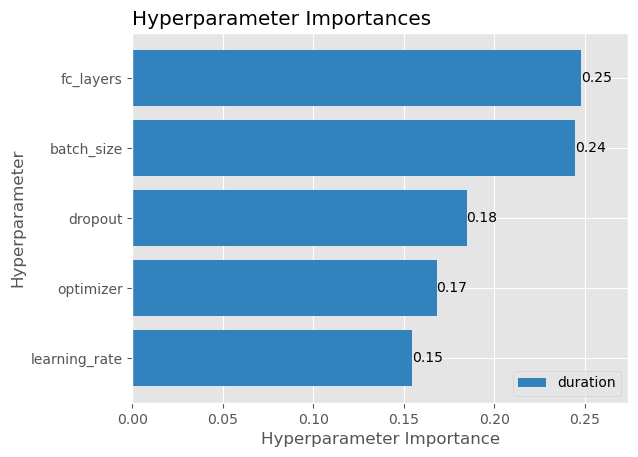

In [ ]:
# Learn which hyperparameters are affecting the trial duration with hyperparameter importance.
plot_param_importances(
    study, target=lambda t: t.duration.total_seconds(), target_name="duration"
)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1828777839.py:2: ExperimentalWarning: plot_edf is experimental (supported from v2.2.0). The interface can change in the future.
  plot_edf(study)


<Axes: title={'center': 'Empirical Distribution Function Plot'}, xlabel='Objective Value', ylabel='Cumulative Probability'>

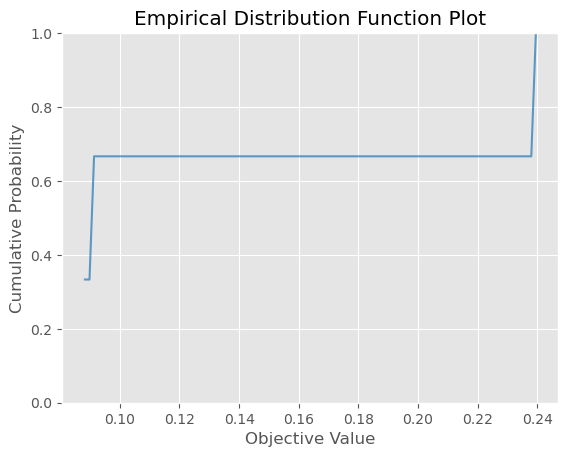

In [ ]:
# Visualize empirical distribution function.
plot_edf(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1172520691.py:2: ExperimentalWarning: plot_rank is experimental (supported from v3.2.0). The interface can change in the future.
  plot_rank(study)
[W 2024-06-25 17:54:24,204] Output figures of this Matplotlib-based `plot_rank` function would be different from those of the Plotly-based `plot_rank`.


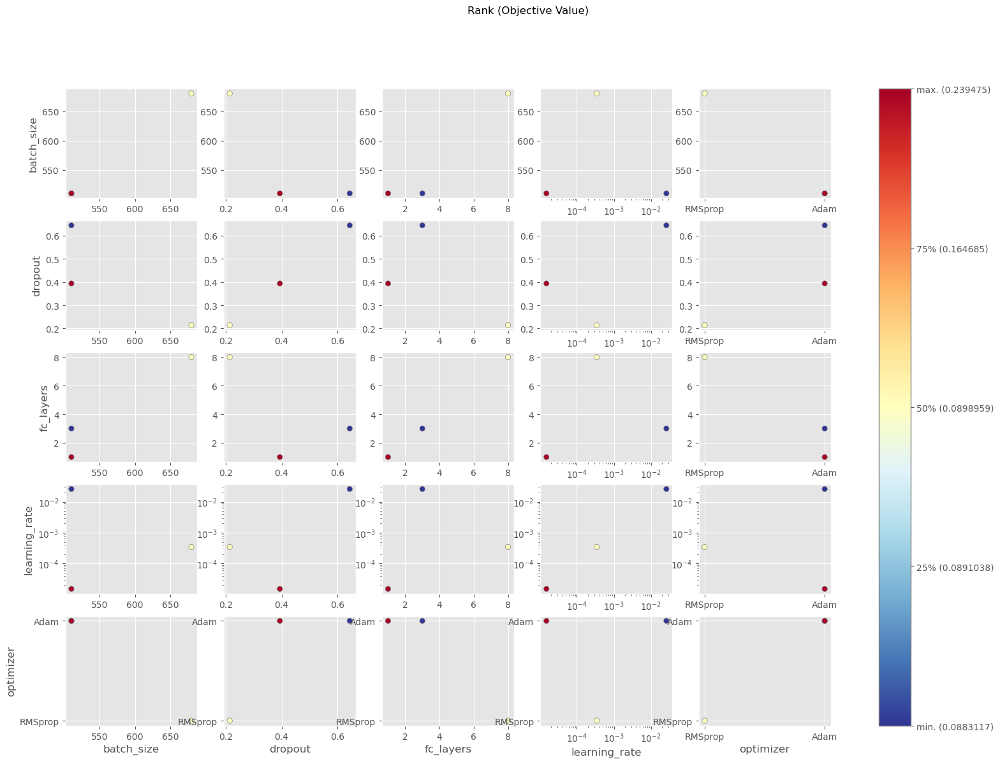

In [ ]:
# Visualize parameter relations with scatter plots colored by objective values.
plot_rank(study)
set_size(15, 10)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\124343896.py:2: ExperimentalWarning: plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.
  plot_timeline(study)


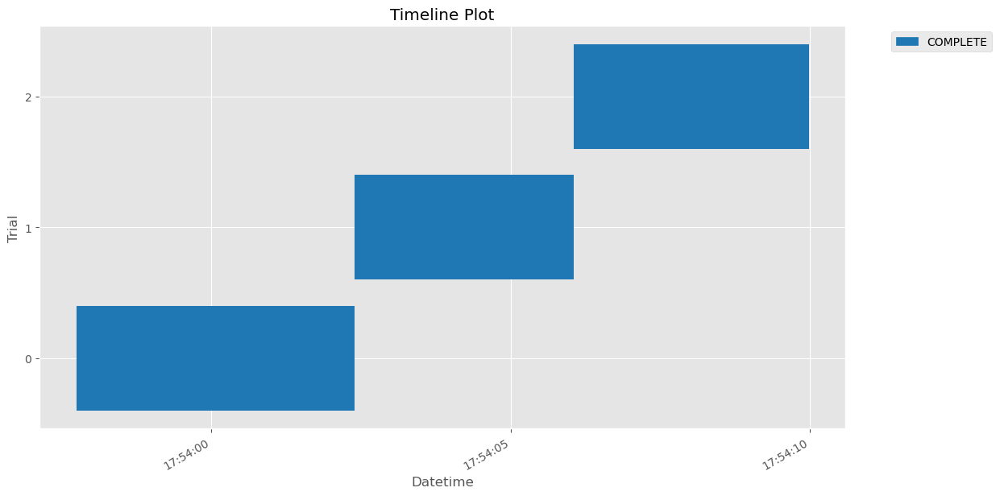

In [ ]:
# Visualize the optimization timeline of performed trials.
plot_timeline(study)
set_size(10, 5)

# 3. ratio feature set

In [ ]:
# split the data into train, validation and test sets, using the same split as one of the baseline models using nested cross-validation
baseline_train_idxs = data_split_indices['ratio'][0]
baseline_val_idxs = data_split_indices['ratio'][1]
baseline_test_idxs = data_split_indices['ratio'][2]

# first splitting validation data using the first split from the baseline RF model
groups = [elem for elem in subjects_ratio_ids for i in range(12)] # times 12 for each epoch

print(f'{len(ratio_graph_dataset) = }')
print(f'{len(baseline_train_idxs) = }, {len(baseline_val_idxs) = }, {len(baseline_test_idxs) = } total: {len(baseline_train_idxs)+len(baseline_val_idxs)+len(baseline_test_idxs)}')

X_train = [ratio_graph_dataset[i] for i in baseline_train_idxs] 
X_val = [ratio_graph_dataset[i] for i in baseline_val_idxs]
X_test = [ratio_graph_dataset[i] for i in baseline_test_idxs]
Y_train =[ratio_y_list[i] for i in baseline_train_idxs]
Y_val = [ratio_y_list[i] for i in baseline_val_idxs]
Y_test = [ratio_y_list[i] for i in baseline_test_idxs]
groups_train = [groups[i] for i in baseline_train_idxs]
groups_val = [groups[i] for i in baseline_val_idxs]
groups_test = [groups[i] for i in baseline_test_idxs]

len(ratio_graph_dataset) = 2688
len(baseline_train_idxs) = 1428, len(baseline_val_idxs) = 720, len(baseline_test_idxs) = 540 total: 2688


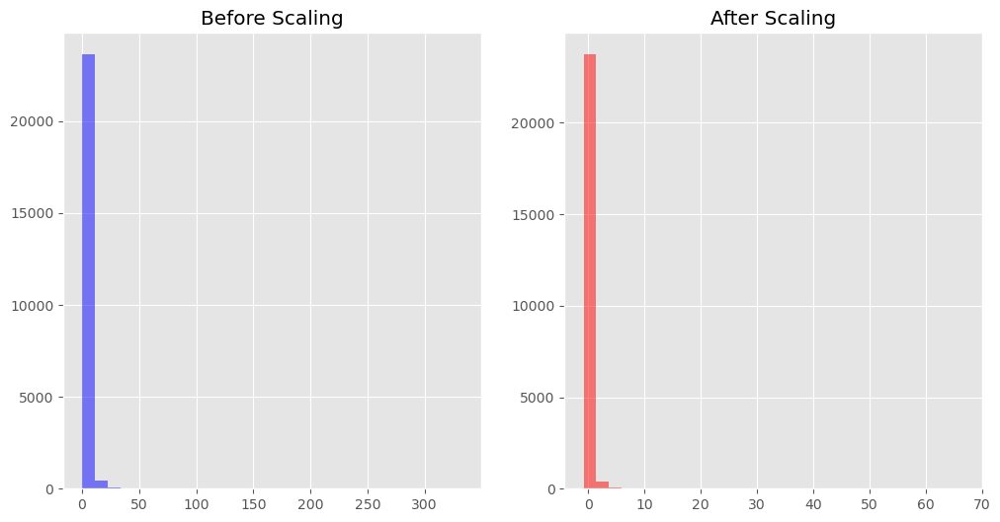

In [ ]:
# standardize statistical node features
from sklearn.preprocessing import StandardScaler

# Concatenate all x values before scaling for the first feature, as a sanity check for standardization
x_before = np.concatenate([data.x.numpy()[:, 0] for data in X_train + X_val + X_test])

scaler = StandardScaler()
scaler.fit(np.vstack([data.x.numpy() for data in X_train + X_val])) # fit on training and validation data


# Transform the x values of the data in X_train
for data in X_train:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Transform the x values of the data in X_val
for data in X_val:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Transform the x values of the data in X_test
for data in X_test:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Concatenate all x values after scaling for the first feature, as a sanity check for standardization
x_after = np.concatenate([data.x.numpy()[:, 0] for data in X_train + X_val + X_test])

# Plot the distribution of the first x feature before and after scaling as a sanity check
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(x_before, bins=30, color='b', alpha=0.5)
plt.title('Before Scaling')

plt.subplot(1, 2, 2)
plt.hist(x_after, bins=30, color='r', alpha=0.5)
plt.title('After Scaling')

plt.show()

### Model: standard GCN

In [ ]:
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import RichProgressBar
import logging
import warnings

warnings.filterwarnings("ignore", ".*Consider increasing the value of the `num_workers` argument*")
warnings.filterwarnings("ignore", "Trying to infer the `batch_size` from an ambiguous collection.*")
torch.set_float32_matmul_precision('high')
logging.getLogger("lightning.pytorch.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

def objective(trial):
    # Suggest values for the hyperparameters
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    batch_size = trial.suggest_categorical('batch_size', [170, 340, 510, 680, 850])
    dropout = trial.suggest_float('dropout', 0, 0.8)
    edge_threshold = trial.suggest_float('edge_threshold', 0.5, 0.9)
    hyperparameters = dict(learning_rate=learning_rate, optimizer_name=optimizer_name,
                           batch_size=batch_size, dropout=dropout,
                           edge_threshold=edge_threshold)
    print(f'Tested parameters: {hyperparameters}')
    n_epochs = batch_size * 4 # vary training epochs based on batch size

    # Create a copy of the dataset, for this specific trial
    X_train_trial = [data.clone() for data in X_train]
    X_val_trial = [data.clone() for data in X_val]
    X_test_trial = [data.clone() for data in X_test]
    
    # Only include edges with a synchrony value above the threshold in any of the five frequency bands
    for data in X_train_trial:
        data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
    for data in X_val_trial:
        data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
    for data in X_test_trial:
        data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)

    # Create the model
    model = GCN(learning_rate=learning_rate, optimizer_name=optimizer_name, dropout=dropout)

    
    # Create checkpoint callback
    checkpoint_callback = ModelCheckpoint(monitor='val_f1',
                                        mode='max',
                                        save_top_k=3,
                                        filename='{epoch}-{train_loss:.2f}-{train_f1:.2f}-{val_loss:.2f}-{val_f1:.2f}',
                                        )

    # Create the PyTorch Lightning trainer
    trainer = Trainer(
        accelerator='gpu',
        devices=1,
        max_epochs=n_epochs,
        callbacks=[PyTorchLightningPruningCallback(trial, monitor="val_f1"), checkpoint_callback],
        enable_progress_bar=False,
        enable_model_summary=False,
        logger=True,
        enable_checkpointing=True,
    )

    # Define the data loaders
    train_loader = DataLoader(X_train_trial, batch_size=batch_size, shuffle=True,
                              drop_last=True) # , num_workers=0, persistent_workers=True
    val_loader = DataLoader(X_val_trial, batch_size=len(X_val), shuffle=False,
                            drop_last=True) # , num_workers=0, persistent_workers=True

    # Log the hyperparameters
    trainer.logger.log_hyperparams(hyperparameters)

    # Train the model
    trainer.fit(model, train_loader, val_loader)

    # Evaluate the model
    val_f1 = trainer.callback_metrics["val_f1"].item()

    # After training, store the best model path in the trial's user attributes
    trial.set_user_attr("best_model_path", checkpoint_callback.best_model_path)

    return val_f1

study = optuna.create_study(direction='maximize', pruner=optuna.pruners.MedianPruner(n_warmup_steps=100))
study.optimize(objective, n_trials=100)

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

df = study.trials_dataframe()
df.to_pickle('ratio_results_stand_GCN_trials.pkl')

[I 2024-06-25 17:54:30,022] A new study created in memory with name: no-name-4faa6bb0-1d01-4800-8a91-0b0934324111


Tested parameters: {'learning_rate': 0.07616202696141404, 'optimizer_name': 'SGD', 'batch_size': 340, 'dropout': 0.7508719815415249, 'edge_threshold': 0.8568346458402252}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:298: The number of training batches (4) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
`Trainer.fit` stopped: `max_epochs=10` reached.
[I 2024-06-25 17:54:32,440] Trial 0 finished with value: 0.14106717705726624 and parameters: {'learning_rate': 0.07616202696141404, 'optimizer': 'SGD', 'batch_size': 340, 'dropout': 0.7508719815415249, 'edge_threshold': 0.8568346458402252}. Best is trial 0 with value: 0.14106717705726624.


Tested parameters: {'learning_rate': 0.000958167318409604, 'optimizer_name': 'SGD', 'batch_size': 340, 'dropout': 0.3060190305768762, 'edge_threshold': 0.7137295393691929}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
`Trainer.fit` stopped: `max_epochs=10` reached.
[I 2024-06-25 17:54:35,746] Trial 1 finished with value: 0.09908115118741989 and parameters: {'learning_rate': 0.000958167318409604, 'optimizer': 'SGD', 'batch_size': 340, 'dropout': 0.3060190305768762, 'edge_threshold': 0.7137295393691929}. Best is trial 0 with value: 0.14106717705726624.


Tested parameters: {'learning_rate': 0.027096108781093194, 'optimizer_name': 'SGD', 'batch_size': 340, 'dropout': 0.3454006521625657, 'edge_threshold': 0.7844521986567927}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
`Trainer.fit` stopped: `max_epochs=10` reached.
[I 2024-06-25 17:54:38,257] Trial 2 finished with value: 0.16270887851715088 and parameters: {'learning_rate': 0.027096108781093194, 'optimizer': 'SGD', 'batch_size': 340, 'dropout': 0.3454006521625657, 'edge_threshold': 0.7844521986567927}. Best is trial 2 with value: 0.16270887851715088.


Best trial:
  Value: 0.16270887851715088
  Params: 
    learning_rate: 0.027096108781093194
    optimizer: SGD
    batch_size: 340
    dropout: 0.3454006521625657
    edge_threshold: 0.7844521986567927


In [ ]:
# print the best model path for later tensorboard visualization
print(f'Best model path: {trial.user_attrs["best_model_path"]}')

Best model path: d:\Documents\RU\Master_Neurobiology\Internship_jaar_2\Project\Notebooks\lightning_logs\version_35\checkpoints\epoch=9-train_loss=1.58-train_f1=0.19-val_loss=1.60-val_f1=0.16.ckpt


{'learning_rate': 0.027096108781093194, 'optimizer': 'SGD', 'batch_size': 340, 'dropout': 0.3454006521625657, 'edge_threshold': 0.7844521986567927}



GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          val_f1           │    0.16270887851715088    │
│         val_loss          │    1.6044278144836426     │
└───────────────────────────┴───────────────────────────┘

c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


classification report:
               precision    recall  f1-score   support

        ADHD       0.00      0.00      0.00       132
     HEALTHY       0.25      0.56      0.35       144
         MDD       0.22      0.38      0.28       168
         OCD       0.00      0.00      0.00        96
         SMC       0.25      0.15      0.19       180

    accuracy                           0.24       720
   macro avg       0.14      0.22      0.16       720
weighted avg       0.16      0.24      0.18       720

F1-score: 0.16270888008514003


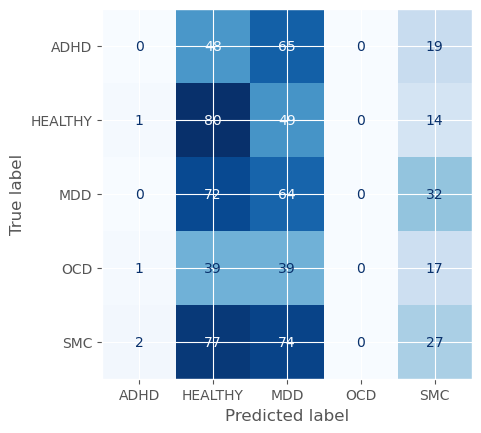

In [ ]:
# final eval on val data for the best model during tuning
# get best model
best_model_path = trial.user_attrs["best_model_path"]
print(trial.params)
learning_rate = trial.params['learning_rate']
optimizer_name = trial.params['optimizer']
dropout = trial.params['dropout']
edge_threshold = trial.params['edge_threshold']
# Load the model directly from the checkpoint
model = GCN.load_from_checkpoint(best_model_path, learning_rate=learning_rate, optimizer_name=optimizer_name, dropout=dropout)

print(model.hparams)
X_val_best_trial = [data.clone() for data in X_val]
for data in X_val_best_trial:
    data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)

val_loader = DataLoader(X_val_best_trial, batch_size=len(X_val), shuffle=False,
                            drop_last=True)

trainer = Trainer(accelerator='gpu', devices=1, enable_progress_bar=False, enable_model_summary=False, logger=False, enable_checkpointing=False)
trainer.validate(model, val_loader)

# compute confusion matrix and classification report with sklearn of best model checkpoint
from sklearn.metrics import f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
y_pred = trainer.predict(model, val_loader)
y_pred = np.concatenate(y_pred).flatten()
y = Y_val

class_labels = le.inverse_transform(sorted(np.unique(y)))
print('classification report:\n', classification_report(y, y_pred, target_names=class_labels))
print('F1-score:', f1_score(y, y_pred, average="macro"))
cm = confusion_matrix(y, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False)
plt.grid(False)


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          val_f1           │    0.16761624813079834    │
│         val_loss          │    1.6120171546936035     │
└───────────────────────────┴───────────────────────────┘

classification report:
               precision    recall  f1-score   support

        ADHD       0.67      0.02      0.04       108
     HEALTHY       0.23      0.78      0.36       108
         MDD       0.23      0.16      0.19       108
         OCD       0.00      0.00      0.00       108
         SMC       0.26      0.25      0.25       108

    accuracy                           0.24       540
   macro avg       0.28      0.24      0.17       540
weighted avg       0.28      0.24      0.17       540

F1-score:
 0.1676162450881052


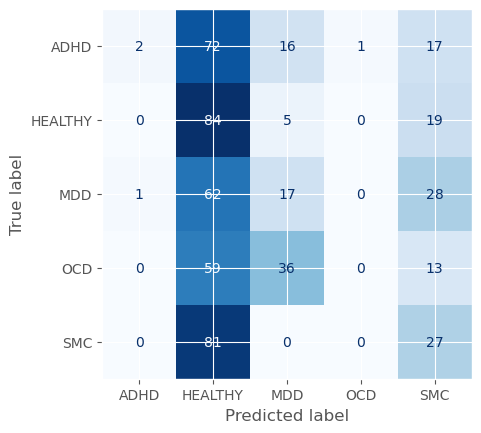

In [ ]:
# final eval on test data for the best model during tuning
X_test_best_trial = [data.clone() for data in X_test]
for data in X_test_best_trial:
    data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
test_loader = DataLoader(X_test_best_trial, batch_size=len(X_test), shuffle=False,
                            drop_last=True)

trainer = Trainer(accelerator='gpu', devices=1, enable_progress_bar=False, enable_model_summary=False, logger=False, enable_checkpointing=False)
trainer.validate(model, test_loader)

# compute confusion matrix and classification report with sklearn of best model checkpoint
from sklearn.metrics import f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
y_pred = trainer.predict(model, test_loader)
y_pred = np.concatenate(y_pred).flatten()
y = Y_test

class_labels = le.inverse_transform(sorted(np.unique(y)))
print('classification report:\n', classification_report(y, y_pred, target_names=class_labels))
print('F1-score:\n', f1_score(y, y_pred, average="macro"))
cm = confusion_matrix(y, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False)
plt.grid(False)


In [ ]:
df_trials = pd.read_pickle('ratio_results_stand_GCN_trials.pkl')
df_trials.sort_values('value', ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_edge_threshold,params_learning_rate,params_optimizer,user_attrs_best_model_path,state
2,2,0.162709,2024-06-25 17:54:35.747811,2024-06-25 17:54:38.257102,0 days 00:00:02.509291,340,0.345401,0.784452,0.027096,SGD,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE
0,0,0.141067,2024-06-25 17:54:30.023605,2024-06-25 17:54:32.440801,0 days 00:00:02.417196,340,0.750872,0.856835,0.076162,SGD,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE
1,1,0.099081,2024-06-25 17:54:32.441802,2024-06-25 17:54:35.745807,0 days 00:00:03.304005,340,0.306019,0.713730,0.000958,SGD,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE


#### Visualizations

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1755039964.py:2: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

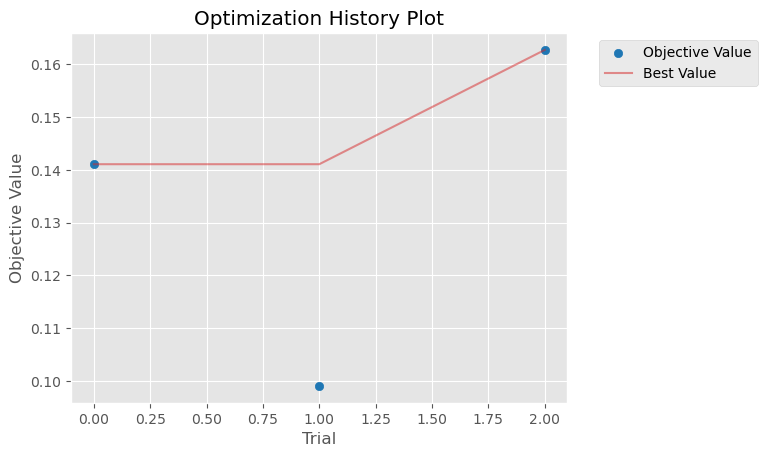

In [ ]:
# Visualize the optimization history
plot_optimization_history(study)

[I 2024-06-25 17:54:40,307] A new study created in memory with name: no-name-9728221c-8e6f-4e4c-8d21-0d2438d9600e
C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\3414932042.py:7: ExperimentalWarning: plot_intermediate_values is experimental (supported from v2.2.0). The interface can change in the future.
  plot_intermediate_values(plotted_study)


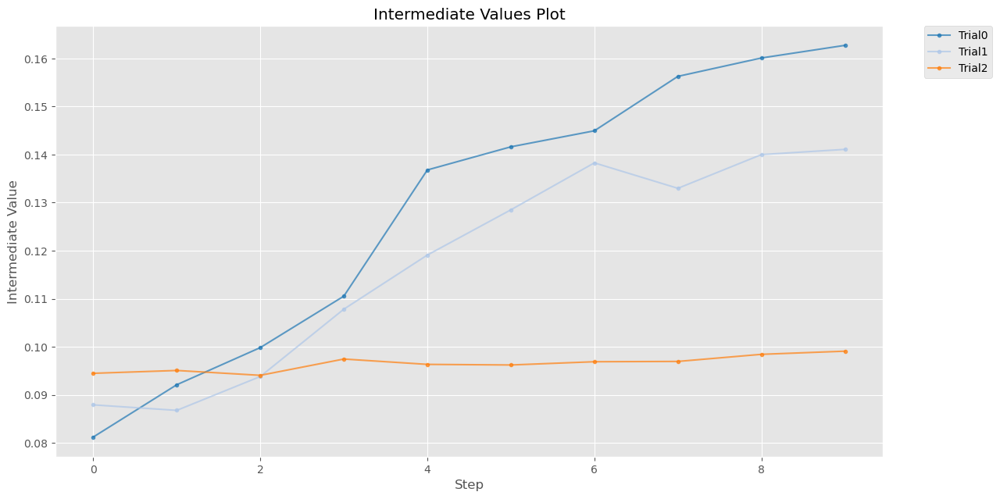

In [ ]:
# Visualize the learning curves of the best 10 trials
trials = study.trials
plotted_trials = sorted(trials, key=lambda t: t.value, reverse=True)[:10]
plotted_study = optuna.create_study()
for trial in plotted_trials:
    plotted_study.add_trial(trial)
plot_intermediate_values(plotted_study)
set_size(10, 5)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\2919792376.py:2: ExperimentalWarning: plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  plot_parallel_coordinate(study)
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\optuna\visualization\matplotlib\_parallel_coordinate.py:135: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax2.set_ylim(dim.range[0], dim.range[1])
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\optuna\visualization\matplotlib\_parallel_coordinate.py:135: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax2.set_ylim(dim.range[0], dim.range[1])


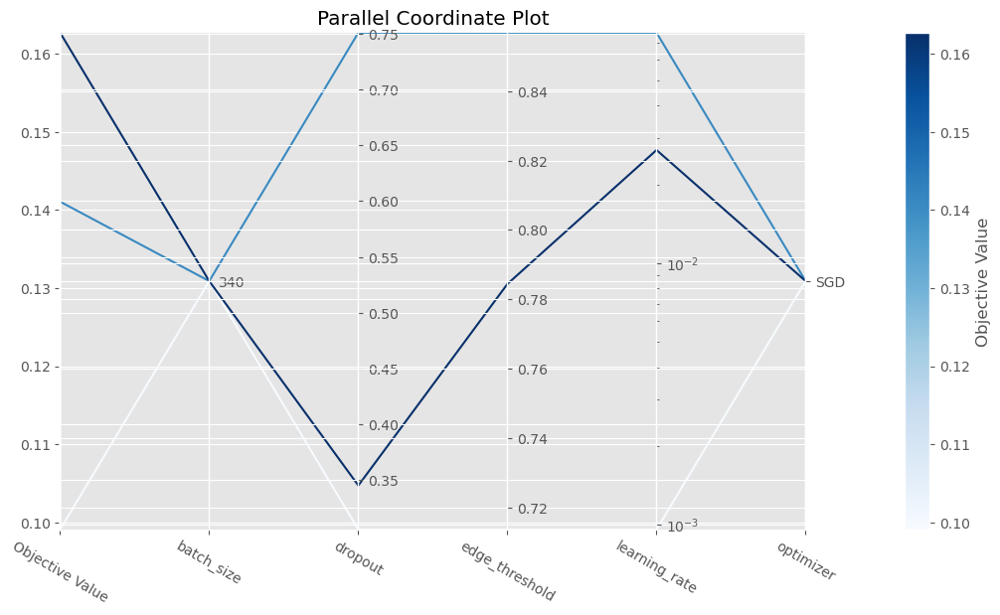

In [ ]:
# Visualize high-dimensional parameter relationships.
plot_parallel_coordinate(study)
set_size(10, 5)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\624402143.py:2: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  plot_contour(study)
[W 2024-06-25 17:54:41,968] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.
[W 2024-06-25 17:54:41,969] Param batch_size unique value length is less than 2.
[W 2024-06-25 17:54:41,970] Param batch_size unique value length is less than 2.
[W 2024-06-25 17:54:41,971] Param batch_size unique value length is less than 2.
[W 2024-06-25 17:54:41,971] Param optimizer unique value length is less than 2.
[W 2024-06-25 17:54:41,972] Param batch_size unique value length is less than 2.
[W 2024-06-25 17:54:41,973] Param optimizer unique value length is less than 2.
[W 2024-06-25 17:54:41,974] Param batch_size unique value length is less than 2.
[W 2024-06-25 17:54:41,975] Param optimizer unique value length is less than

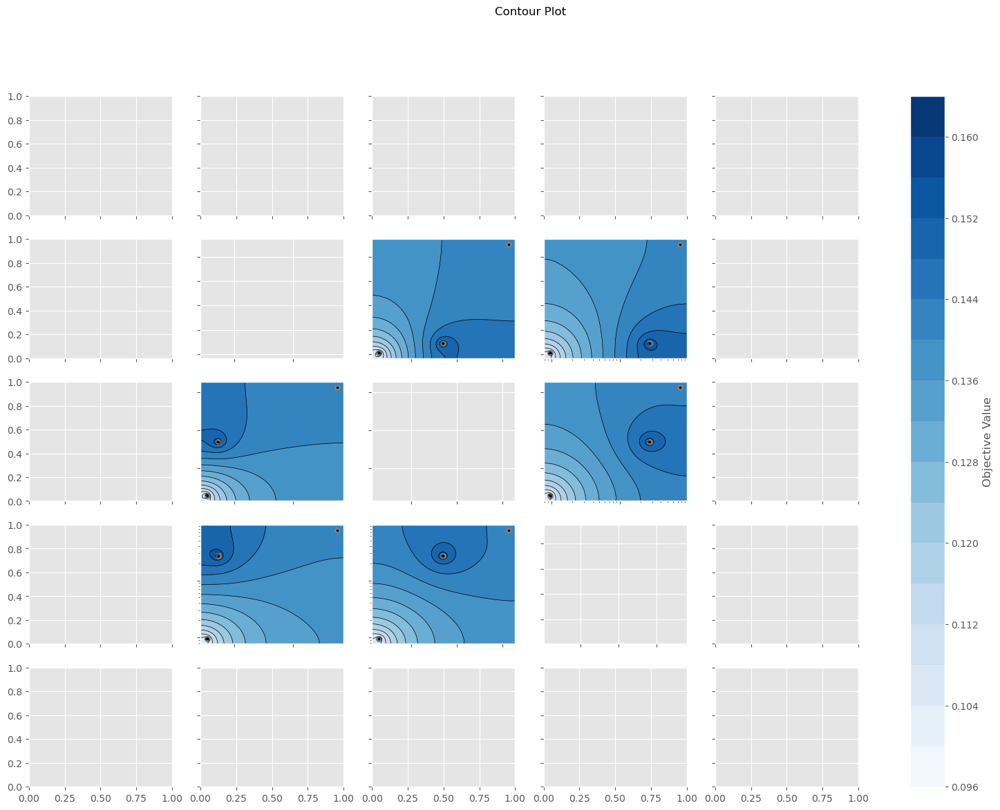

In [ ]:
# Visualize hyperparameter relationships
plot_contour(study)
set_size(15, 10)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1888575690.py:2: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  plot_slice(study)
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\optuna\visualization\matplotlib\_slice.py:162: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(xlim[0], xlim[1])


array([<Axes: xlabel='batch_size', ylabel='Objective Value'>,
       <Axes: xlabel='dropout'>, <Axes: xlabel='edge_threshold'>,
       <Axes: xlabel='learning_rate'>, <Axes: xlabel='optimizer'>],
      dtype=object)

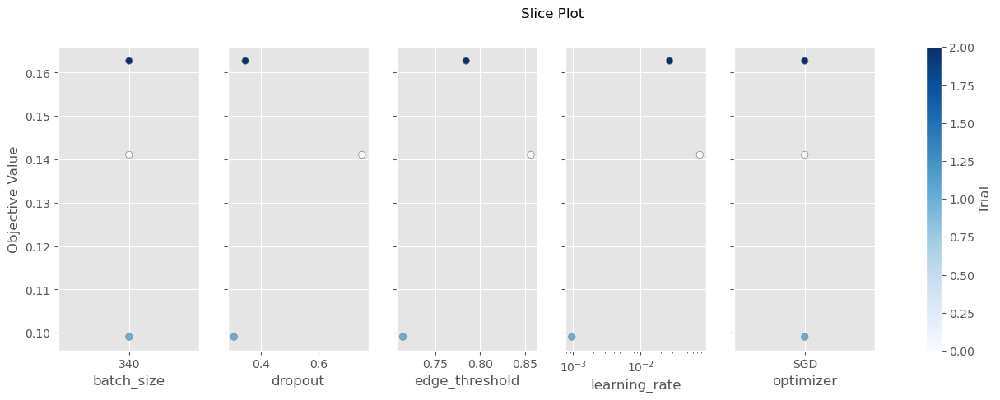

In [ ]:
# Visualize individual hyperparameters as slice plot
plot_slice(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1473508994.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

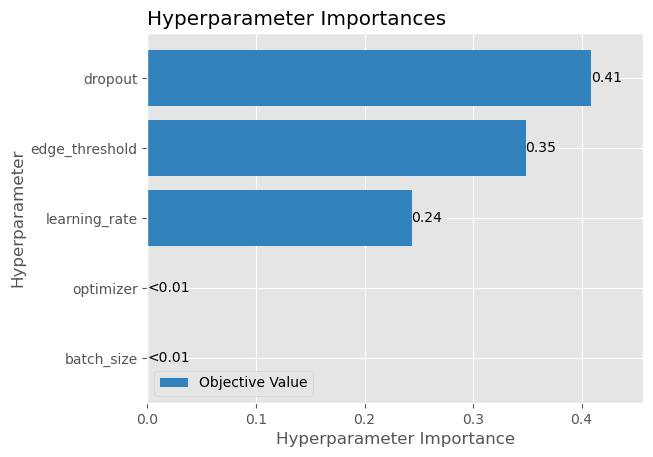

In [ ]:
# Visualize parameter importances.
plot_param_importances(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\3113371256.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

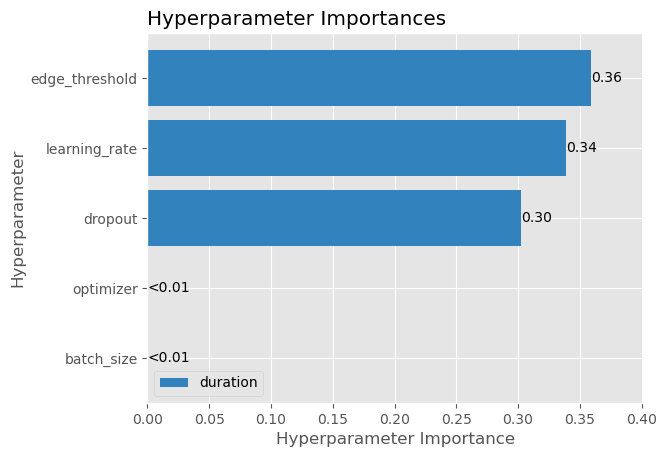

In [ ]:
# Learn which hyperparameters are affecting the trial duration with hyperparameter importance.
plot_param_importances(
    study, target=lambda t: t.duration.total_seconds(), target_name="duration"
)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1828777839.py:2: ExperimentalWarning: plot_edf is experimental (supported from v2.2.0). The interface can change in the future.
  plot_edf(study)


<Axes: title={'center': 'Empirical Distribution Function Plot'}, xlabel='Objective Value', ylabel='Cumulative Probability'>

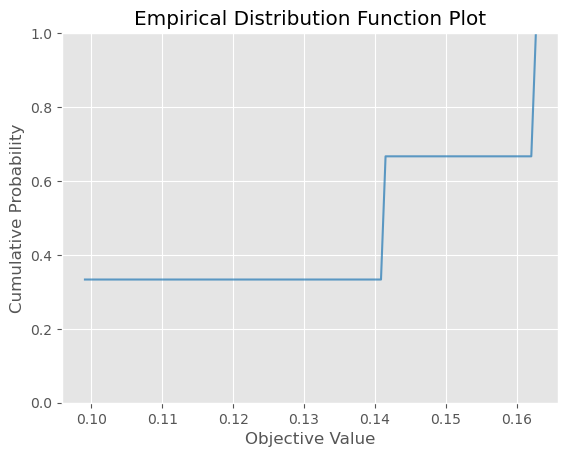

In [ ]:
# Visualize empirical distribution function.
plot_edf(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1172520691.py:2: ExperimentalWarning: plot_rank is experimental (supported from v3.2.0). The interface can change in the future.
  plot_rank(study)
[W 2024-06-25 17:54:49,139] Output figures of this Matplotlib-based `plot_rank` function would be different from those of the Plotly-based `plot_rank`.
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\optuna\visualization\matplotlib\_rank.py:153: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(info.xaxis.range[0], info.xaxis.range[1])
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\optuna\visualization\matplotlib\_rank.py:155: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(info.yaxis.range[0], info.yaxis.range[1])


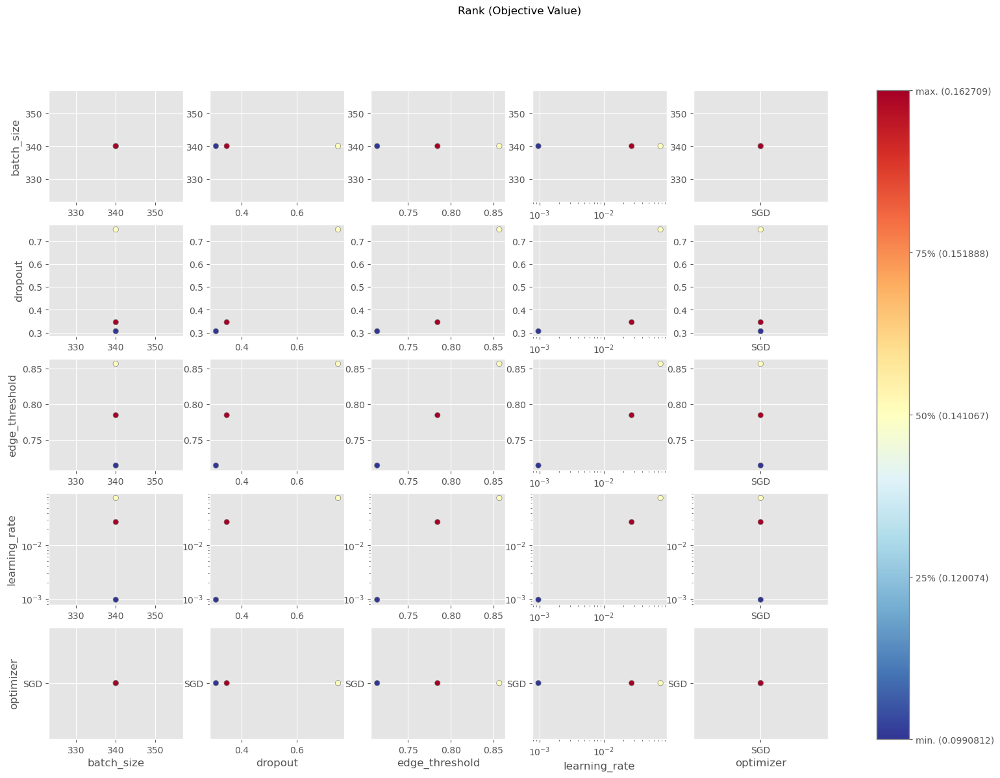

In [ ]:
# Visualize parameter relations with scatter plots colored by objective values.
plot_rank(study)
set_size(15, 10)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\124343896.py:2: ExperimentalWarning: plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.
  plot_timeline(study)


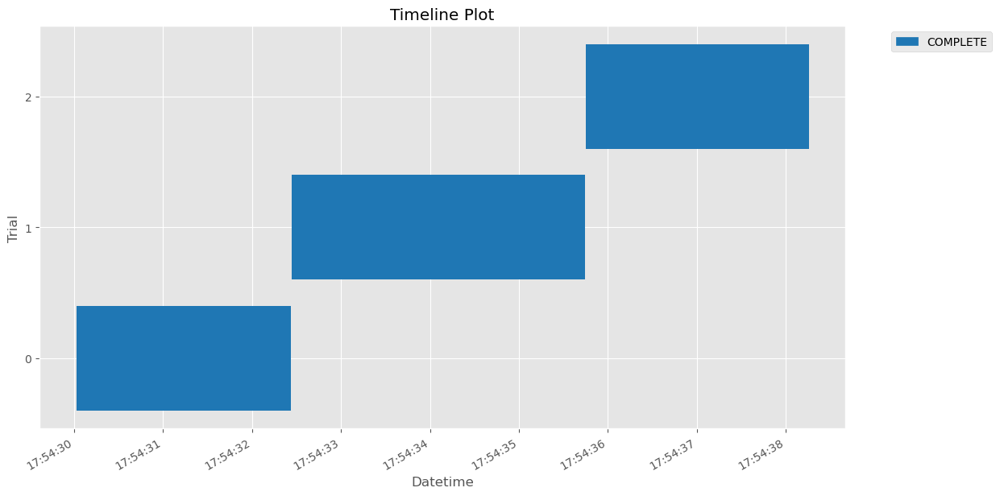

In [ ]:
# Visualize the optimization timeline of performed trials.
plot_timeline(study)
set_size(10, 5)

### Model: graphLambda without edge_attr

In [ ]:
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import RichProgressBar
import logging
import warnings

warnings.filterwarnings("ignore", ".*Consider increasing the value of the `num_workers` argument*")
warnings.filterwarnings("ignore", "Trying to infer the `batch_size` from an ambiguous collection.*")
torch.set_float32_matmul_precision('high')
logging.getLogger("lightning.pytorch.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

def objective(trial):
    # Suggest values for the hyperparameters
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    batch_size = trial.suggest_categorical('batch_size', [170, 340, 510, 680, 850])
    fc_layers = trial.suggest_int('fc_layers', 1, 8)
    dropout = trial.suggest_float('dropout', 0, 0.8)
    edge_threshold = trial.suggest_float('edge_threshold', 0.5, 0.9)
    hyperparameters = dict(learning_rate=learning_rate, optimizer_name=optimizer_name,
                           batch_size=batch_size, fc_layers=fc_layers, dropout=dropout,
                           edge_threshold=edge_threshold)
    print(f'Tested parameters: {hyperparameters}')
    n_epochs = batch_size * 4 # vary training epochs based on batch size

    # Create a copy of the dataset, for this specific trial
    X_train_trial = [data.clone() for data in X_train]
    X_val_trial = [data.clone() for data in X_val]
    X_test_trial = [data.clone() for data in X_test]
    
    # Only include edges with a synchrony value above the threshold in any of the five frequency bands
    for data in X_train_trial:
        data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
    for data in X_val_trial:
        data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
    for data in X_test_trial:
        data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)

    # Create the model
    model = graphLambda_wo_edge_attr(learning_rate=learning_rate, optimizer_name=optimizer_name, fc_layers=fc_layers, dropout=dropout)

    

    # Create checkpoint callback
    checkpoint_callback = ModelCheckpoint(monitor='val_f1',
                                        mode='max',
                                        save_top_k=3,
                                        filename='{epoch}-{train_loss:.2f}-{train_f1:.2f}-{val_loss:.2f}-{val_f1:.2f}',
                                        )

    # Create the PyTorch Lightning trainer
    trainer = Trainer(
        accelerator='gpu',
        devices=1,
        max_epochs=n_epochs,
        callbacks=[PyTorchLightningPruningCallback(trial, monitor="val_f1"), checkpoint_callback],
        enable_progress_bar=False,
        enable_model_summary=False,
        logger=True,
        enable_checkpointing=True,
    )

    # Define the data loaders
    train_loader = DataLoader(X_train_trial, batch_size=batch_size, shuffle=True,
                              drop_last=True) # , num_workers=0, persistent_workers=True
    val_loader = DataLoader(X_val_trial, batch_size=len(X_val), shuffle=False,
                            drop_last=True) # , num_workers=0, persistent_workers=True

    # Log the hyperparameters
    trainer.logger.log_hyperparams(hyperparameters)

    # Train the model
    trainer.fit(model, train_loader, val_loader)

    # Evaluate the model
    val_f1 = trainer.callback_metrics["val_f1"].item()

    # After training, store the best model path in the trial's user attributes
    trial.set_user_attr("best_model_path", checkpoint_callback.best_model_path)

    return val_f1

study = optuna.create_study(direction='maximize', pruner=optuna.pruners.ThresholdPruner(lower=0.1, n_warmup_steps=100))
study.optimize(objective, n_trials=100)

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

df = study.trials_dataframe()
df.to_pickle('ratio_results_wo_edge_attrs_trials.pkl')

[I 2024-06-25 17:54:54,753] A new study created in memory with name: no-name-ddcd7063-ccd5-4166-bfa4-a5282dc90d12


Tested parameters: {'learning_rate': 0.0010252105749239747, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 2, 'dropout': 0.21819872827452375, 'edge_threshold': 0.6584488150230386}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:298: The number of training batches (2) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
`Trainer.fit` stopped: `max_epochs=10` reached.
[I 2024-06-25 17:54:58,316] Trial 0 finished with value: 0.1517086625099182 and parameters: {'learning_rate': 0.0010252105749239747, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 2, 'dropout': 0.21819872827452375, 'edge_threshold': 0.6584488150230386}. Best is trial 0 with value: 0.1517086625099182.


Tested parameters: {'learning_rate': 0.0022422858168673855, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.5510725880071675, 'edge_threshold': 0.8911659380302995}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:298: The number of training batches (8) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
`Trainer.fit` stopped: `max_epochs=10` reached.
[I 2024-06-25 17:55:03,386] Trial 1 finished with value: 0.06197183579206467 and parameters: {'learning_rate': 0.0022422858168673855, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.5510725880071675, 'edge_threshold': 0.8911659380302995}. Best is trial 0 with value: 0.1517086625099182.


Tested parameters: {'learning_rate': 0.004657188807926022, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 1, 'dropout': 0.2410714034861795, 'edge_threshold': 0.699453682053421}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
`Trainer.fit` stopped: `max_epochs=10` reached.
[I 2024-06-25 17:55:06,727] Trial 2 finished with value: 0.16692371666431427 and parameters: {'learning_rate': 0.004657188807926022, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 1, 'dropout': 0.2410714034861795, 'edge_threshold': 0.699453682053421}. Best is trial 2 with value: 0.16692371666431427.


Best trial:
  Value: 0.16692371666431427
  Params: 
    learning_rate: 0.004657188807926022
    optimizer: Adam
    batch_size: 510
    fc_layers: 1
    dropout: 0.2410714034861795
    edge_threshold: 0.699453682053421


In [ ]:
# print the best model path for later tensorboard visualization
print(f'Best model path: {trial.user_attrs["best_model_path"]}')

Best model path: d:\Documents\RU\Master_Neurobiology\Internship_jaar_2\Project\Notebooks\lightning_logs\version_38\checkpoints\epoch=2-train_loss=4.36-train_f1=0.24-val_loss=8.74-val_f1=0.18.ckpt


{'learning_rate': 0.004657188807926022, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 1, 'dropout': 0.2410714034861795, 'edge_threshold': 0.699453682053421}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          val_f1           │    0.17751947045326233    │
│         val_loss          │     8.743102073669434     │
└───────────────────────────┴───────────────────────────┘

classification report:
               precision    recall  f1-score   support

        ADHD       0.28      0.22      0.25       132
     HEALTHY       0.11      0.03      0.04       144
         MDD       0.19      0.08      0.11       168
         OCD       0.14      0.48      0.22        96
         SMC       0.27      0.27      0.27       180

    accuracy                           0.20       720
   macro avg       0.20      0.22      0.18       720
weighted avg       0.20      0.20      0.18       720

F1-score: 0.17751947062508655


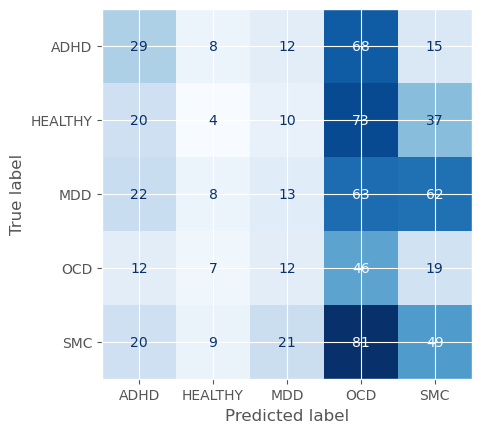

In [ ]:
# final eval on val data for the best model during tuning
# get best model
best_model_path = trial.user_attrs["best_model_path"]
print(trial.params)
learning_rate = trial.params['learning_rate']
optimizer_name = trial.params['optimizer']
dropout = trial.params['dropout']
fc_layers = trial.params['fc_layers']
edge_threshold = trial.params['edge_threshold']
# Load the model directly from the checkpoint
model = graphLambda_wo_edge_attr.load_from_checkpoint(best_model_path, learning_rate=learning_rate, optimizer_name=optimizer_name, dropout=dropout, fc_layers=fc_layers)

X_val_best_trial = [data.clone() for data in X_val]
for data in X_val_best_trial:
    data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
    
print(model.hparams)

val_loader = DataLoader(X_val_best_trial, batch_size=len(X_val), shuffle=False,
                            drop_last=True)

trainer = Trainer(accelerator='gpu', devices=1, enable_progress_bar=False, enable_model_summary=False, logger=False, enable_checkpointing=False)
trainer.validate(model, val_loader)

# compute confusion matrix and classification report with sklearn of best model checkpoint
from sklearn.metrics import f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
y_pred = trainer.predict(model, val_loader)
y_pred = np.concatenate(y_pred).flatten()
y = Y_val

class_labels = le.inverse_transform(sorted(np.unique(y)))
print('classification report:\n', classification_report(y, y_pred, target_names=class_labels))
print('F1-score:', f1_score(y, y_pred, average="macro"))
cm = confusion_matrix(y, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False)
plt.grid(False)


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          val_f1           │    0.24693003296852112    │
│         val_loss          │     19.92503547668457     │
└───────────────────────────┴───────────────────────────┘

classification report:
               precision    recall  f1-score   support

        ADHD       0.23      0.14      0.17       108
     HEALTHY       0.00      0.00      0.00       108
         MDD       0.62      0.12      0.20       108
         OCD       0.60      0.34      0.44       108
         SMC       0.27      0.97      0.42       108

    accuracy                           0.31       540
   macro avg       0.34      0.31      0.25       540
weighted avg       0.34      0.31      0.25       540

F1-score:
 0.24693004133386287


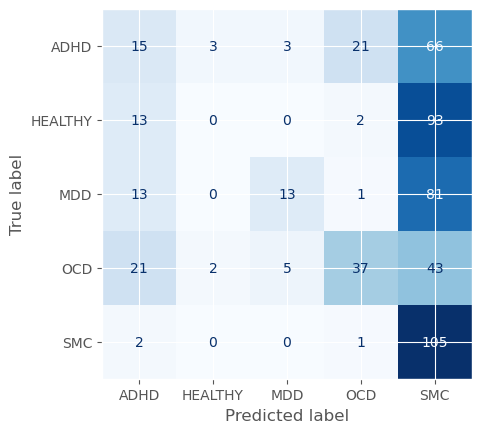

In [ ]:
# final eval on test data for the best model during tuning
X_test_best_trial = [data.clone() for data in X_test]
for data in X_test_best_trial:
    data.edge_index = filter_adjacency(data.edge_index, data.edge_attr, edge_threshold)
test_loader = DataLoader(X_test_best_trial, batch_size=len(X_test), shuffle=False,
                            drop_last=True)

trainer = Trainer(accelerator='gpu', devices=1, enable_progress_bar=False, enable_model_summary=False, logger=False, enable_checkpointing=False)
trainer.validate(model, test_loader)

# compute confusion matrix and classification report with sklearn of best model checkpoint
from sklearn.metrics import f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
y_pred = trainer.predict(model, test_loader)
y_pred = np.concatenate(y_pred).flatten()
y = Y_test

class_labels = le.inverse_transform(sorted(np.unique(y)))
print('classification report:\n', classification_report(y, y_pred, target_names=class_labels))
print('F1-score:\n', f1_score(y, y_pred, average="macro"))
cm = confusion_matrix(y, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False)
plt.grid(False)


In [ ]:
df_trials = pd.read_pickle('ratio_results_wo_edge_attrs_trials.pkl')
df_trials.sort_values('value', ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_edge_threshold,params_fc_layers,params_learning_rate,params_optimizer,user_attrs_best_model_path,state
2,2,0.166924,2024-06-25 17:55:03.386268,2024-06-25 17:55:06.727307,0 days 00:00:03.341039,510,0.241071,0.699454,1,0.004657,Adam,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE
0,0,0.151709,2024-06-25 17:54:54.754406,2024-06-25 17:54:58.315646,0 days 00:00:03.561240,680,0.218199,0.658449,2,0.001025,SGD,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE
1,1,0.061972,2024-06-25 17:54:58.317650,2024-06-25 17:55:03.385269,0 days 00:00:05.067619,170,0.551073,0.891166,6,0.002242,RMSprop,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE


#### Visualizations

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1755039964.py:2: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

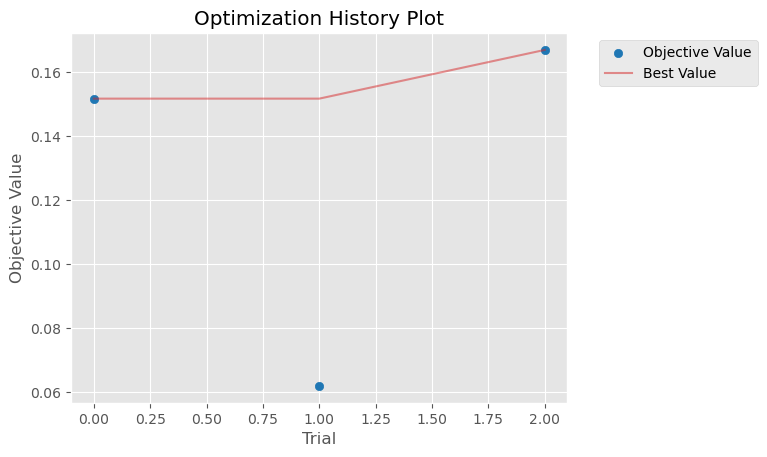

In [ ]:
# Visualize the optimization history
plot_optimization_history(study)

[I 2024-06-25 17:55:08,539] A new study created in memory with name: no-name-2392726f-efa1-459e-af62-8c1c4d26ce42
C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\3414932042.py:7: ExperimentalWarning: plot_intermediate_values is experimental (supported from v2.2.0). The interface can change in the future.
  plot_intermediate_values(plotted_study)


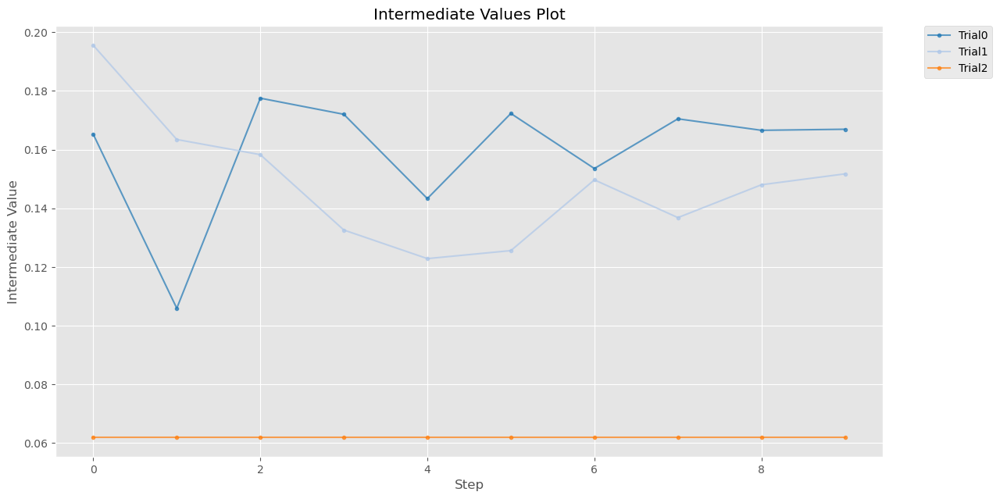

In [ ]:
# Visualize the learning curves of the best 10 trials
trials = study.trials
plotted_trials = sorted(trials, key=lambda t: t.value, reverse=True)[:10]
plotted_study = optuna.create_study()
for trial in plotted_trials:
    plotted_study.add_trial(trial)
plot_intermediate_values(plotted_study)
set_size(10, 5)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\2919792376.py:2: ExperimentalWarning: plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  plot_parallel_coordinate(study)


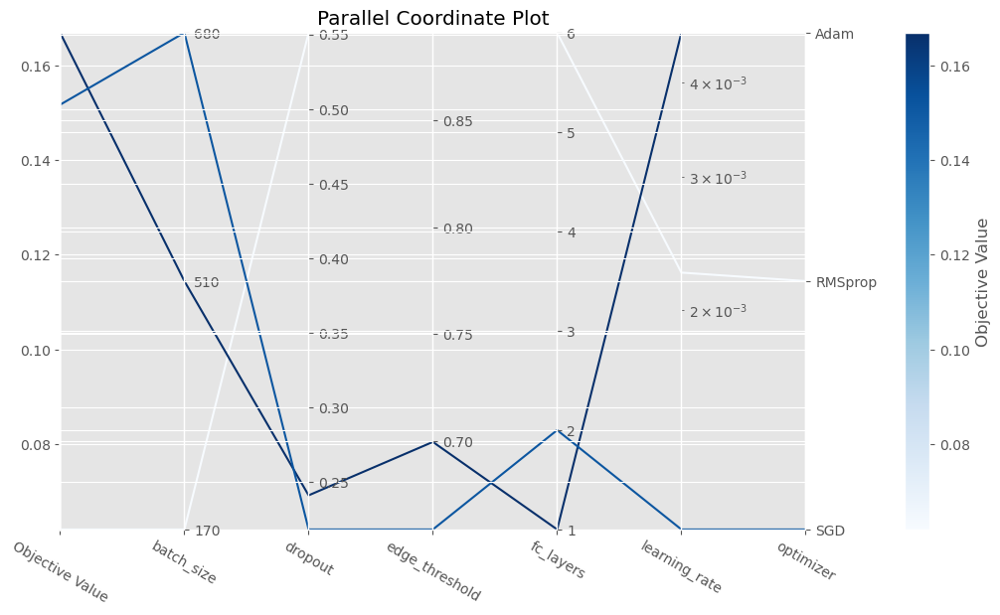

In [ ]:
# Visualize high-dimensional parameter relationships.
plot_parallel_coordinate(study)
set_size(10, 5)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\624402143.py:2: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  plot_contour(study)
[W 2024-06-25 17:55:10,127] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.


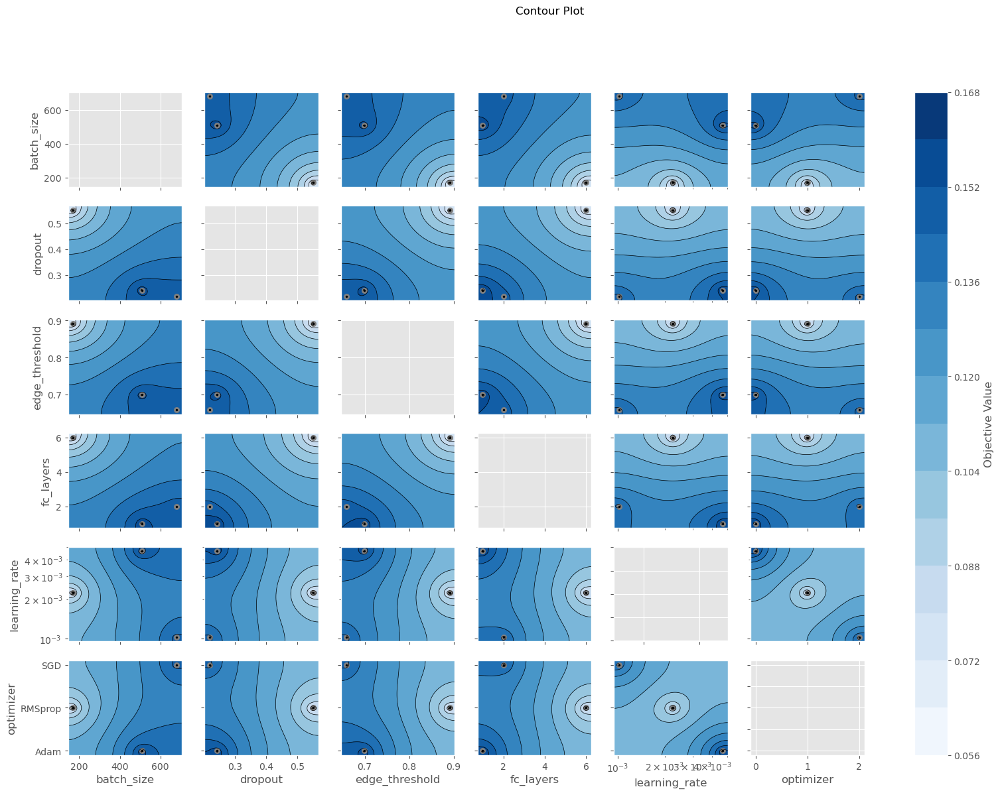

In [ ]:
# Visualize hyperparameter relationships
plot_contour(study)
set_size(15, 10)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1888575690.py:2: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  plot_slice(study)


array([<Axes: xlabel='batch_size', ylabel='Objective Value'>,
       <Axes: xlabel='dropout'>, <Axes: xlabel='edge_threshold'>,
       <Axes: xlabel='fc_layers'>, <Axes: xlabel='learning_rate'>,
       <Axes: xlabel='optimizer'>], dtype=object)

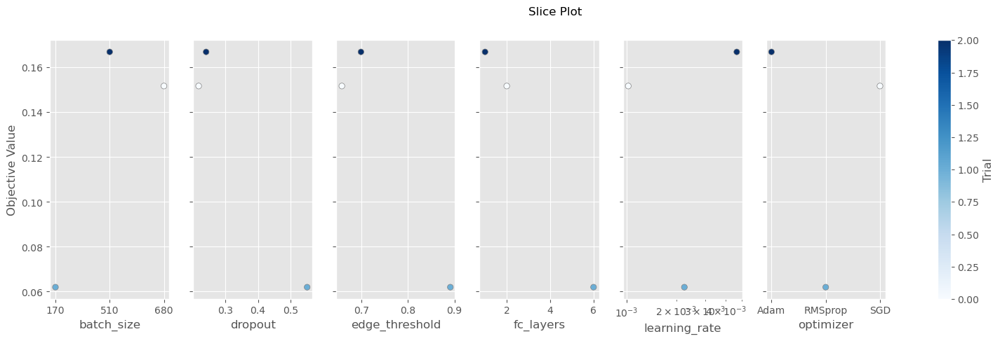

In [ ]:
# Visualize individual hyperparameters as slice plot
plot_slice(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1473508994.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

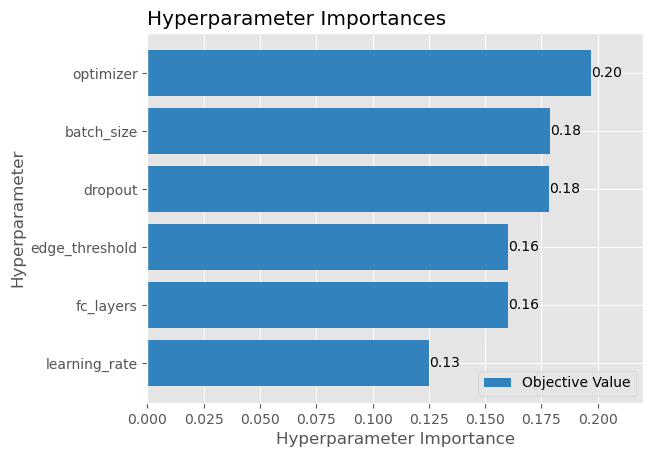

In [ ]:
# Visualize parameter importances.
plot_param_importances(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\3113371256.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

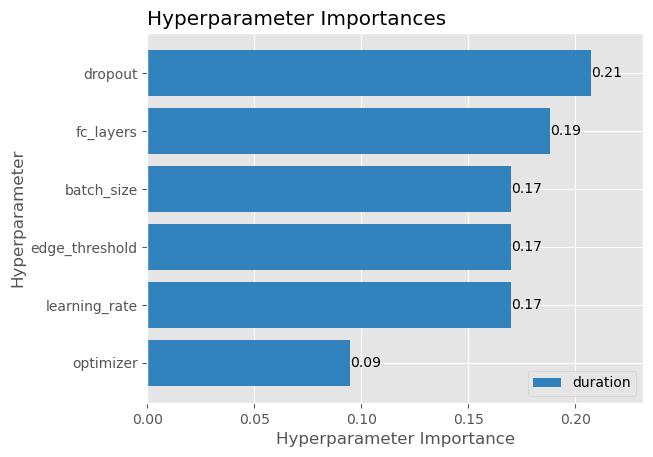

In [ ]:
# Learn which hyperparameters are affecting the trial duration with hyperparameter importance.
plot_param_importances(
    study, target=lambda t: t.duration.total_seconds(), target_name="duration"
)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1828777839.py:2: ExperimentalWarning: plot_edf is experimental (supported from v2.2.0). The interface can change in the future.
  plot_edf(study)


<Axes: title={'center': 'Empirical Distribution Function Plot'}, xlabel='Objective Value', ylabel='Cumulative Probability'>

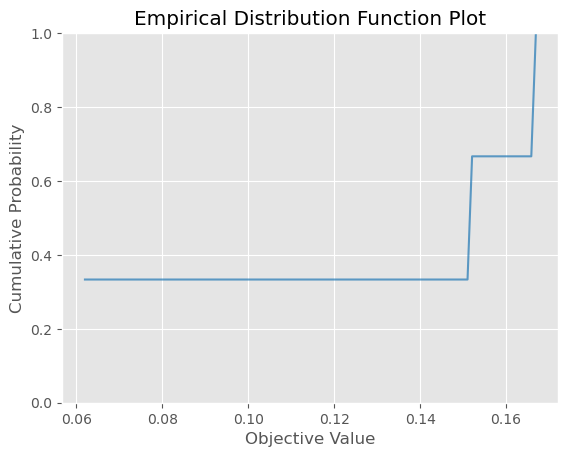

In [ ]:
# Visualize empirical distribution function.
plot_edf(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1172520691.py:2: ExperimentalWarning: plot_rank is experimental (supported from v3.2.0). The interface can change in the future.
  plot_rank(study)
[W 2024-06-25 17:55:23,708] Output figures of this Matplotlib-based `plot_rank` function would be different from those of the Plotly-based `plot_rank`.


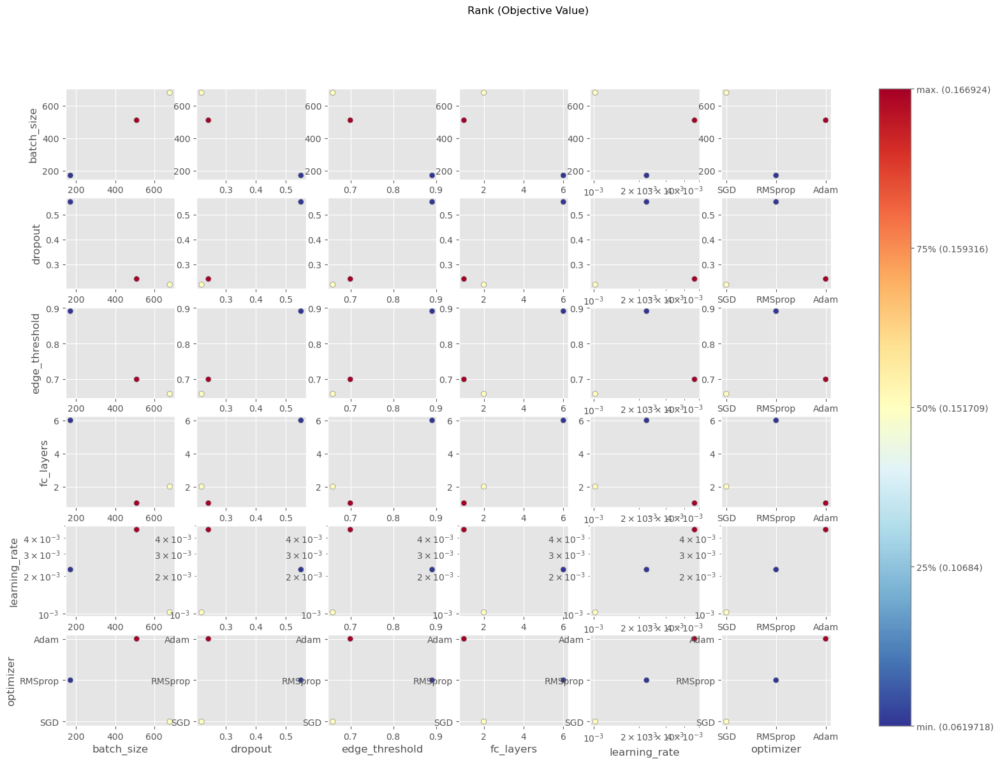

In [ ]:
# Visualize parameter relations with scatter plots colored by objective values.
plot_rank(study)
set_size(15, 10)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\124343896.py:2: ExperimentalWarning: plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.
  plot_timeline(study)


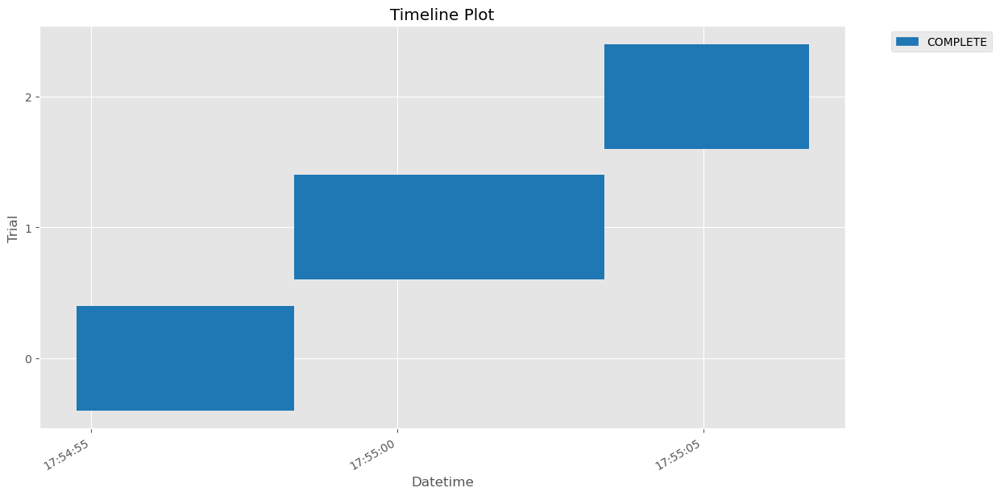

In [ ]:
# Visualize the optimization timeline of performed trials.
plot_timeline(study)
set_size(10, 5)

### Model: graphLambda with edge_attr

In [ ]:
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import RichProgressBar
import logging
import warnings

warnings.filterwarnings("ignore", ".*Consider increasing the value of the `num_workers` argument*")
warnings.filterwarnings("ignore", "Trying to infer the `batch_size` from an ambiguous collection.*")
torch.set_float32_matmul_precision('high')
logging.getLogger("lightning.pytorch.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

def objective(trial):
    # Suggest values for the hyperparameters
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    batch_size = trial.suggest_categorical('batch_size', [170, 340, 510, 680, 850])
    fc_layers = trial.suggest_int('fc_layers', 1, 8)
    dropout = trial.suggest_float('dropout', 0, 0.8)
    hyperparameters = dict(learning_rate=learning_rate, optimizer_name=optimizer_name, batch_size=batch_size, fc_layers=fc_layers, dropout=dropout)
    print(f'Tested parameters: {hyperparameters}')
    n_epochs = batch_size * 4 # vary training epochs based on batch size


    # Create the model
    model = graphLambda_w_edge_attr(learning_rate=learning_rate, optimizer_name=optimizer_name, fc_layers=fc_layers, dropout=dropout)

    

    # Create checkpoint callback
    checkpoint_callback = ModelCheckpoint(monitor='val_f1',
                                        mode='max',
                                        save_top_k=3,
                                        filename='{epoch}-{train_loss:.2f}-{train_f1:.2f}-{val_loss:.2f}-{val_f1:.2f}',
                                        )

    # Create the PyTorch Lightning trainer
    trainer = Trainer(
        accelerator='gpu',
        devices=1,
        max_epochs=n_epochs,
        callbacks=[PyTorchLightningPruningCallback(trial, monitor="val_f1"), checkpoint_callback],
        enable_progress_bar=False,
        enable_model_summary=False,
        logger=True,
        enable_checkpointing=True,
    )

    # Define the data loaders
    train_loader = DataLoader(X_train, batch_size=batch_size, shuffle=True,
                              drop_last=True) # , num_workers=0, persistent_workers=True
    val_loader = DataLoader(X_val, batch_size=len(X_val), shuffle=False,
                            drop_last=True) # , num_workers=0, persistent_workers=True

    # Log the hyperparameters
    trainer.logger.log_hyperparams(hyperparameters)

    # Train the model
    trainer.fit(model, train_loader, val_loader)

    # Evaluate the model
    val_f1 = trainer.callback_metrics["val_f1"].item()

    # After training, store the best model path in the trial's user attributes
    trial.set_user_attr("best_model_path", checkpoint_callback.best_model_path)

    return val_f1

study = optuna.create_study(direction='maximize', pruner=optuna.pruners.ThresholdPruner(lower=0.1, n_warmup_steps=100))
study.optimize(objective, n_trials=100)

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

df = study.trials_dataframe()
df.to_pickle('ratio_results_w_edge_attrs_trials.pkl')

[I 2024-06-25 17:55:29,398] A new study created in memory with name: no-name-7cf9e5d6-1250-47ec-a9c7-eed53303cf7e
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Tested parameters: {'learning_rate': 0.00013278284142027356, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 8, 'dropout': 0.4042092133506495}


c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:298: The number of training batches (8) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
`Trainer.fit` stopped: `max_epochs=10` reached.
[I 2024-06-25 17:55:36,283] Trial 0 finished with value: 0.06666667014360428 and parameters: {'learning_rate': 0.00013278284142027356, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 8, 'dropout': 0.4042092133506495}. Best is trial 0 with value: 0.06666667014360428.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Tested parameters: {'learning_rate': 0.009252175179655944, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 1, 'dropout': 0.7898641340733752}


c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:298: The number of training batches (2) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
`Trainer.fit` stopped: `max_epochs=10` reached.
[I 2024-06-25 17:55:40,225] Trial 1 finished with value: 0.0727311223745346 and parameters: {'learning_rate': 0.009252175179655944, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 1, 'dropout': 0.7898641340733752}. Best is trial 1 with value: 0.0727311223745346.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Tested parameters: {'learning_rate': 0.010219079538503312, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.5487853168698092}


`Trainer.fit` stopped: `max_epochs=10` reached.
[I 2024-06-25 17:55:44,348] Trial 2 finished with value: 0.06197183579206467 and parameters: {'learning_rate': 0.010219079538503312, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.5487853168698092}. Best is trial 1 with value: 0.0727311223745346.


Best trial:
  Value: 0.0727311223745346
  Params: 
    learning_rate: 0.009252175179655944
    optimizer: Adam
    batch_size: 510
    fc_layers: 1
    dropout: 0.7898641340733752


In [ ]:
# print the best model path for later tensorboard visualization
print(f'Best model path: {trial.user_attrs["best_model_path"]}')

Best model path: d:\Documents\RU\Master_Neurobiology\Internship_jaar_2\Project\Notebooks\lightning_logs\version_40\checkpoints\epoch=3-train_loss=6.70-train_f1=0.15-val_loss=12.70-val_f1=0.19.ckpt


{'learning_rate': 0.009252175179655944, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 1, 'dropout': 0.7898641340733752}


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          val_f1           │    0.18934160470962524    │
│         val_loss          │    12.701492309570312     │
└───────────────────────────┴───────────────────────────┘

classification report:
               precision    recall  f1-score   support

        ADHD       0.30      0.24      0.27       132
     HEALTHY       0.24      0.60      0.34       144
         MDD       0.28      0.40      0.33       168
         OCD       0.00      0.00      0.00        96
         SMC       0.20      0.01      0.01       180

    accuracy                           0.26       720
   macro avg       0.20      0.25      0.19       720
weighted avg       0.22      0.26      0.20       720

F1-score: 0.18934160502218578


c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


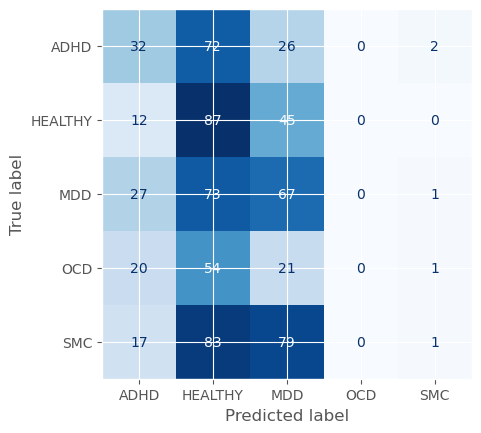

In [ ]:
# final eval on val data for the best model during tuning
# get best model
best_model_path = trial.user_attrs["best_model_path"]
print(trial.params)
learning_rate = trial.params['learning_rate']
optimizer_name = trial.params['optimizer']
dropout = trial.params['dropout']
fc_layers = trial.params['fc_layers']
# Load the model directly from the checkpoint
model = graphLambda_w_edge_attr.load_from_checkpoint(best_model_path, learning_rate=learning_rate, optimizer_name=optimizer_name, dropout=dropout, fc_layers=fc_layers)

print(model.hparams)

val_loader = DataLoader(X_val, batch_size=len(X_val), shuffle=False,
                            drop_last=True)

trainer = Trainer(accelerator='gpu', devices=1, enable_progress_bar=False, enable_model_summary=False, logger=False, enable_checkpointing=False)
trainer.validate(model, val_loader)

# compute confusion matrix and classification report with sklearn of best model checkpoint
from sklearn.metrics import f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
y_pred = trainer.predict(model, val_loader)
y_pred = np.concatenate(y_pred).flatten()
y = Y_val

class_labels = le.inverse_transform(sorted(np.unique(y)))
print('classification report:\n', classification_report(y, y_pred, target_names=class_labels))
print('F1-score:', f1_score(y, y_pred, average="macro"))
cm = confusion_matrix(y, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False)
plt.grid(False)


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          val_f1           │    0.09874597191810608    │
│         val_loss          │    17.399307250976562     │
└───────────────────────────┴───────────────────────────┘

classification report:
               precision    recall  f1-score   support

        ADHD       0.32      0.07      0.12       108
     HEALTHY       0.00      0.00      0.00       108
         MDD       0.23      0.96      0.37       108
         OCD       0.00      0.00      0.00       108
         SMC       0.00      0.00      0.00       108

    accuracy                           0.21       540
   macro avg       0.11      0.21      0.10       540
weighted avg       0.11      0.21      0.10       540

F1-score:
 0.09874596725206193


c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\tuur\anaconda3\envs\mne\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


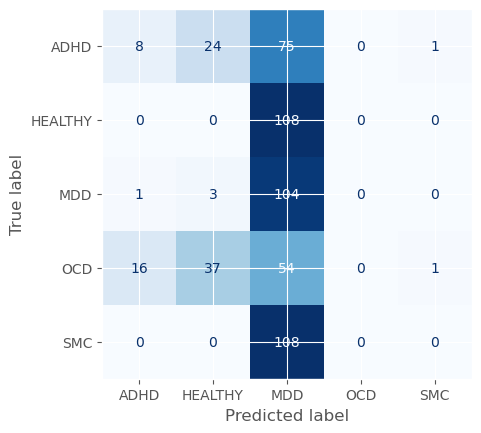

In [ ]:
# final eval on test data for the best model during tuning

test_loader = DataLoader(X_test, batch_size=len(X_test), shuffle=False,
                            drop_last=True)

trainer = Trainer(accelerator='gpu', devices=1, enable_progress_bar=False, enable_model_summary=False, logger=False, enable_checkpointing=False)
trainer.validate(model, test_loader)

# compute confusion matrix and classification report with sklearn of best model checkpoint
from sklearn.metrics import f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
y_pred = trainer.predict(model, test_loader)
y_pred = np.concatenate(y_pred).flatten()
y = Y_test

class_labels = le.inverse_transform(sorted(np.unique(y)))
print('classification report:\n', classification_report(y, y_pred, target_names=class_labels))
print('F1-score:\n', f1_score(y, y_pred, average="macro"))
cm = confusion_matrix(y, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False)
plt.grid(False)


In [ ]:
df_trials = pd.read_pickle('ratio_results_w_edge_attrs_trials.pkl')
df_trials.sort_values('value', ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_fc_layers,params_learning_rate,params_optimizer,user_attrs_best_model_path,state
1,1,0.072731,2024-06-25 17:55:36.284295,2024-06-25 17:55:40.225874,0 days 00:00:03.941579,510,0.789864,1,0.009252,Adam,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE
0,0,0.066667,2024-06-25 17:55:29.399023,2024-06-25 17:55:36.283284,0 days 00:00:06.884261,170,0.404209,8,0.000133,Adam,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE
2,2,0.061972,2024-06-25 17:55:40.226871,2024-06-25 17:55:44.348620,0 days 00:00:04.121749,680,0.548785,3,0.010219,RMSprop,d:\Documents\RU\Master_Neurobiology\Internship...,COMPLETE


#### Visualizations

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1755039964.py:2: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

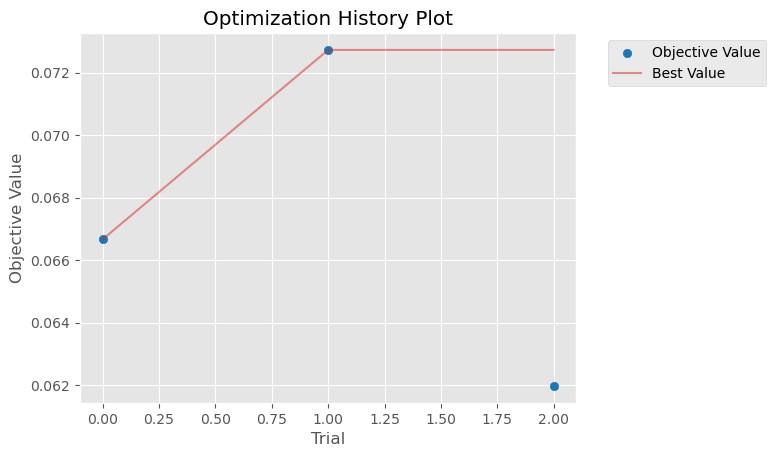

In [ ]:
# Visualize the optimization history
plot_optimization_history(study)

[I 2024-06-25 17:55:46,226] A new study created in memory with name: no-name-8d504d16-52a2-4820-9e8a-d846b78b8135
C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\3414932042.py:7: ExperimentalWarning: plot_intermediate_values is experimental (supported from v2.2.0). The interface can change in the future.
  plot_intermediate_values(plotted_study)


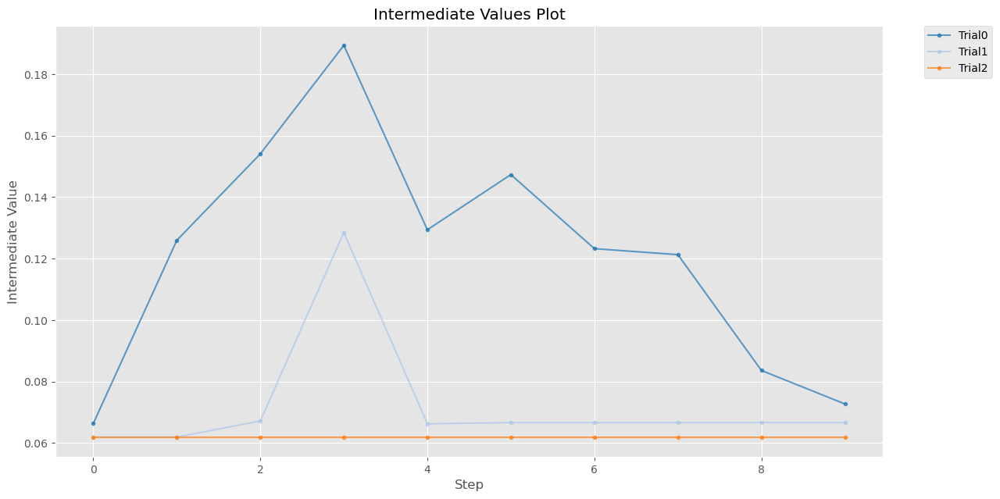

In [ ]:
# Visualize the learning curves of the best 10 trials
trials = study.trials
plotted_trials = sorted(trials, key=lambda t: t.value, reverse=True)[:10]
plotted_study = optuna.create_study()
for trial in plotted_trials:
    plotted_study.add_trial(trial)
plot_intermediate_values(plotted_study)
set_size(10, 5)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\2919792376.py:2: ExperimentalWarning: plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  plot_parallel_coordinate(study)


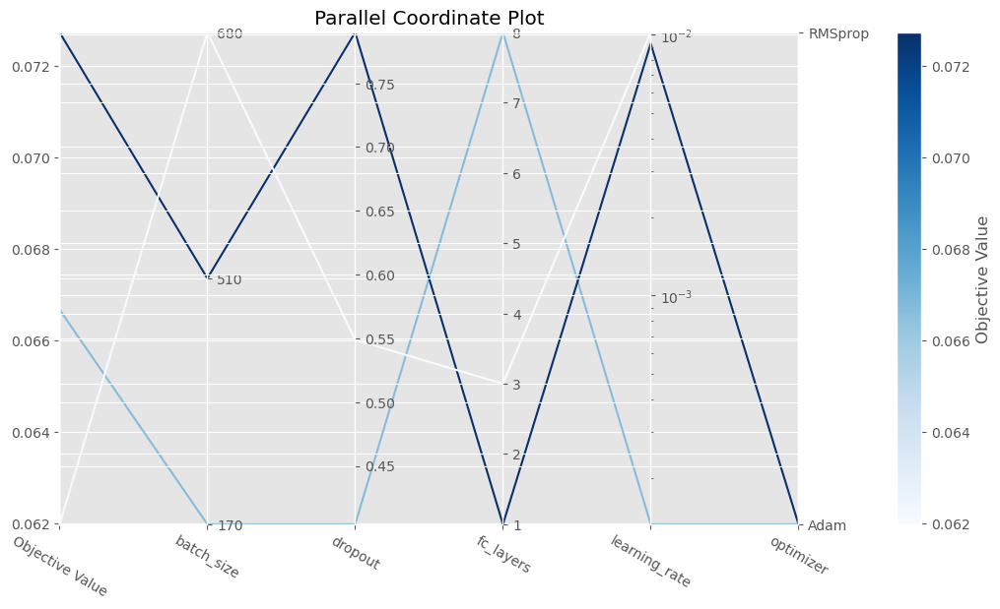

In [ ]:
# Visualize high-dimensional parameter relationships.
plot_parallel_coordinate(study)
set_size(10, 5)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\624402143.py:2: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  plot_contour(study)
[W 2024-06-25 17:55:48,637] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.


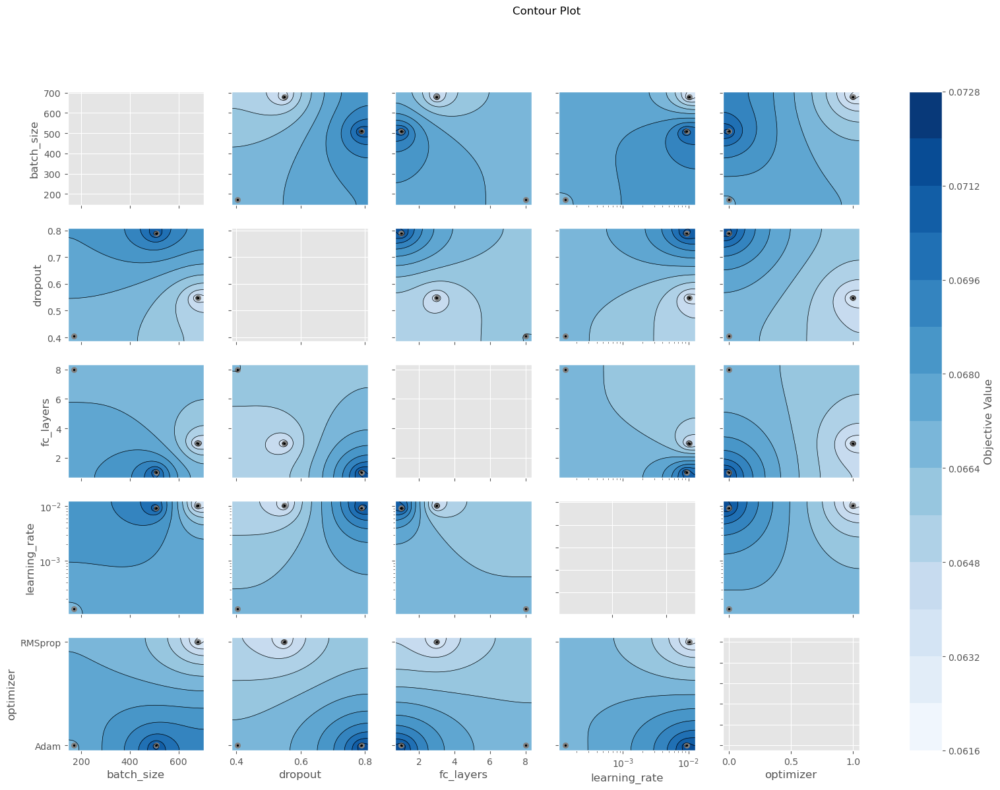

In [ ]:
# Visualize hyperparameter relationships
plot_contour(study)
set_size(15, 10)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1888575690.py:2: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  plot_slice(study)


array([<Axes: xlabel='batch_size', ylabel='Objective Value'>,
       <Axes: xlabel='dropout'>, <Axes: xlabel='fc_layers'>,
       <Axes: xlabel='learning_rate'>, <Axes: xlabel='optimizer'>],
      dtype=object)

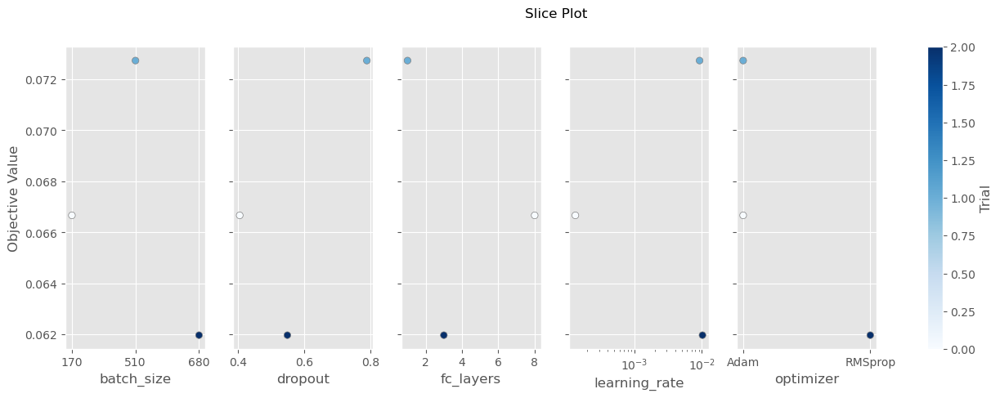

In [ ]:
# Visualize individual hyperparameters as slice plot
plot_slice(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1473508994.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

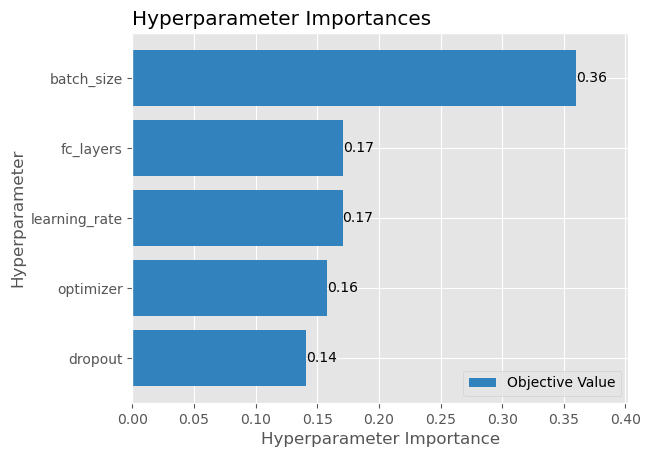

In [ ]:
# Visualize parameter importances.
plot_param_importances(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\3113371256.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

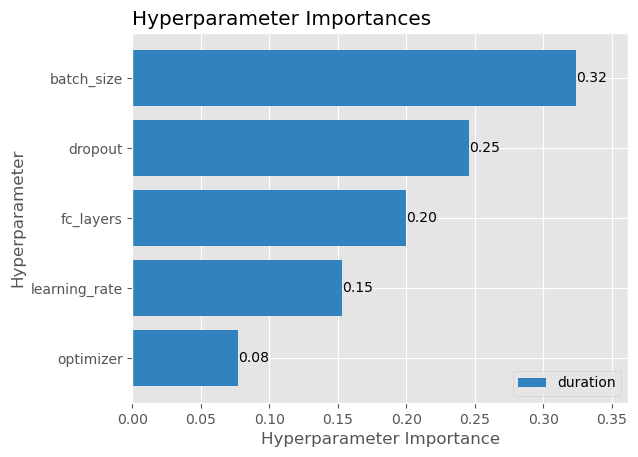

In [ ]:
# Learn which hyperparameters are affecting the trial duration with hyperparameter importance.
plot_param_importances(
    study, target=lambda t: t.duration.total_seconds(), target_name="duration"
)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1828777839.py:2: ExperimentalWarning: plot_edf is experimental (supported from v2.2.0). The interface can change in the future.
  plot_edf(study)


<Axes: title={'center': 'Empirical Distribution Function Plot'}, xlabel='Objective Value', ylabel='Cumulative Probability'>

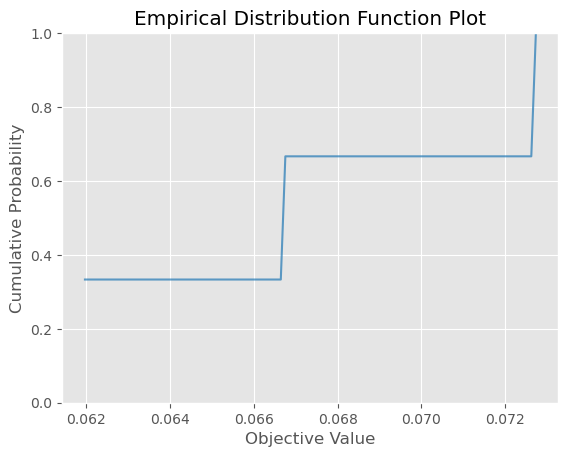

In [ ]:
# Visualize empirical distribution function.
plot_edf(study)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\1172520691.py:2: ExperimentalWarning: plot_rank is experimental (supported from v3.2.0). The interface can change in the future.
  plot_rank(study)
[W 2024-06-25 17:55:58,413] Output figures of this Matplotlib-based `plot_rank` function would be different from those of the Plotly-based `plot_rank`.


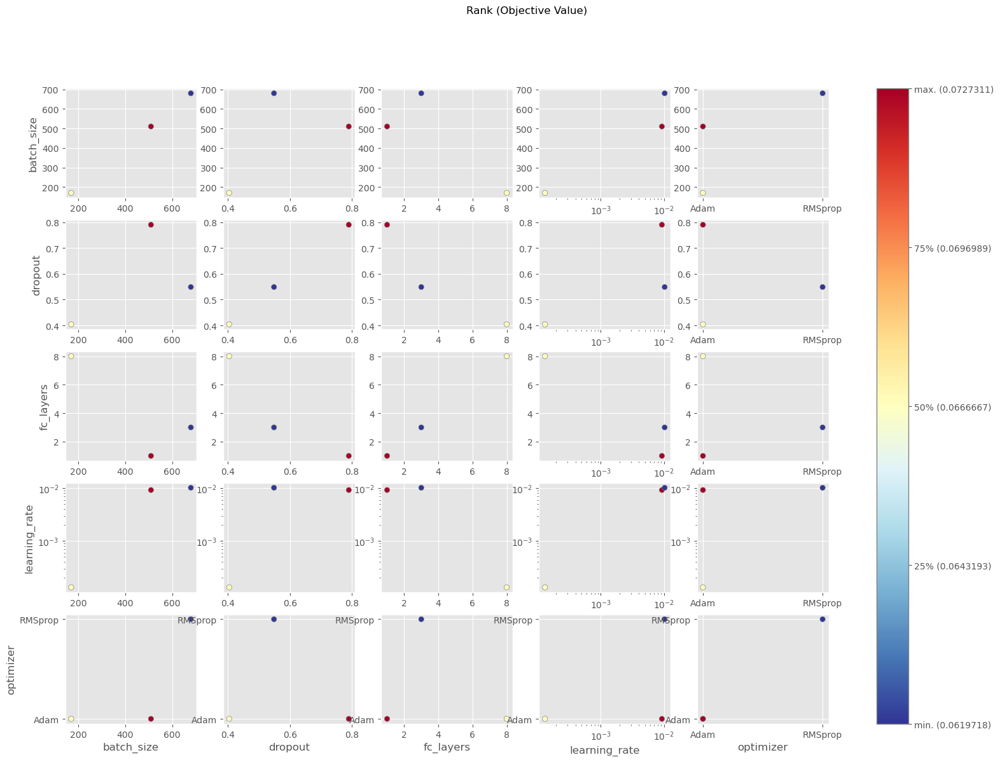

In [ ]:
# Visualize parameter relations with scatter plots colored by objective values.
plot_rank(study)
set_size(15, 10)

C:\Users\tuur\AppData\Local\Temp\ipykernel_2856\124343896.py:2: ExperimentalWarning: plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.
  plot_timeline(study)


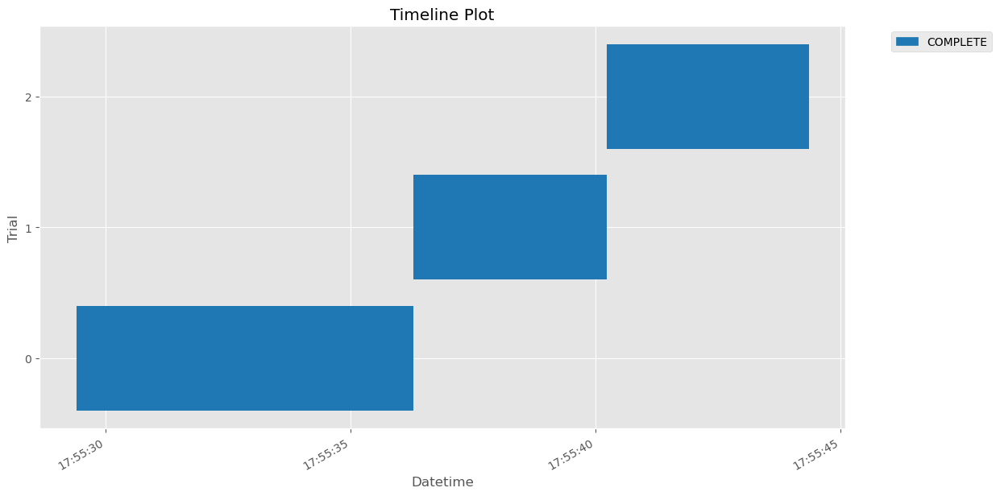

In [ ]:
# Visualize the optimization timeline of performed trials.
plot_timeline(study)
set_size(10, 5)